Выясним мои номерочечки


In [54]:
from zlib import crc32
import numpy as np

if __name__=='__main__':
    mail = "ayvazov.da@phystech.edu" #input('enter phystech e-mail\n') 
    to_hash =  mail.strip().split('@')[0]    
    h = crc32(to_hash.encode('utf-8'))
    seed = h%(2**32-1)
    rs = np.random.RandomState(seed)
    task1 = rs.randint(low=1, high=5)
    task2 = rs.randint(low=1, high=5)
    task3 = rs.randint(low=1, high=5)
    task4 = rs.randint(low=1, high=4)
    print ('Your tasks are 1.{}, 2.{}, 3.{}, 4.{}'.format(task1, task2, task3, task4))

Your tasks are 1.3, 2.3, 3.4, 4.1


In [0]:
# немного импортов
import numpy.random
import numpy as np
import pandas as pd
import csv
import numpy as np 
import pandas as pd
import scipy.stats as st
from tqdm import tqdm
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import gridspec
%matplotlib inline

import seaborn as sns
mpl.style.use('seaborn')

from statsmodels.stats.descriptivestats import sign_test

# 1.3 
Проверить мощность и консервативность критерия Уликоксона о равенстве медиан для выборок вида: X1: ~ alpha * N(0,1) + (1-alpha) * N(2, 4);

X2: ~ alpha * N(0,1) + (1-alpha) * N(2, 4) + delta.

Здесь delta --- сдвиг, дающий возможность разделить выборки X1 и X2.

Изучить зависимость от alpha и delta.

Важно: распределение является гауссовой смесью, это не сумма гауссовых величин пример как сэмплировать



In [0]:

dep_n,dep_y1,dep_ys = [],[],[]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=11664793.0, pvalue=0.0)


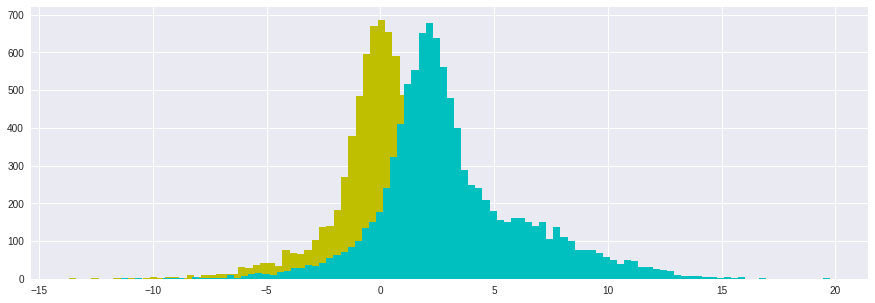

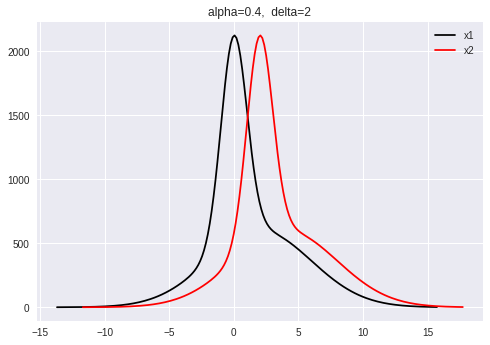

0.0

In [62]:
plt.figure(figsize=(15,5))
n = 10000
norm_params = np.array([[0, 1],  [2, 4]])
result, power = [], []
def plotting(alpha, delta, pic = True):
    """
    По заданным альфа и дельта генерит два распределения (теория+семпл) и считает Уилкоксона,
    """
    numpy.random.seed(42)
    weights = np.array([alpha, (1-alpha)])
    mixture_idx = numpy.random.choice(len(weights), size=n, replace=True, p=weights)    
    y1 = numpy.fromiter((st.norm.rvs(*(norm_params[i])) for i in mixture_idx),dtype=np.float64)
    y2 = numpy.fromiter((st.norm.rvs(*(norm_params[i])) for i in mixture_idx), dtype=np.float64)+delta
    xs1 = np.linspace(y1.min(), y1.max(), 200)
    xs2 = np.linspace(y1.min(), y1.max(), 200) + delta

    result.append((alpha, delta, st.wilcoxon(y2-y1)[1]))
    print('\n Посчитаем Уилкоксона: {}'.format(st.wilcoxon(y2-y1)))
    
    if pic:     
        ys = np.zeros_like(xs1)
        ys += st.norm.pdf(xs1, loc=0, scale=1) * alpha *n 
        ys += st.norm.pdf(xs1, loc=2, scale=4) * (1-alpha) *n 
        
        plt.hist(y1, color = 'y', bins="fd", label='x1s')
        plt.hist(y2, color = 'c', bins="fd", label='x2s')
        plt.show()
        plt.plot(xs1, ys, color = 'k',label='x1')
        plt.plot(xs2, ys, color = 'r',label='x2')
        plt.title('alpha={},  delta={}'.format(alpha, delta))
        plt.legend()
        plt.show()
        #dep_y1.append(max(y1))
        #dep_ys.append(max(ys))
        #dep_n.append(n)
    return st.wilcoxon(y2-y1)[1]

plotting(0.4, 2)


  0%|          | 0/9 [00:00<?, ?it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2520.0, pvalue=0.9862837441089826)


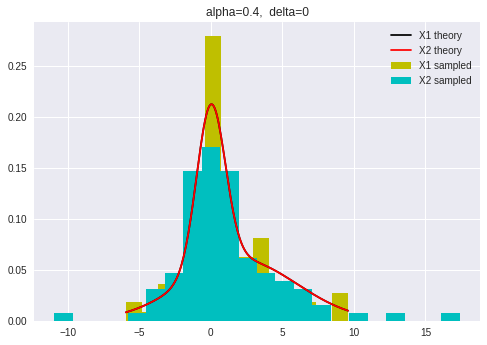

 11%|█         | 1/9 [00:00<00:01,  4.05it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2520.0, pvalue=0.9862837441089826)


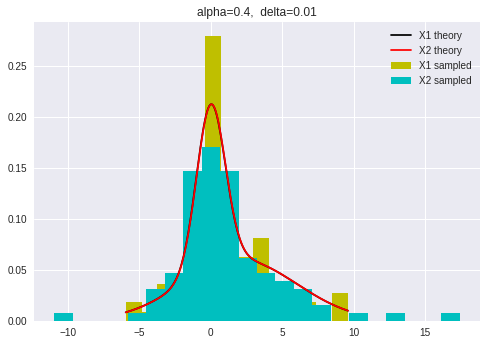

 22%|██▏       | 2/9 [00:00<00:01,  4.08it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2503.0, pvalue=0.9397030087863819)


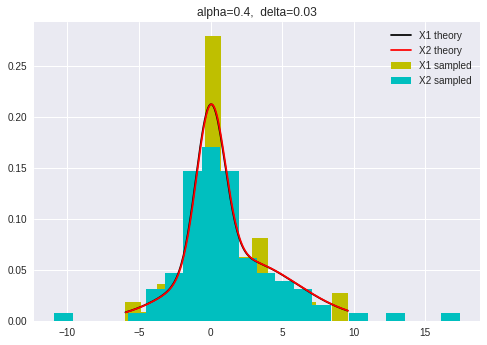

 33%|███▎      | 3/9 [00:00<00:01,  4.07it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2493.0, pvalue=0.9123884418157544)


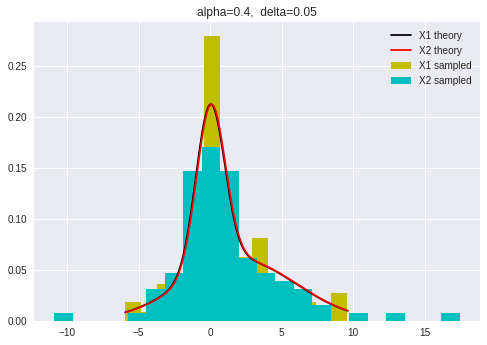

 44%|████▍     | 4/9 [00:00<00:01,  4.09it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


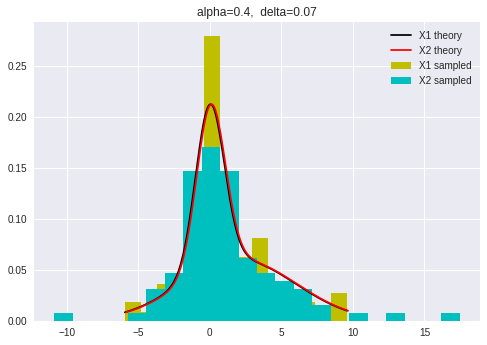

 56%|█████▌    | 5/9 [00:01<00:00,  4.07it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


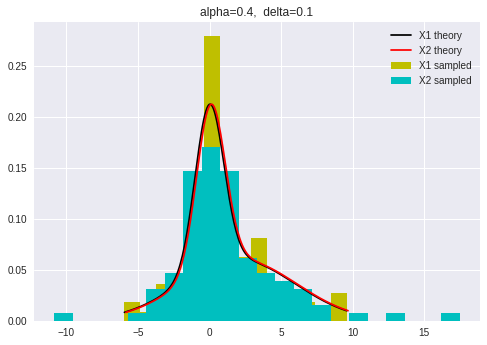

 67%|██████▋   | 6/9 [00:01<00:00,  3.54it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2359.0, pvalue=0.5681610364103444)


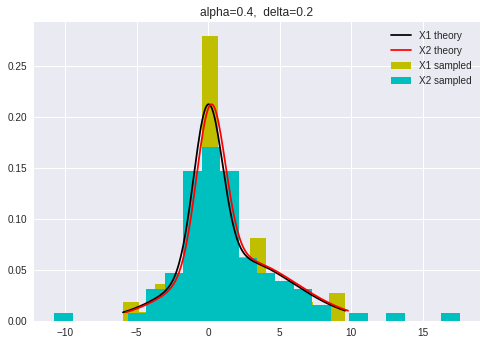

 78%|███████▊  | 7/9 [00:01<00:00,  3.66it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2079.0, pvalue=0.12515445955953292)


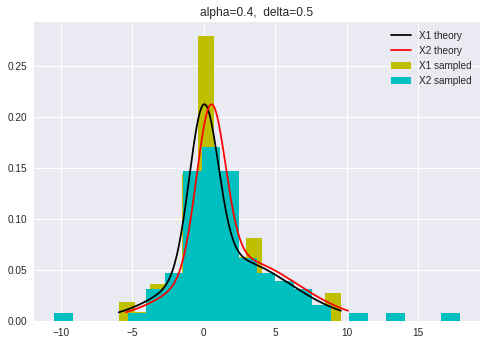

 89%|████████▉ | 8/9 [00:02<00:00,  3.72it/s]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=1650.0, pvalue=0.0026251122102243342)


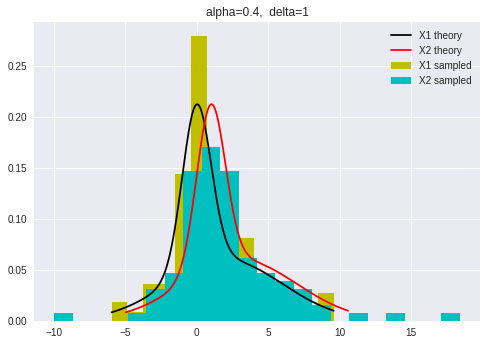

100%|██████████| 9/9 [00:02<00:00,  3.84it/s]


In [84]:
for delta in tqdm([0, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.5, 1]):
    for alpha in [0.4]: 
        plotting(alpha, delta)



 n 


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2490.0, pvalue=0.9042127340742919)


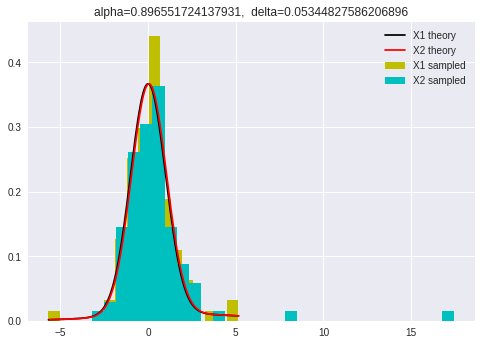


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2468.0, pvalue=0.8446222853530765)


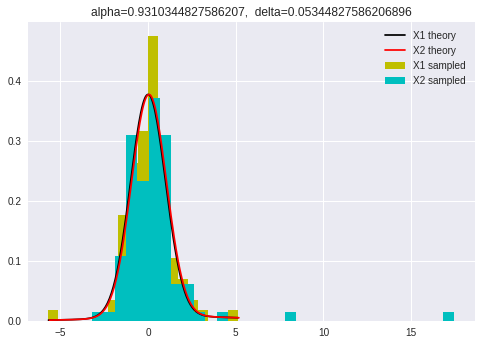


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2447.0, pvalue=0.7885535816793301)


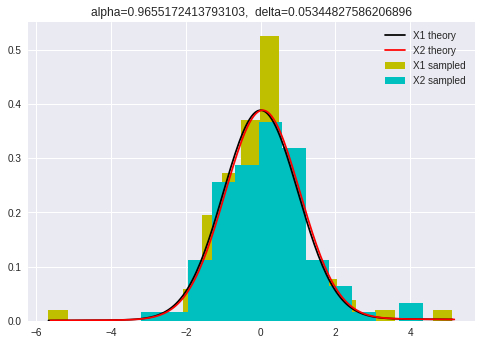


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2423.0, pvalue=0.7258065723197727)


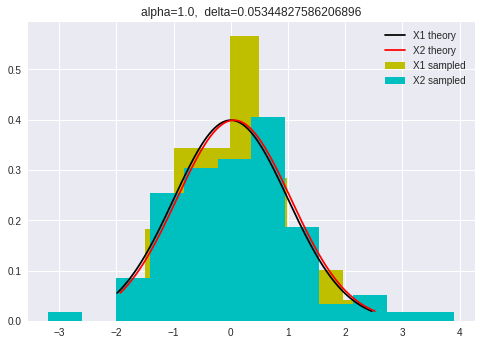

 33%|███▎      | 10/30 [01:23<02:47,  8.35s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2511.0, pvalue=0.9616074190130767)


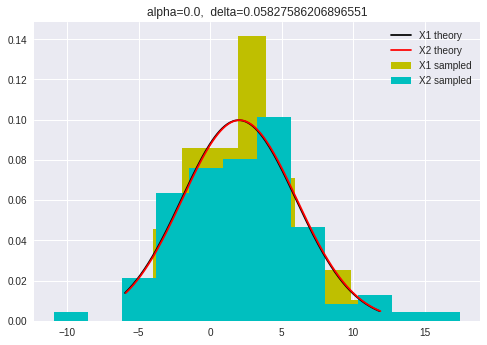


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2482.0, pvalue=0.8824627520873338)


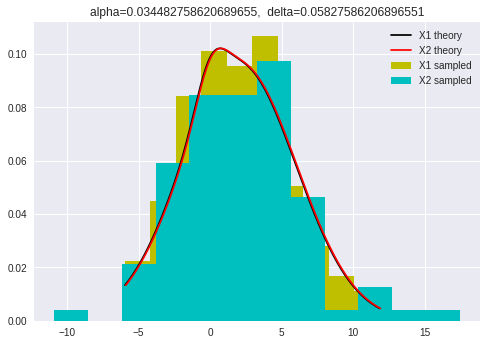


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2464.0, pvalue=0.8338723094405576)


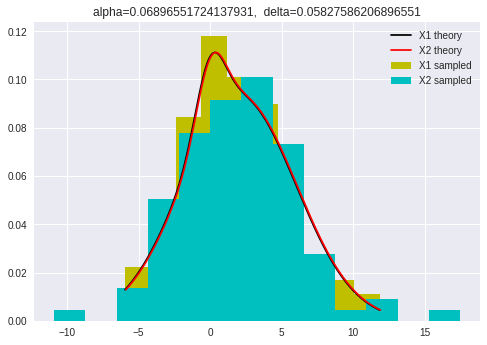


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


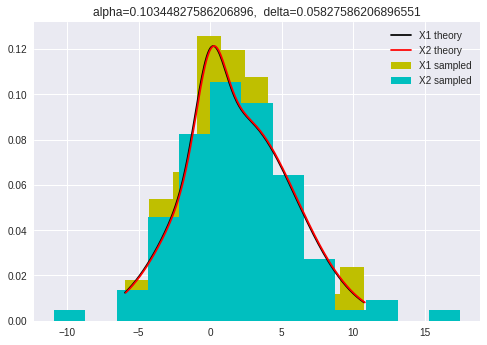


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2462.0, pvalue=0.8285088118253296)


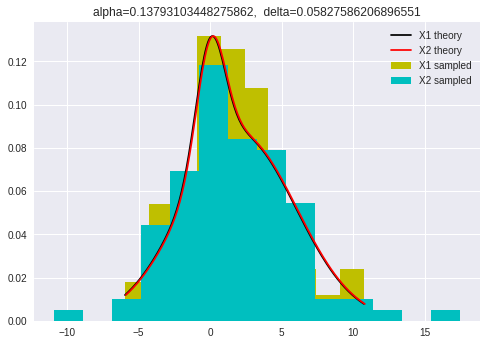


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2493.0, pvalue=0.9123884418157544)


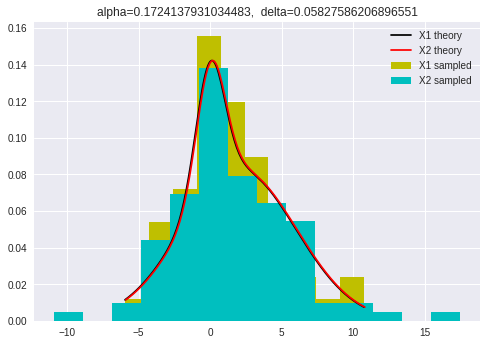


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2483.0, pvalue=0.8851770022716838)


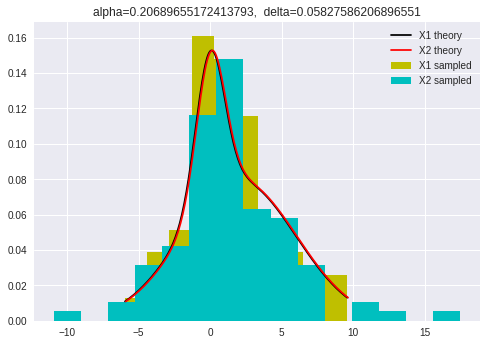


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2457.0, pvalue=0.8151355219610021)


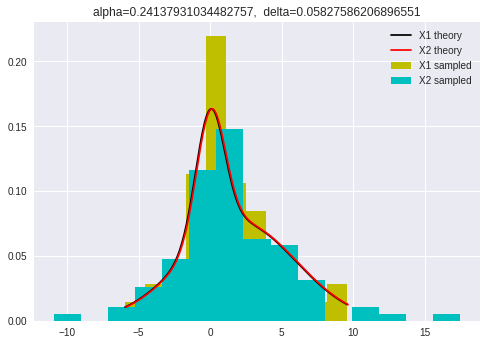


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2501.0, pvalue=0.9342333768907125)


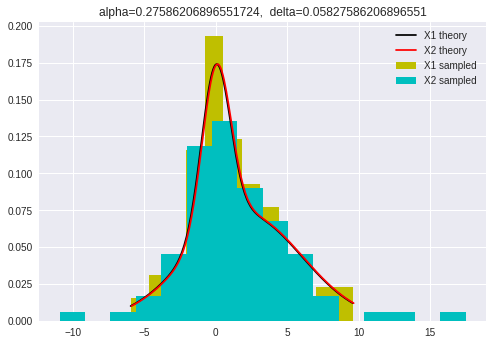


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2491.0, pvalue=0.9069368853915614)


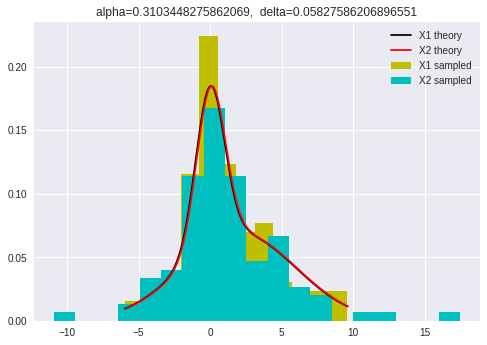


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2522.0, pvalue=0.9917699870208231)


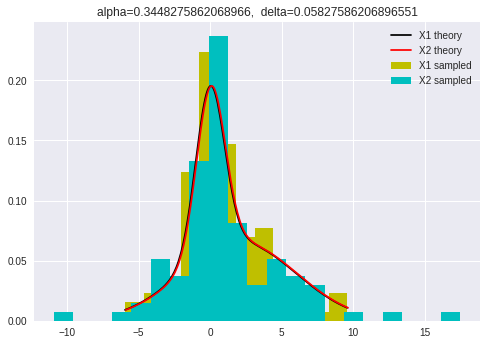


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2503.0, pvalue=0.9397030087863819)


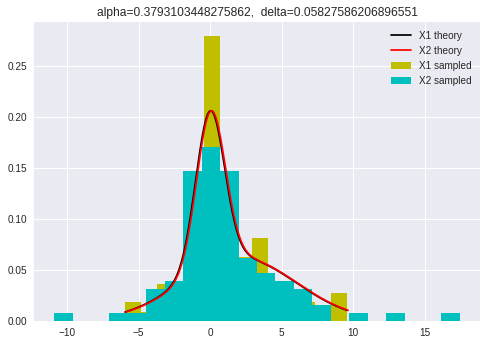


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2481.0, pvalue=0.8797498813382739)


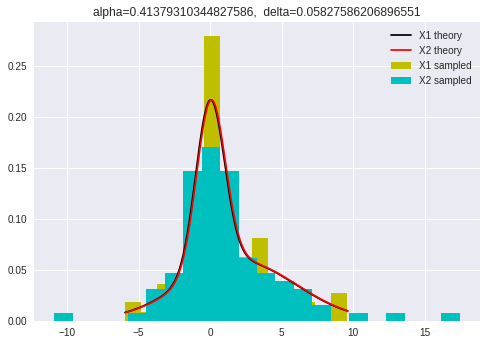


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2514.0, pvalue=0.9698299436867753)


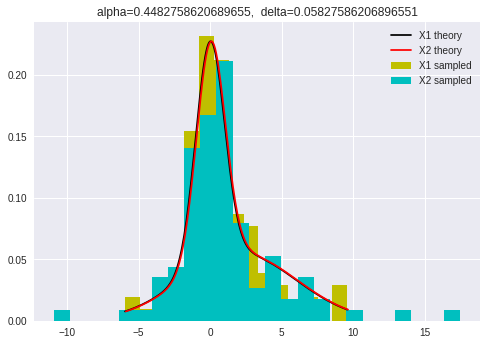


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2514.0, pvalue=0.9698299436867753)


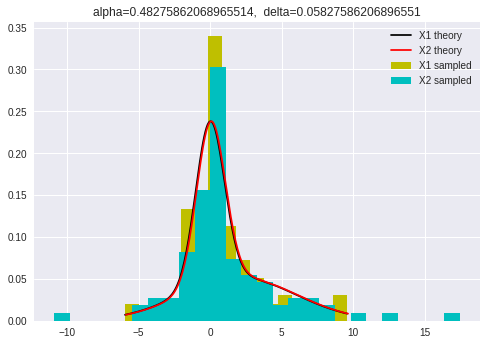


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2516.0, pvalue=0.9753134632163343)


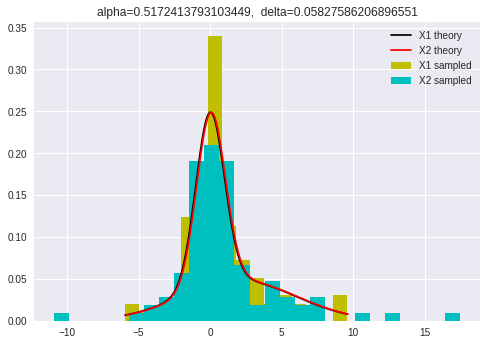


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2481.0, pvalue=0.8797498813382739)


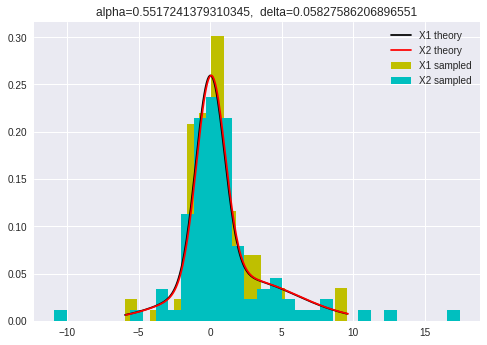


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2504.0, pvalue=0.9424389080177923)


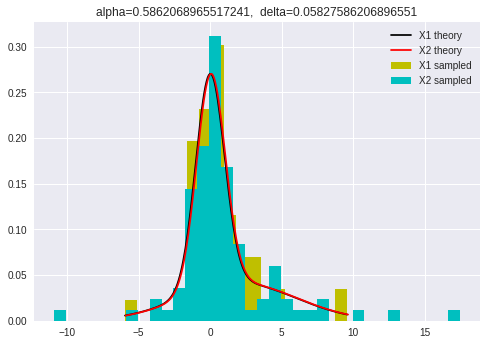


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2504.0, pvalue=0.9424389080177923)


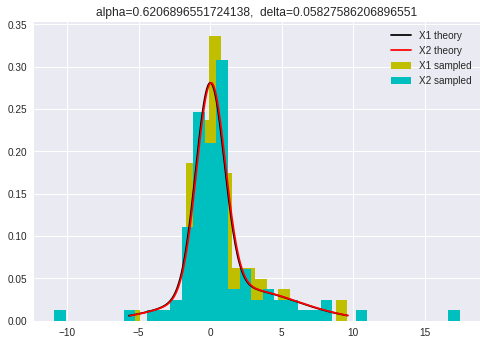


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2475.0, pvalue=0.8635033772834252)


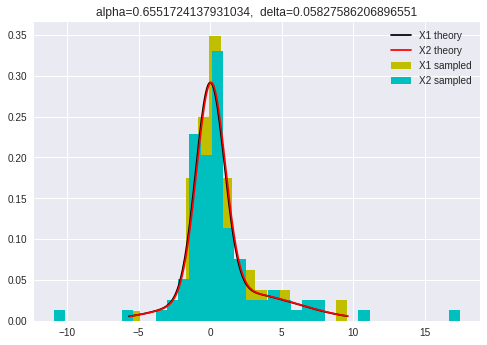


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


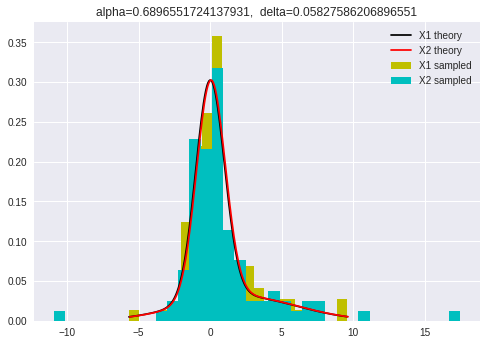


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


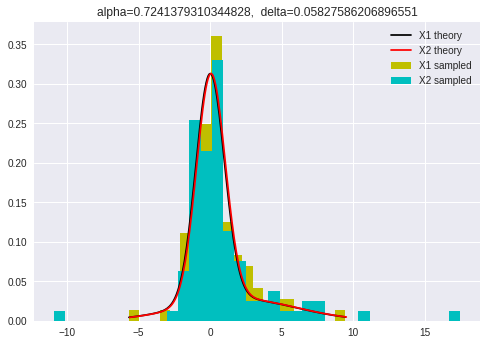


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2442.0, pvalue=0.7753522914731348)


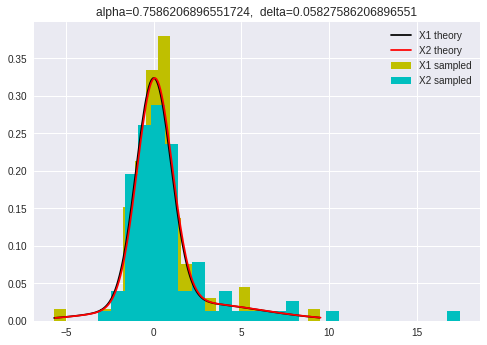


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


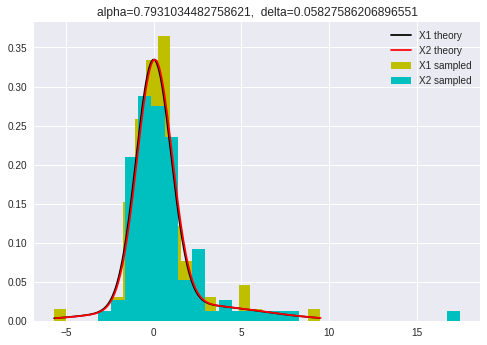


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2523.0, pvalue=0.9945132706275845)


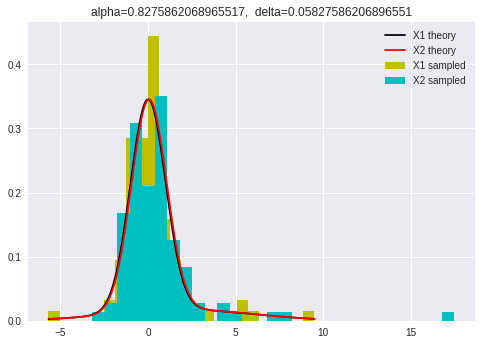


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2490.0, pvalue=0.9042127340742919)


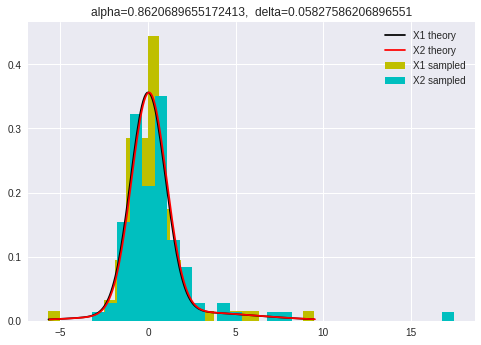


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2482.0, pvalue=0.8824627520873338)


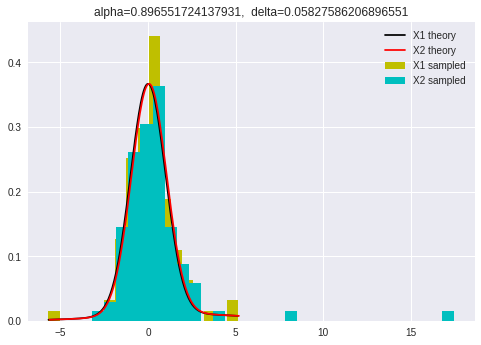


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


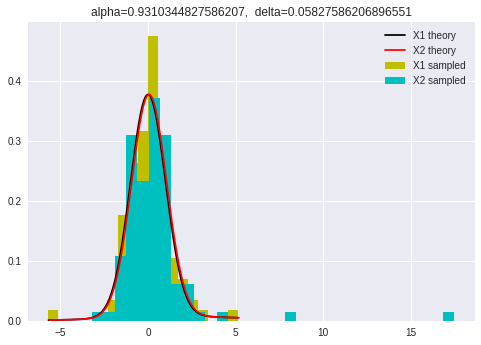


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


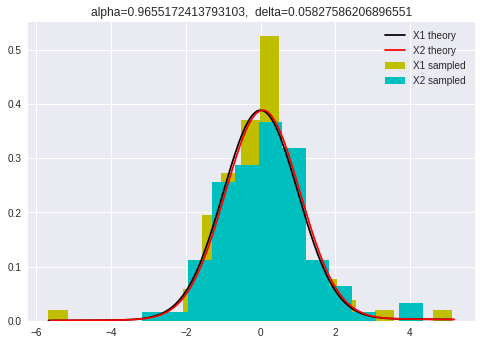


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2414.0, pvalue=0.7027179816787763)


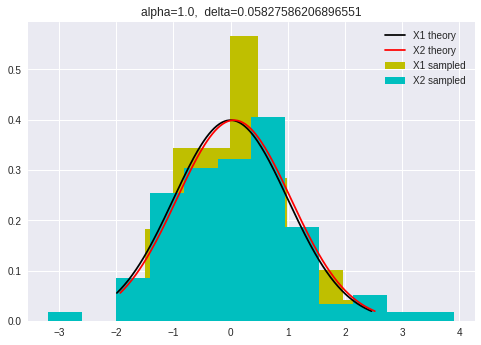

 37%|███▋      | 11/30 [01:31<02:38,  8.34s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2509.0, pvalue=0.956127949633218)


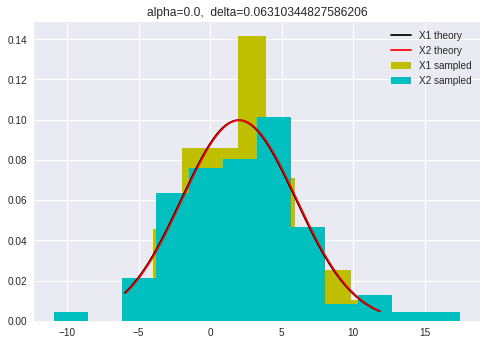


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2480.0, pvalue=0.8770384213786963)


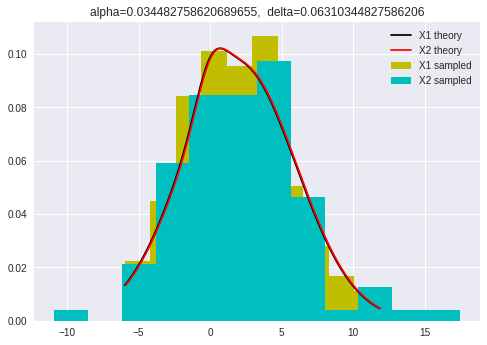


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2462.0, pvalue=0.8285088118253296)


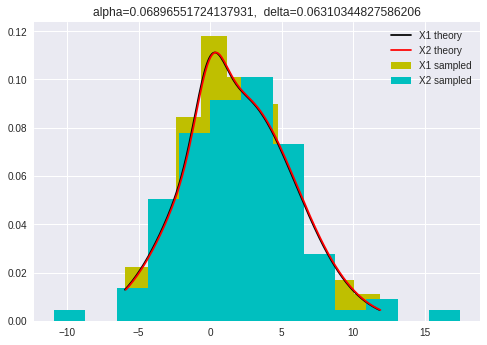


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2453.0, pvalue=0.8044753358016482)


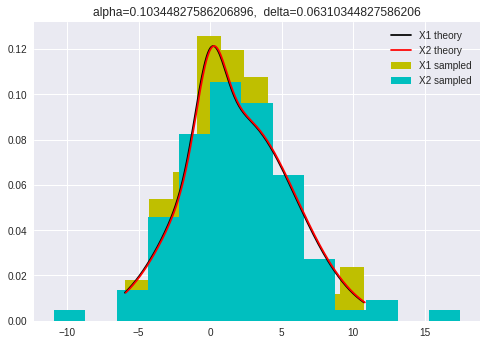


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


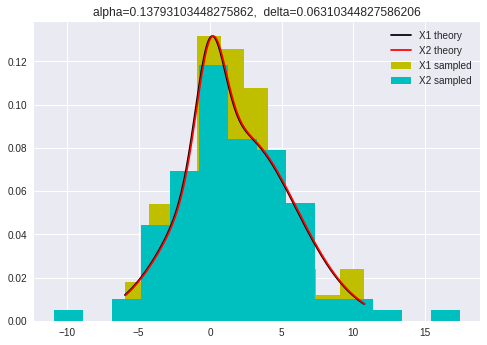


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2492.0, pvalue=0.9096621319022171)


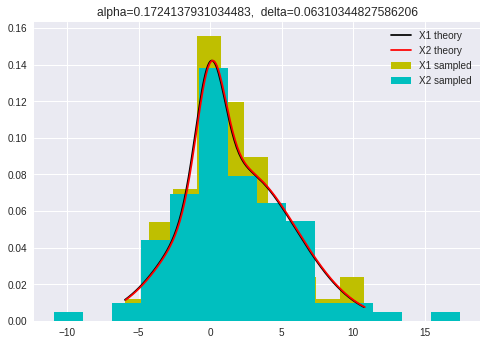


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2482.0, pvalue=0.8824627520873338)


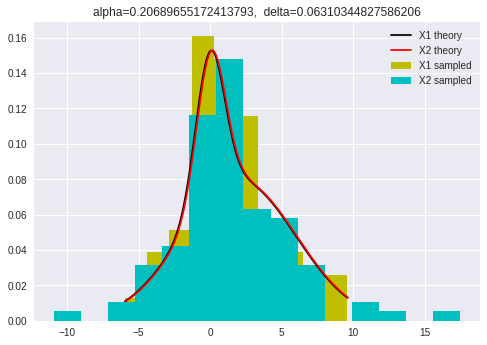


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2456.0, pvalue=0.8124671821144986)


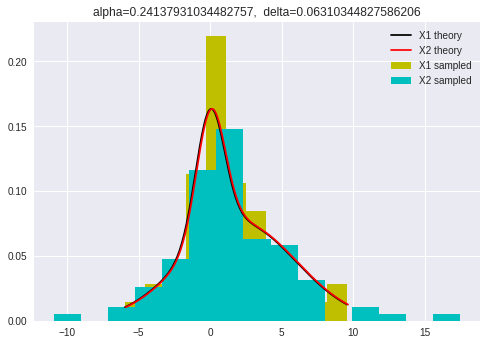


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2500.0, pvalue=0.9314997084840357)


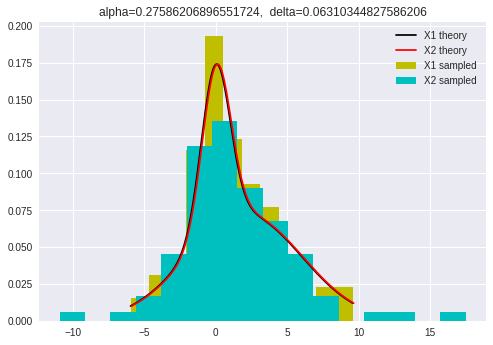


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2492.0, pvalue=0.9096621319022171)


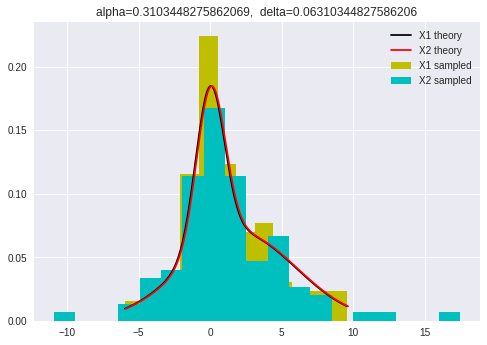


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2523.0, pvalue=0.9945132706275845)


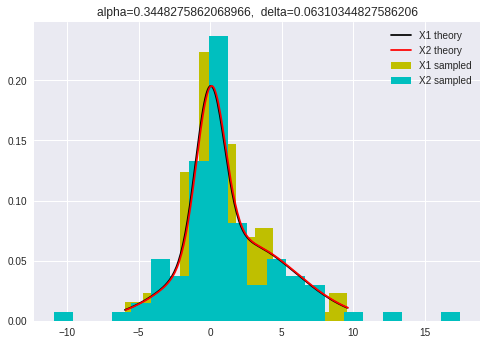


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2502.0, pvalue=0.9369678210300386)


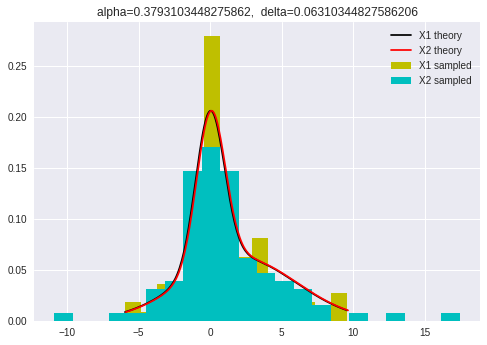


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2480.0, pvalue=0.8770384213786963)


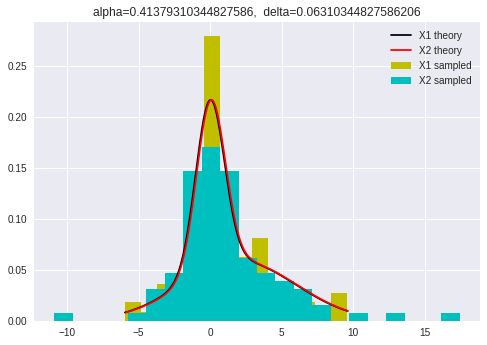


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2513.0, pvalue=0.9670887024899815)


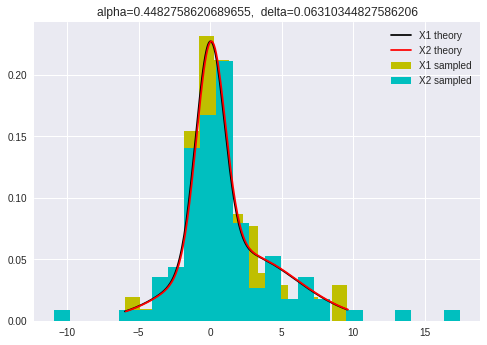


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2513.0, pvalue=0.9670887024899815)


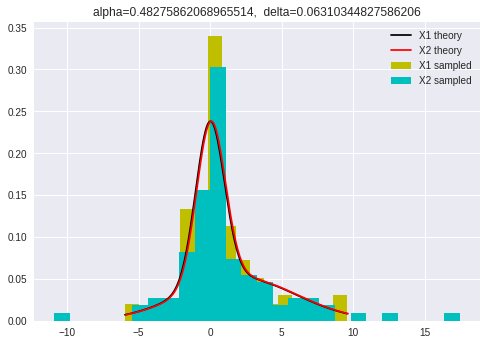


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2517.0, pvalue=0.9780556767995897)


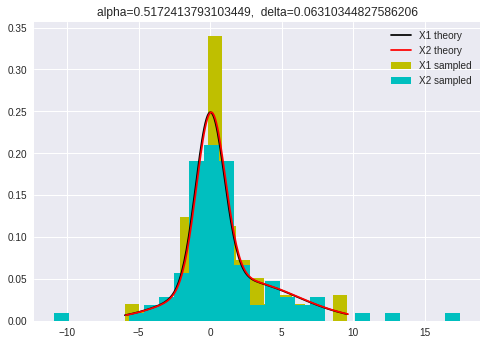


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2479.0, pvalue=0.8743284035131398)


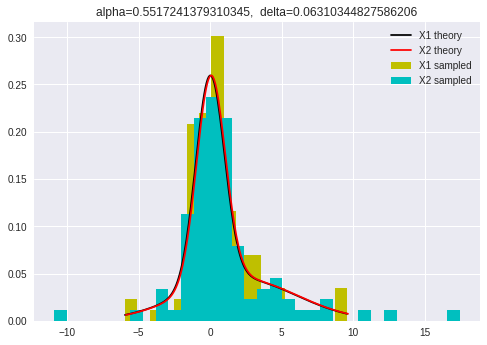


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2502.0, pvalue=0.9369678210300386)


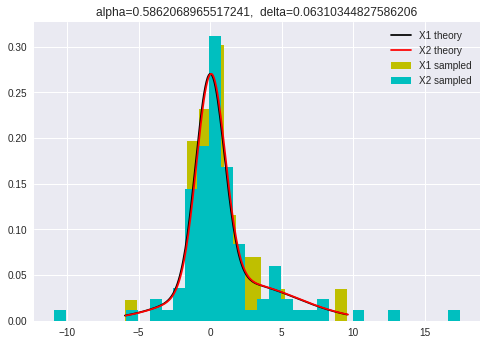


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2502.0, pvalue=0.9369678210300386)


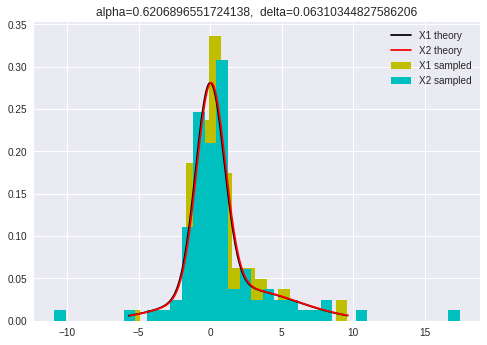


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


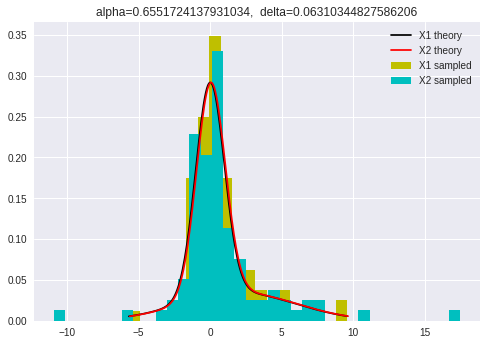


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2447.0, pvalue=0.7885535816793301)


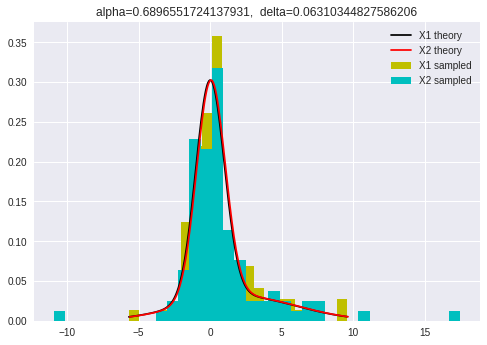


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2436.0, pvalue=0.7595963382015569)


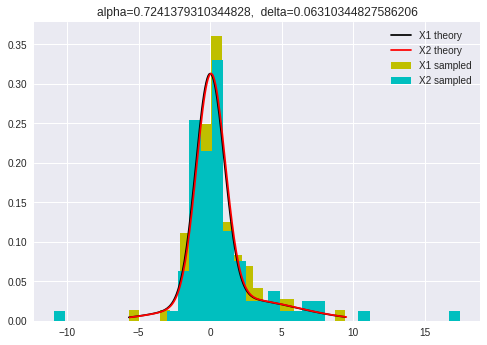


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


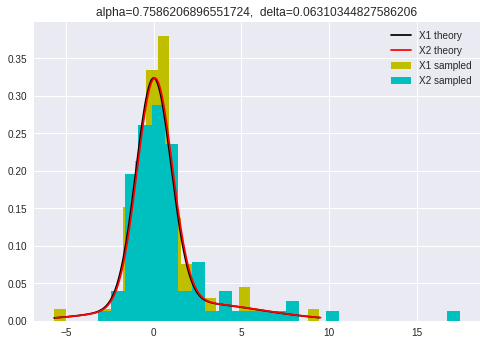


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2469.0, pvalue=0.8473143893644655)


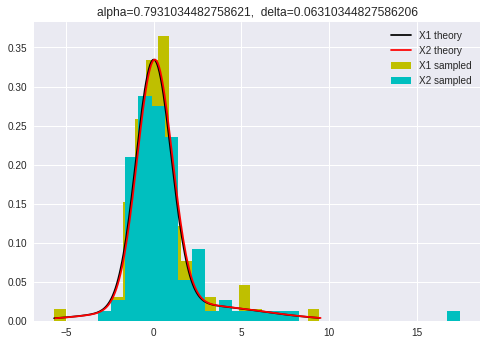


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2523.0, pvalue=0.9945132706275845)


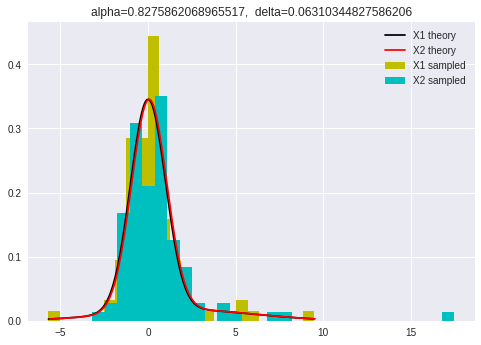


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2486.0, pvalue=0.8933277151725947)


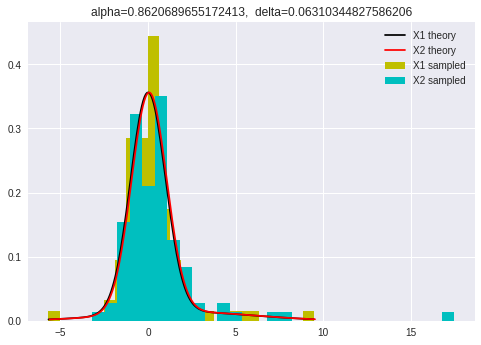


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2477.0, pvalue=0.8689128190274791)


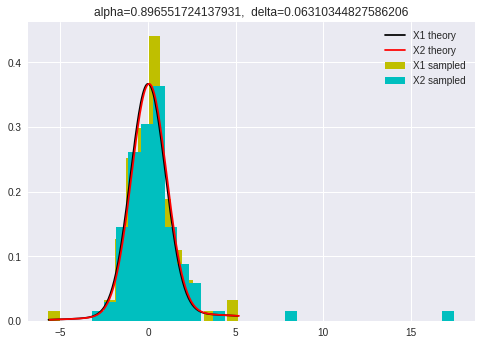


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2456.0, pvalue=0.8124671821144986)


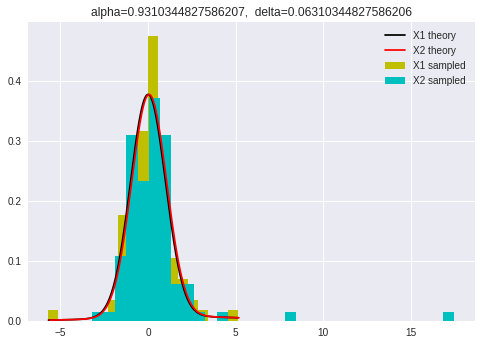


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


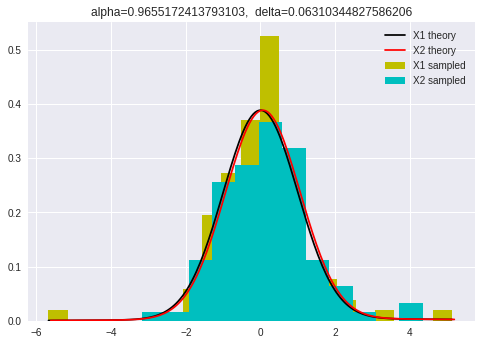


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2409.0, pvalue=0.6900069147093293)


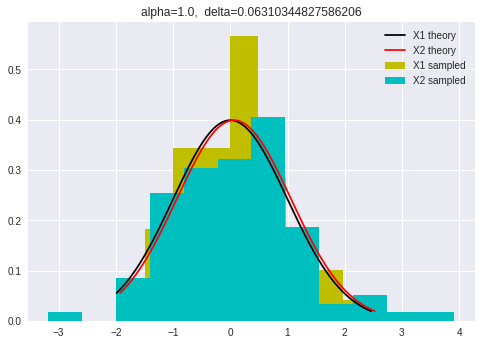

 40%|████      | 12/30 [01:39<02:29,  8.29s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2505.0, pvalue=0.9451754865571346)


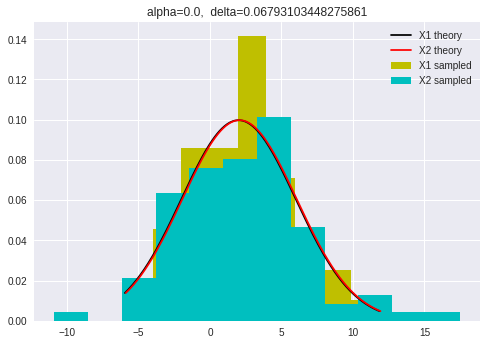


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2476.0, pvalue=0.8662073147584464)


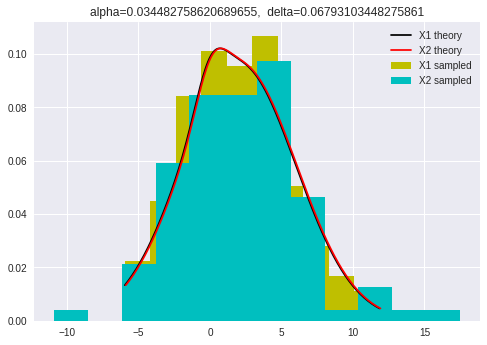


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2458.0, pvalue=0.817806007749672)


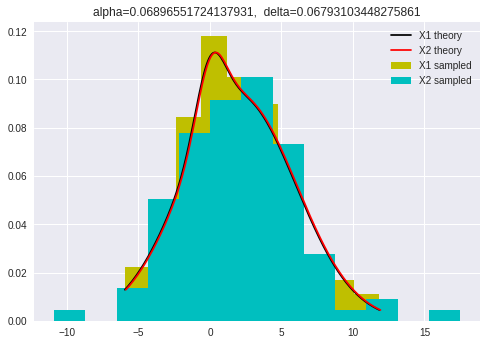


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


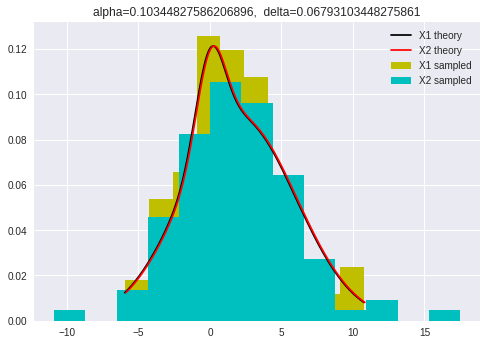


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


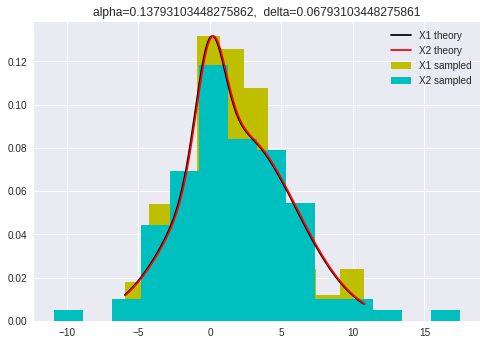


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2487.0, pvalue=0.8960471686012128)


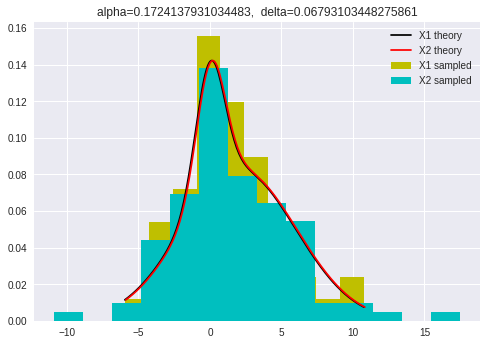


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2477.0, pvalue=0.8689128190274791)


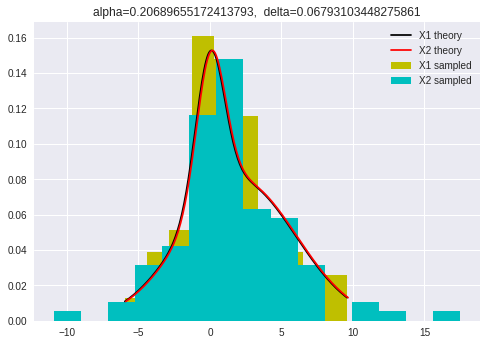


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2451.0, pvalue=0.7991587121799286)


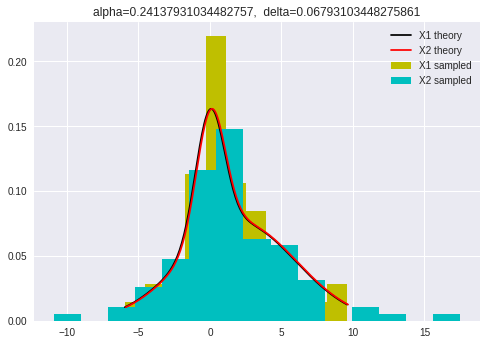


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2495.0, pvalue=0.9178441245028052)


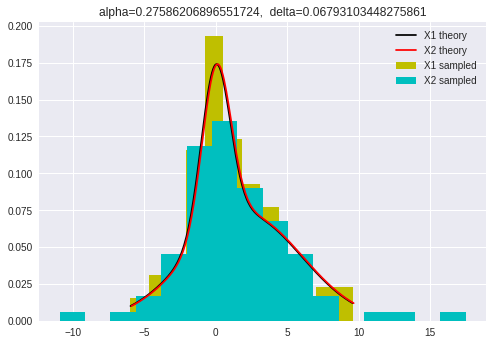


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2498.0, pvalue=0.9260348271927795)


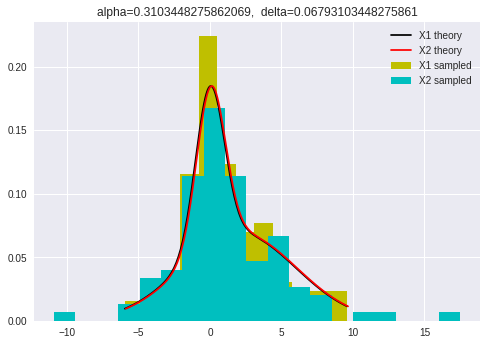


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2521.0, pvalue=0.9890268007061765)


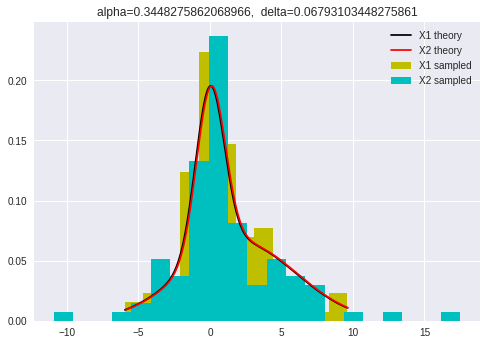


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2496.0, pvalue=0.9205734335120058)


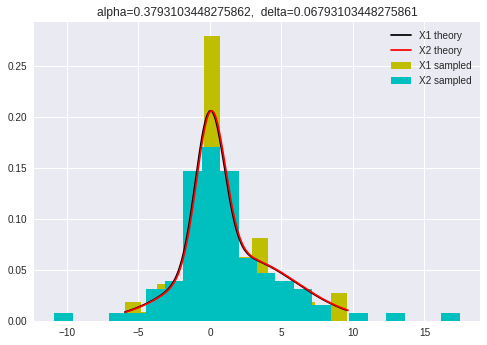


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


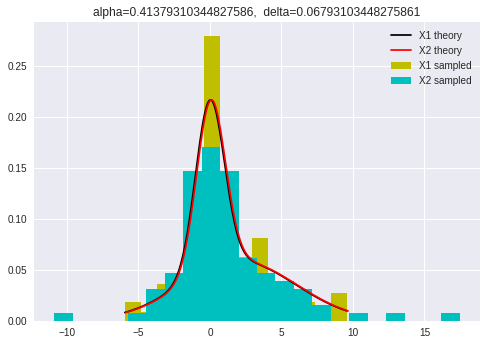


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2507.0, pvalue=0.9506505527719576)


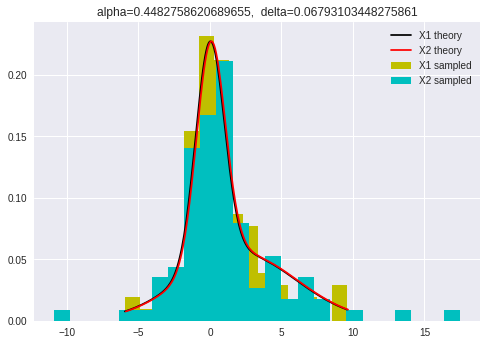


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2507.0, pvalue=0.9506505527719576)


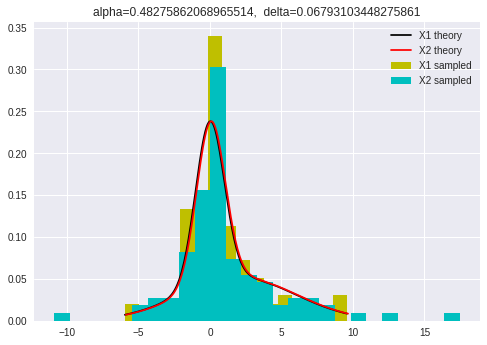


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2523.0, pvalue=0.9945132706275845)


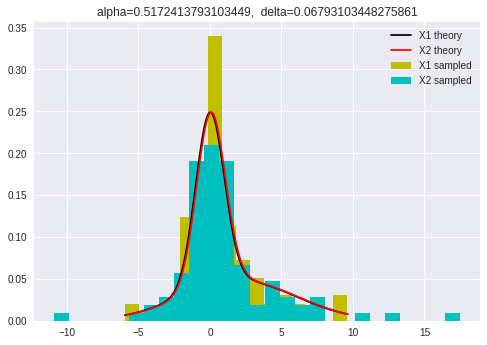


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


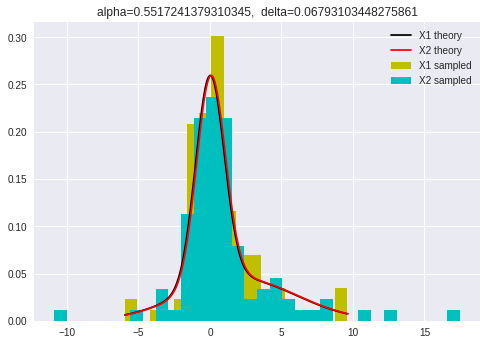


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2495.0, pvalue=0.9178441245028052)


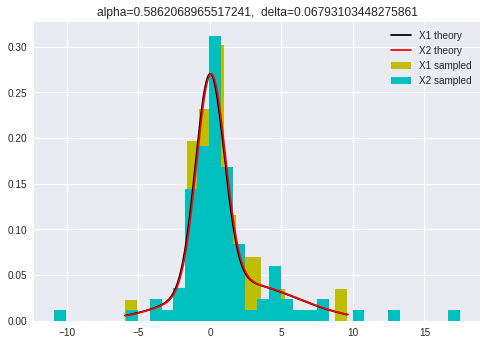


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2493.0, pvalue=0.9123884418157544)


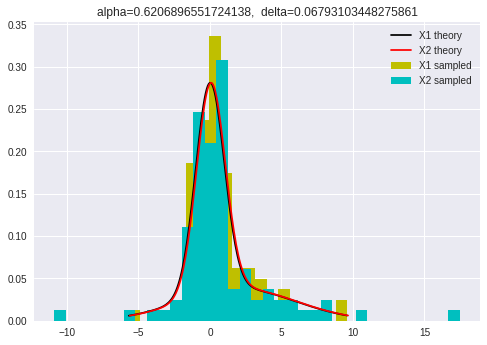


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2464.0, pvalue=0.8338723094405576)


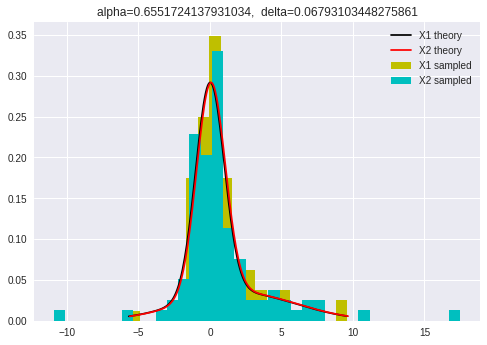


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2438.0, pvalue=0.7648376056140332)


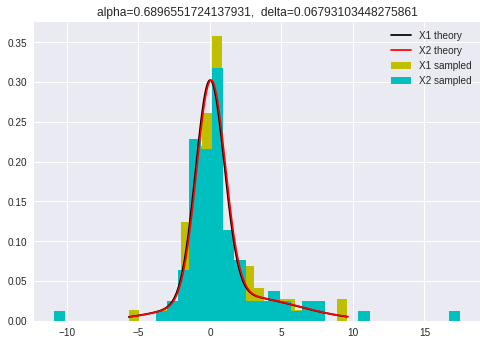


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2427.0, pvalue=0.7361501939167332)


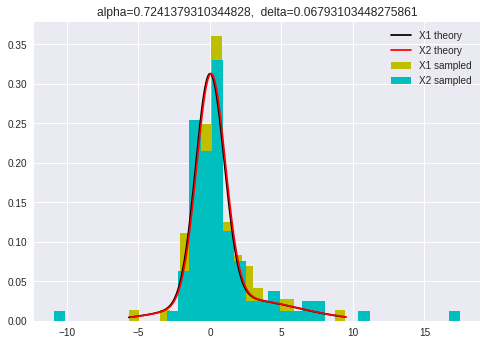


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


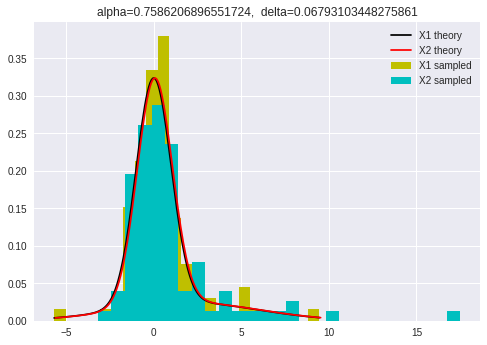


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2459.0, pvalue=0.8204786096104631)


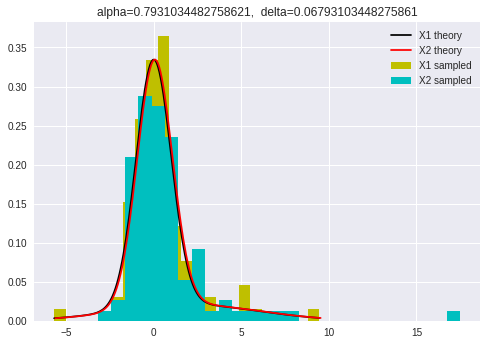


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2513.0, pvalue=0.9670887024899815)


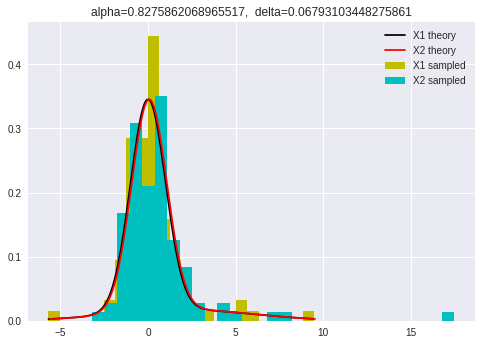


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2476.0, pvalue=0.8662073147584464)


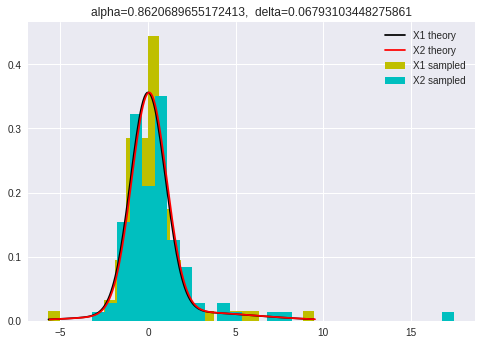


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2468.0, pvalue=0.8446222853530765)


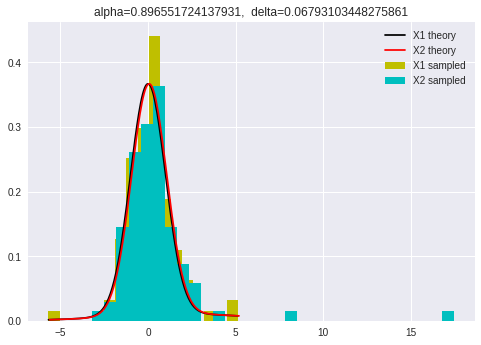


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2447.0, pvalue=0.7885535816793301)


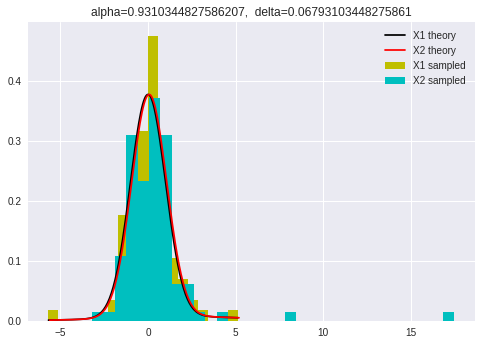


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2425.0, pvalue=0.7309722689902687)


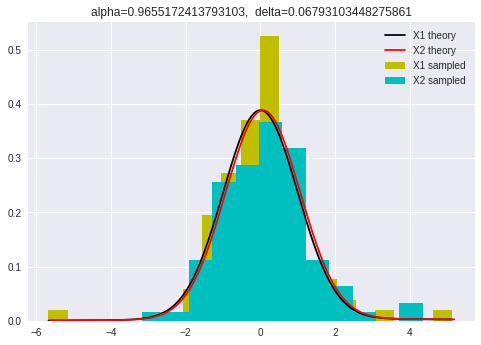


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2397.0, pvalue=0.6598606407090197)


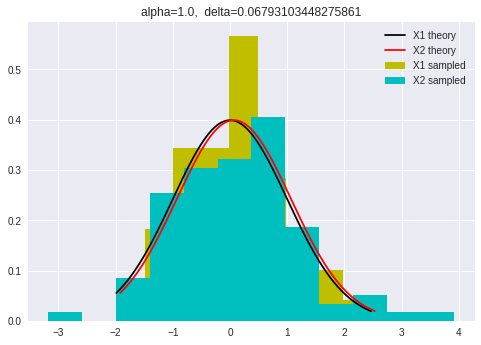

 43%|████▎     | 13/30 [01:47<02:20,  8.28s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2500.0, pvalue=0.9314997084840357)


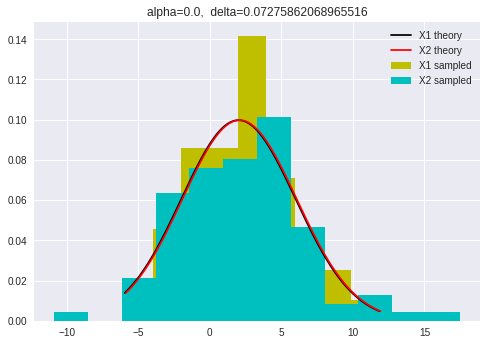


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2471.0, pvalue=0.8527039152769147)


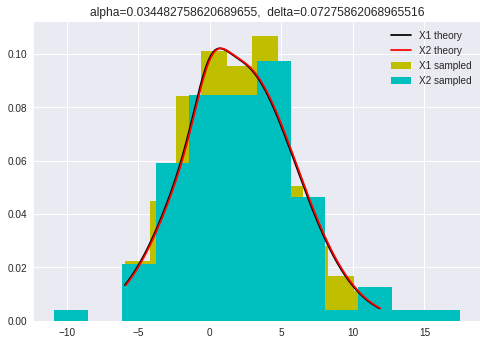


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2453.0, pvalue=0.8044753358016482)


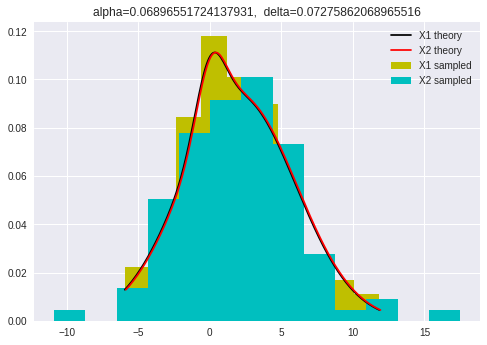


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2445.0, pvalue=0.7832655420427076)


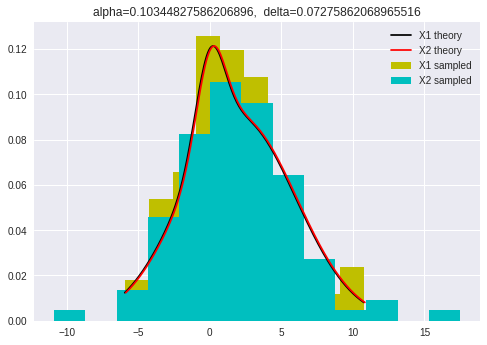


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2452.0, pvalue=0.8018158769149264)


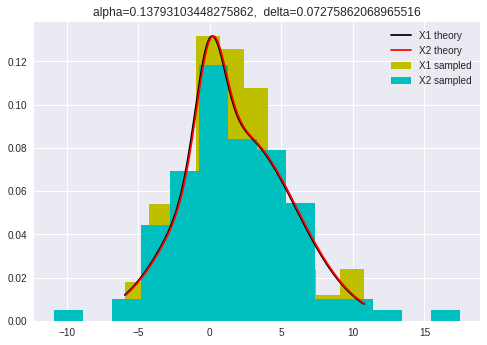


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2484.0, pvalue=0.8878926004885652)


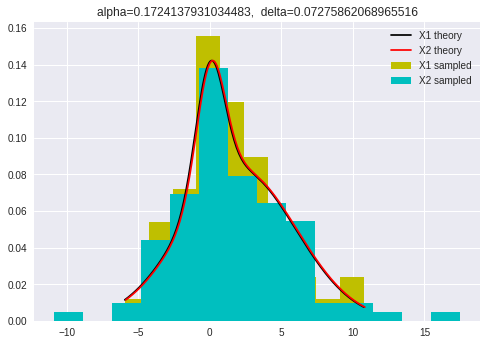


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2475.0, pvalue=0.8635033772834252)


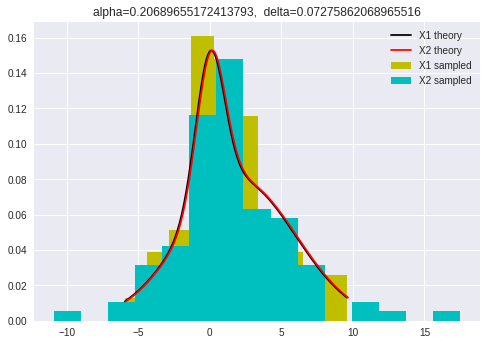


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


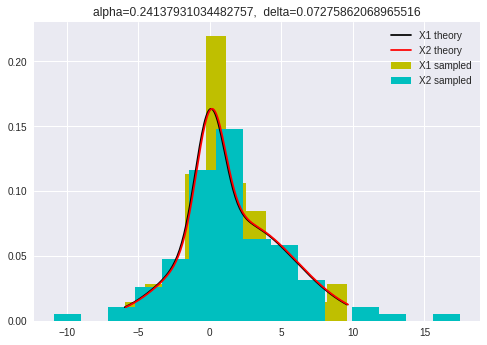


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2493.0, pvalue=0.9123884418157544)


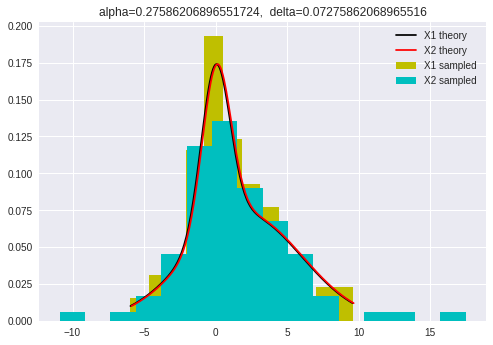


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2500.0, pvalue=0.9314997084840357)


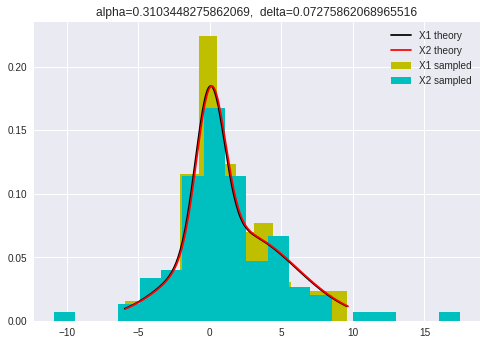


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2520.0, pvalue=0.9862837441089826)


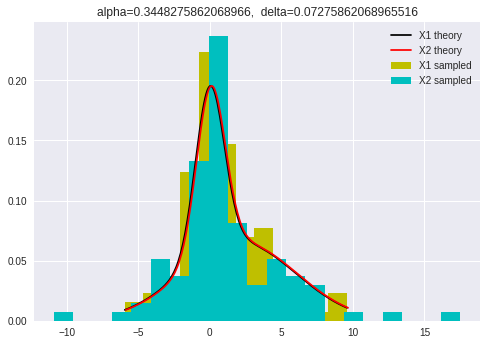


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2495.0, pvalue=0.9178441245028052)


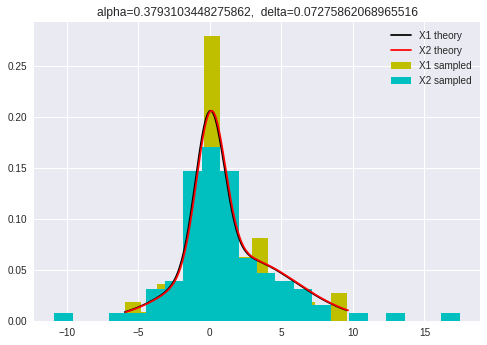


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2472.0, pvalue=0.8554012757415651)


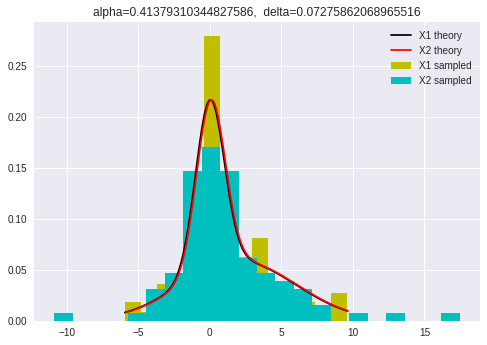


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2506.0, pvalue=0.947912712213223)


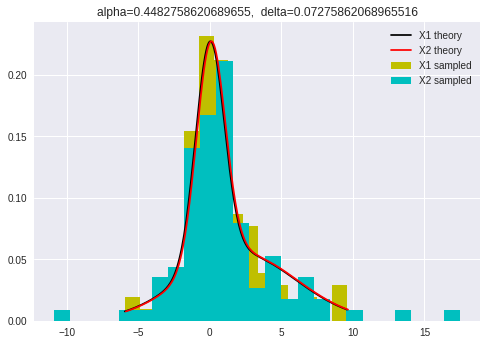


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2505.0, pvalue=0.9451754865571346)


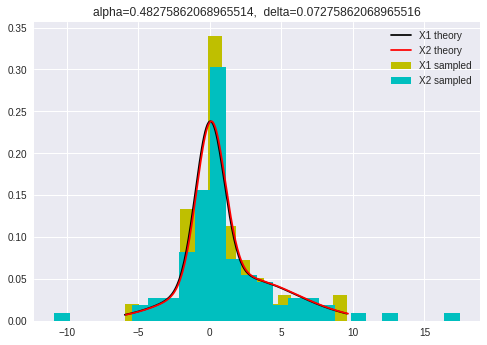


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2524.0, pvalue=0.9972566190976729)


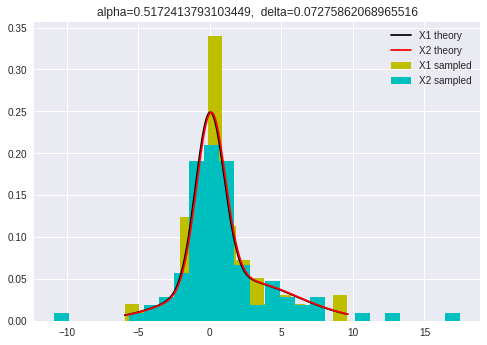


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2471.0, pvalue=0.8527039152769147)


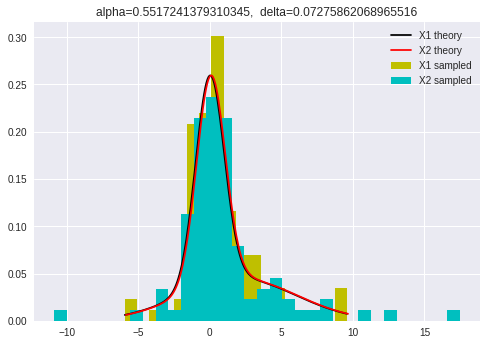


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2493.0, pvalue=0.9123884418157544)


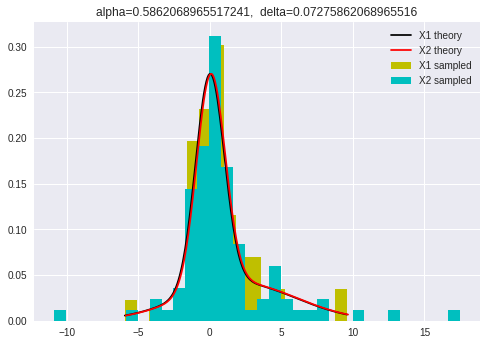


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2491.0, pvalue=0.9069368853915614)


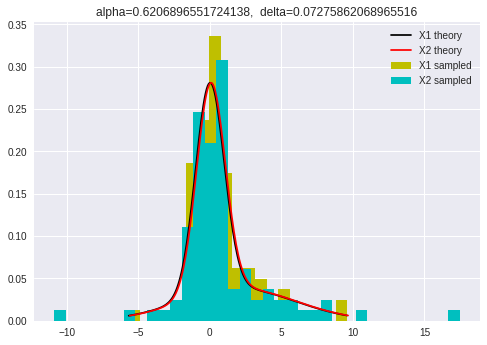


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2462.0, pvalue=0.8285088118253296)


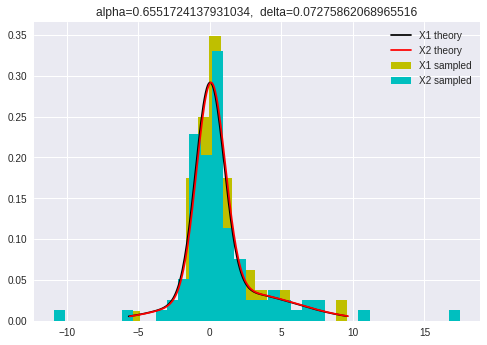


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


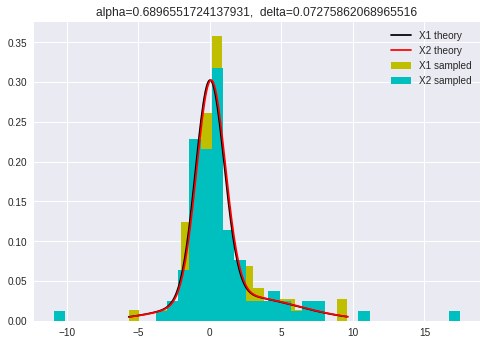


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2424.0, pvalue=0.7283878786577169)


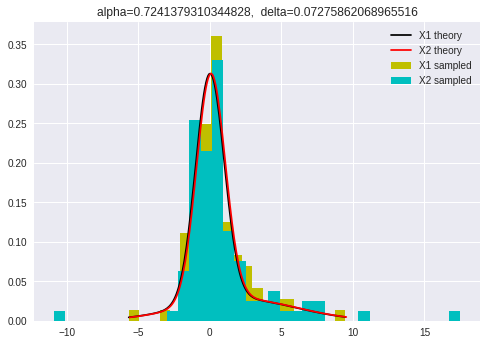


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2425.0, pvalue=0.7309722689902687)


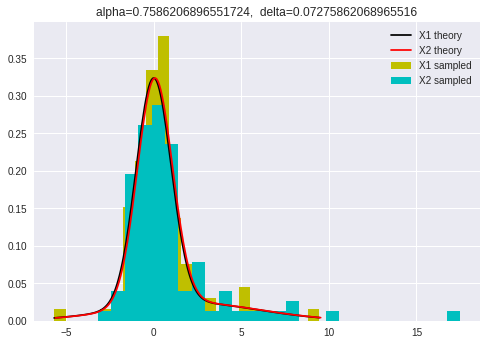


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2453.0, pvalue=0.8044753358016482)


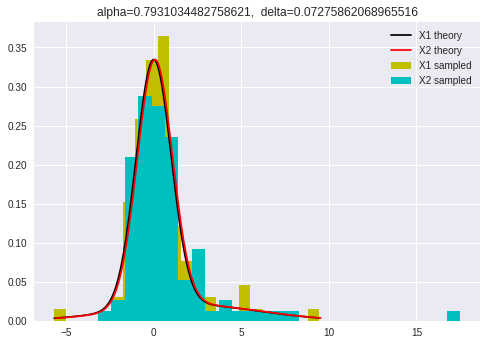


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2507.0, pvalue=0.9506505527719576)


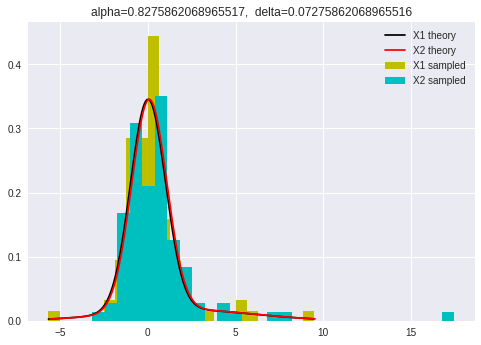


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2470.0, pvalue=0.8500082762349129)


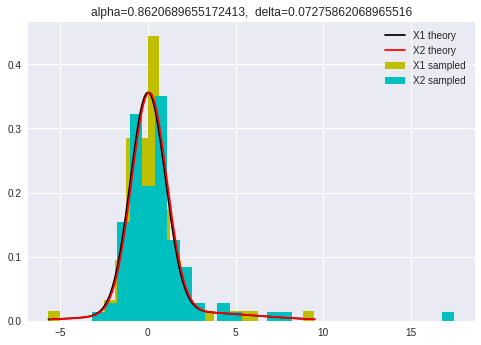


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2461.0, pvalue=0.8258300417006286)


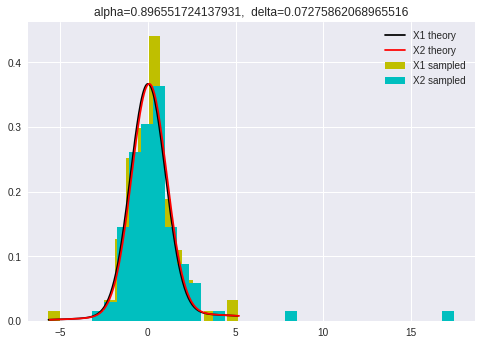


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2440.0, pvalue=0.7700896655852555)


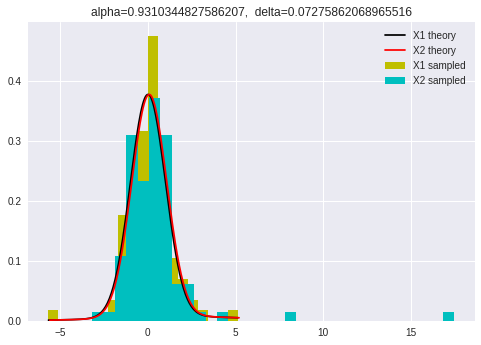


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2418.0, pvalue=0.7129472348148089)


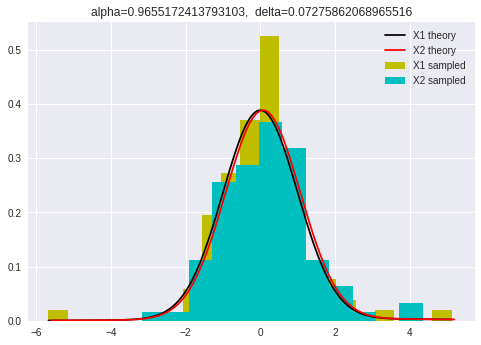


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2389.0, pvalue=0.6400619540504373)


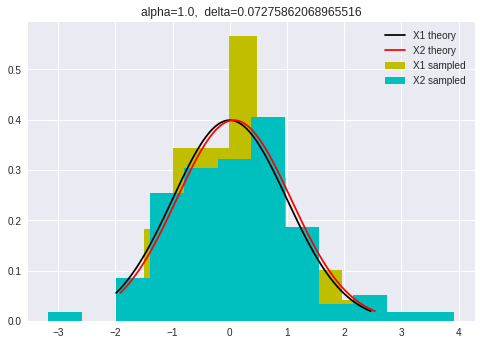

 47%|████▋     | 14/30 [01:56<02:12,  8.29s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2498.0, pvalue=0.9260348271927795)


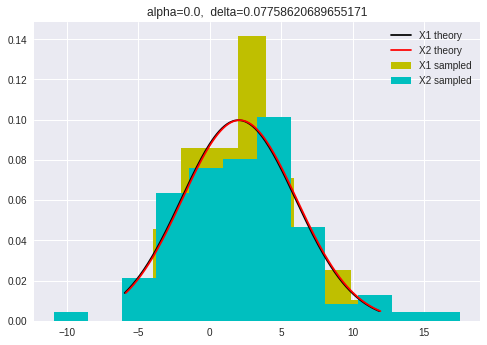


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2469.0, pvalue=0.8473143893644655)


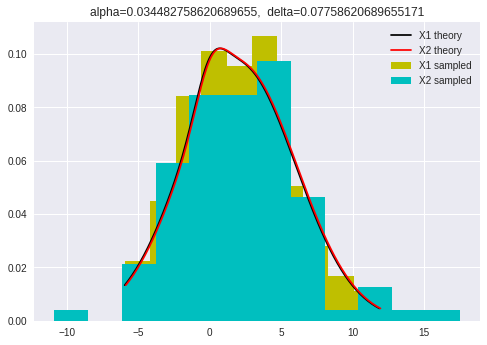


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2451.0, pvalue=0.7991587121799286)


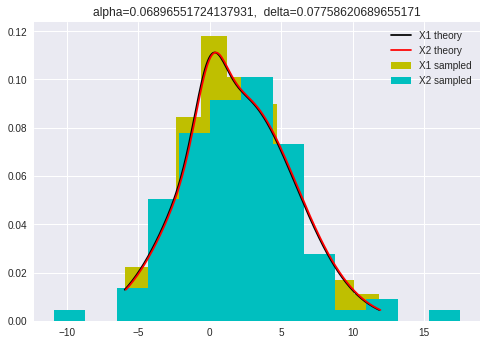


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


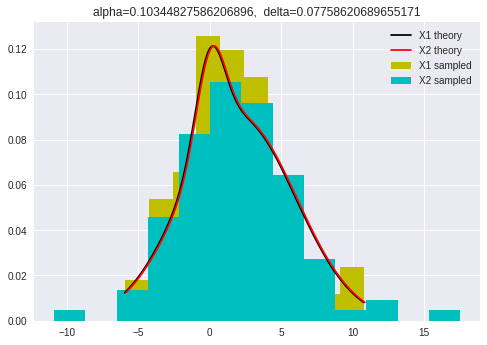


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2448.0, pvalue=0.7912012765498633)


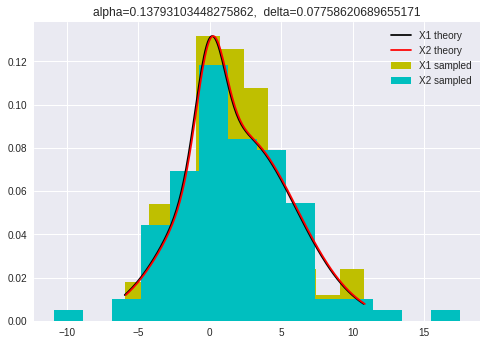


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2479.0, pvalue=0.8743284035131398)


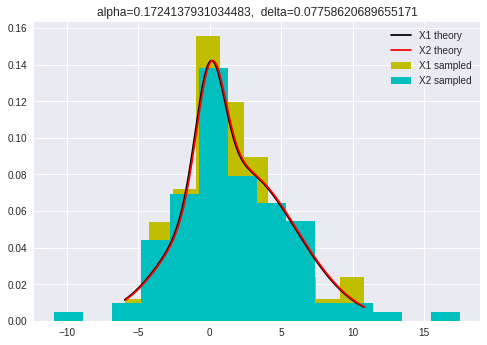


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2469.0, pvalue=0.8473143893644655)


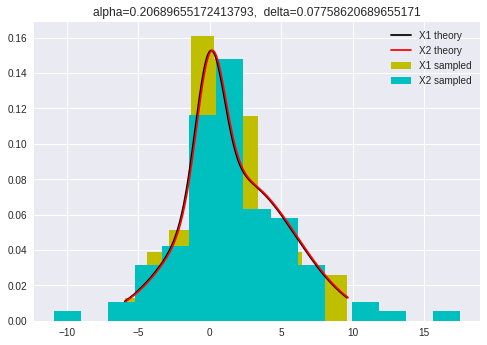


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


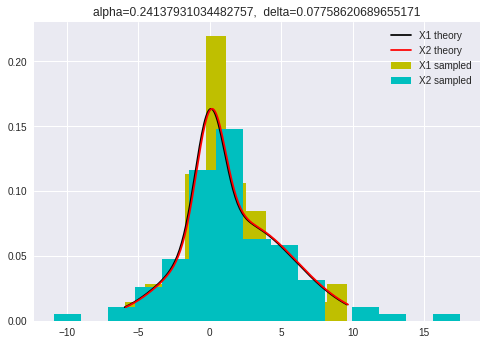


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2487.0, pvalue=0.8960471686012128)


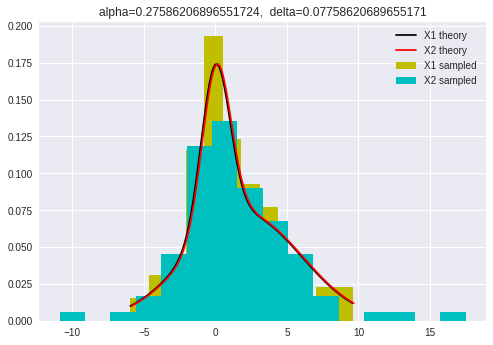


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2504.0, pvalue=0.9424389080177923)


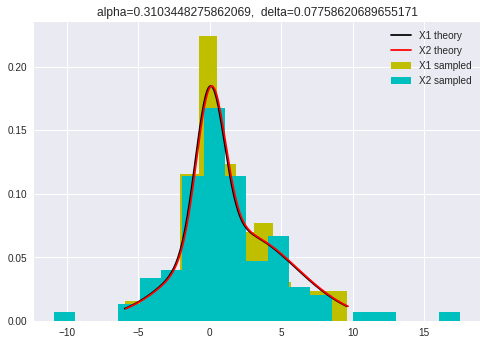


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2516.0, pvalue=0.9753134632163343)


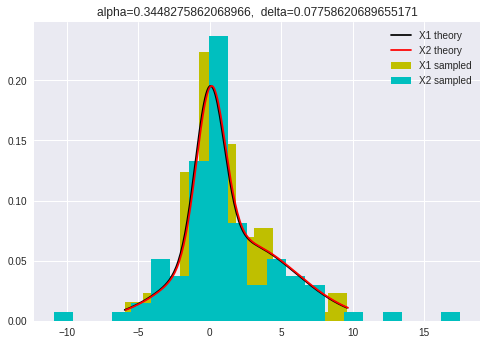


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2490.0, pvalue=0.9042127340742919)


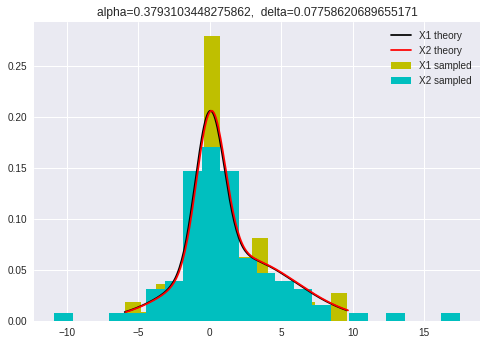


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2467.0, pvalue=0.8419319948258008)


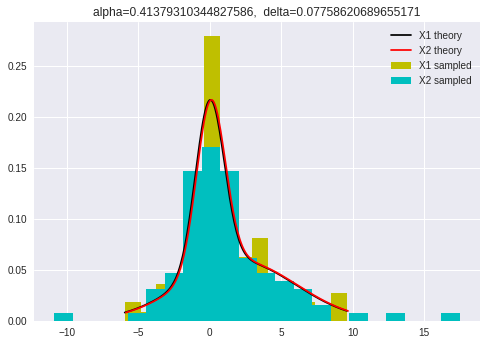


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2500.0, pvalue=0.9314997084840357)


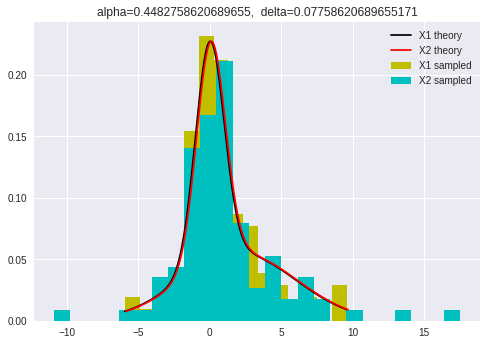


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2499.0, pvalue=0.9287668478981905)


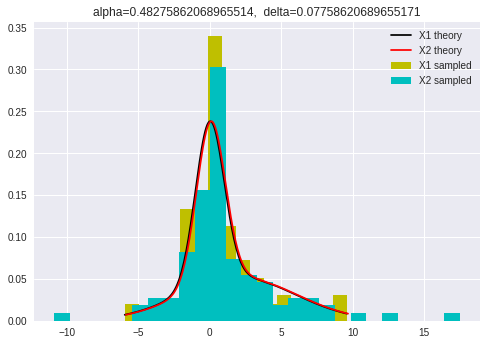


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2520.0, pvalue=0.9862837441089826)


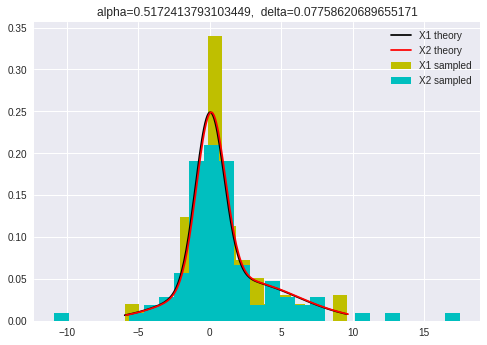


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2465.0, pvalue=0.8365569764052994)


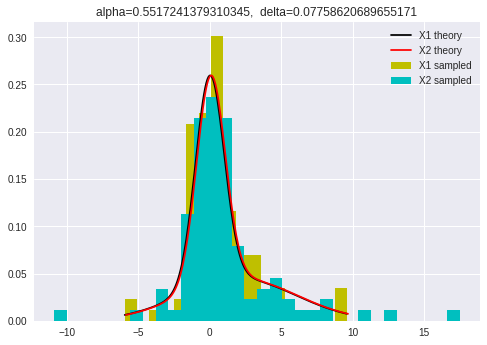


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2487.0, pvalue=0.8960471686012128)


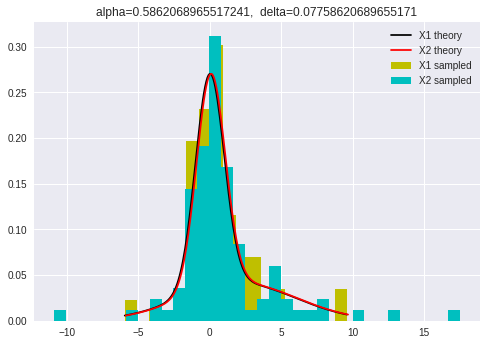


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2484.0, pvalue=0.8878926004885652)


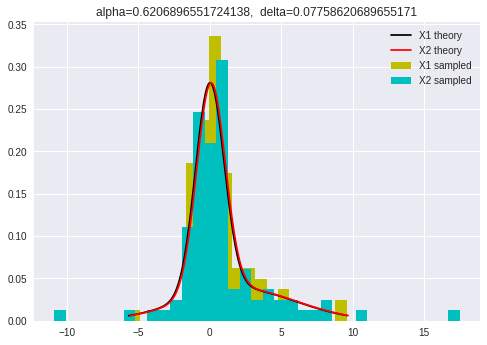


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


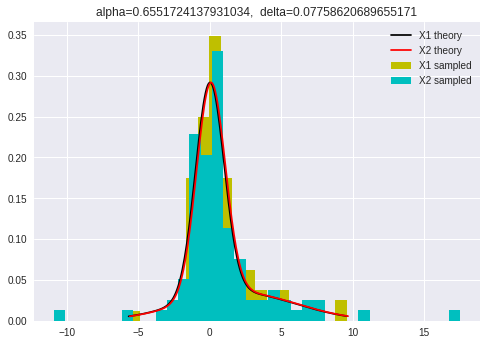


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2428.0, pvalue=0.7387436743898753)


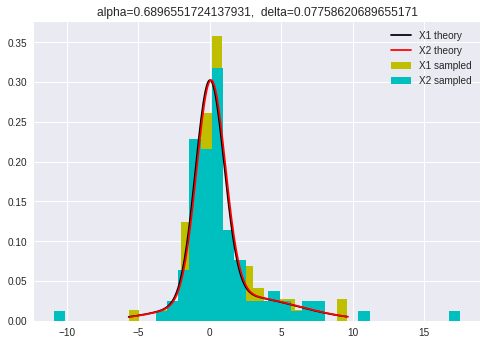


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2417.0, pvalue=0.7103849915044168)


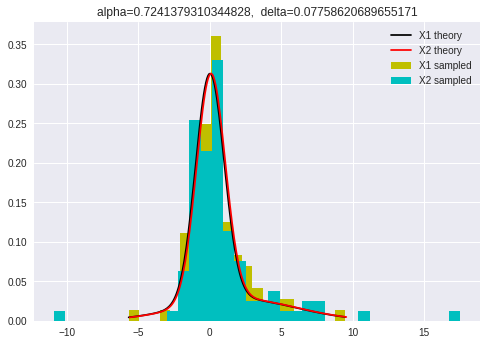


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2418.0, pvalue=0.7129472348148089)


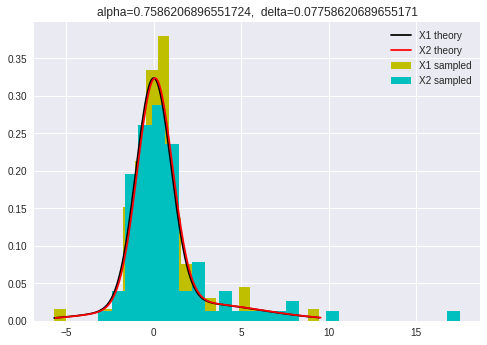


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


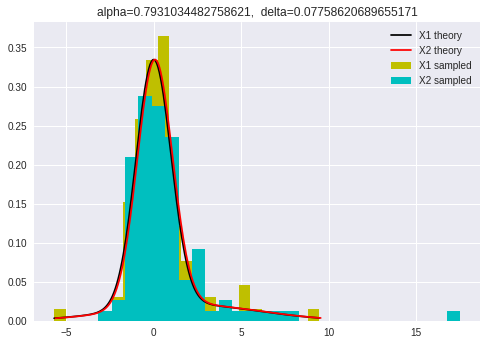


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2497.0, pvalue=0.9233036783976978)


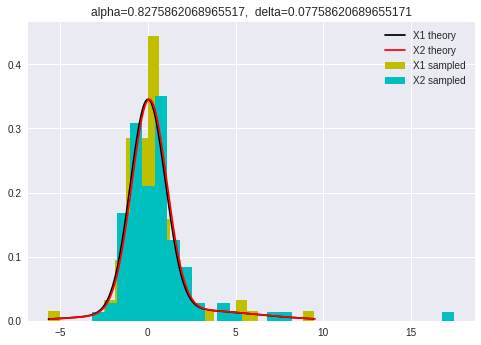


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


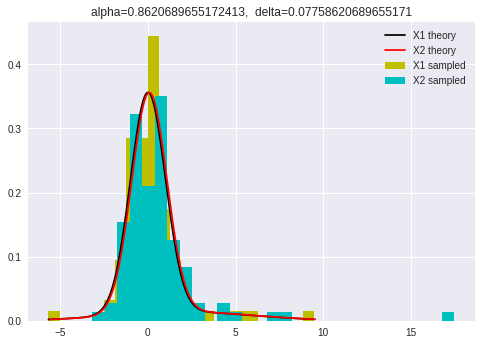


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2451.0, pvalue=0.7991587121799286)


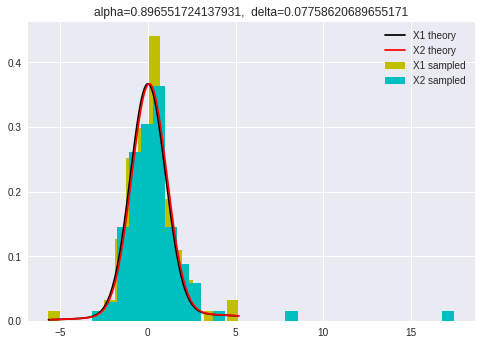


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2431.0, pvalue=0.7465418609724369)


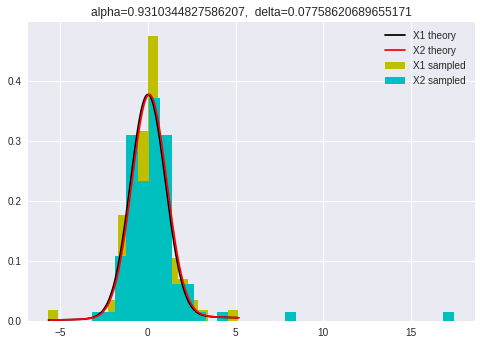


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2408.0, pvalue=0.687475023529822)


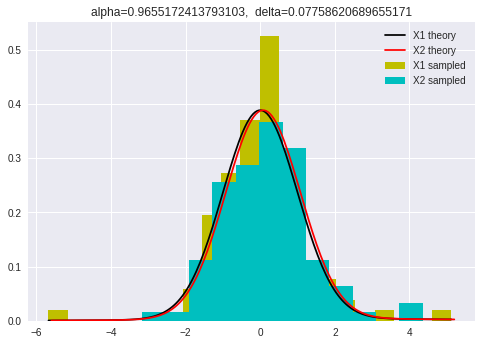


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2379.0, pvalue=0.615670737630266)


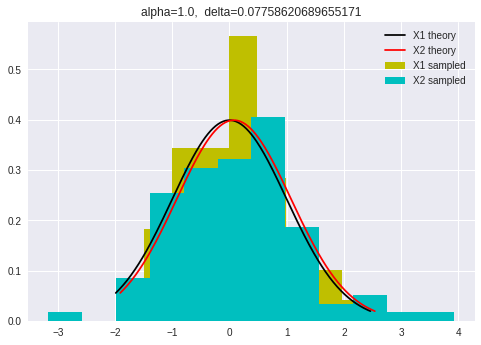

 50%|█████     | 15/30 [02:04<02:04,  8.31s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2497.0, pvalue=0.9233036783976978)


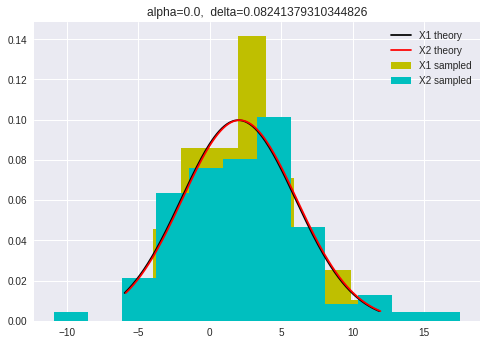


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2468.0, pvalue=0.8446222853530765)


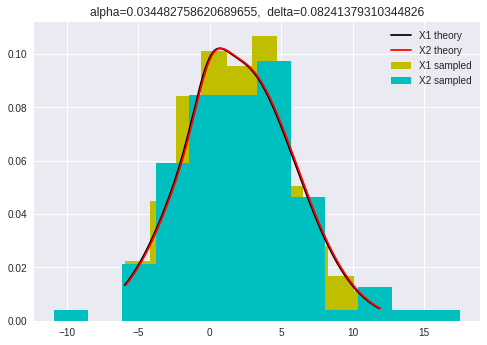


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2450.0, pvalue=0.7965038710035247)


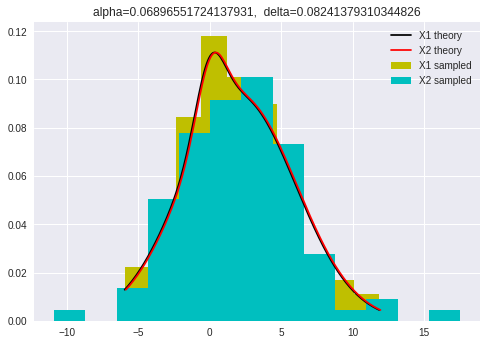


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2441.0, pvalue=0.7727196720119712)


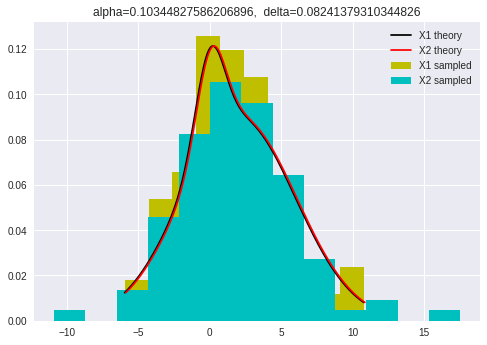


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2446.0, pvalue=0.7859083271789165)


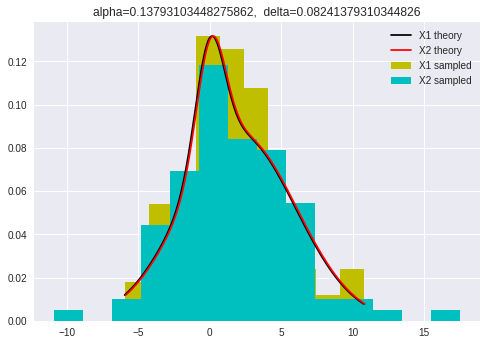


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2477.0, pvalue=0.8689128190274791)


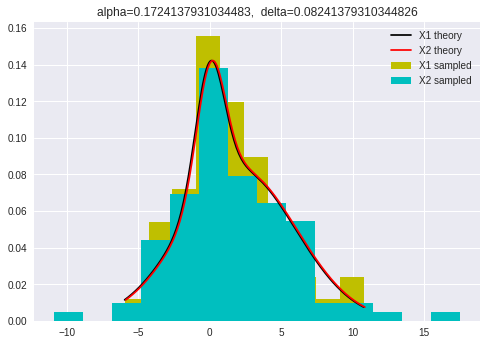


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2467.0, pvalue=0.8419319948258008)


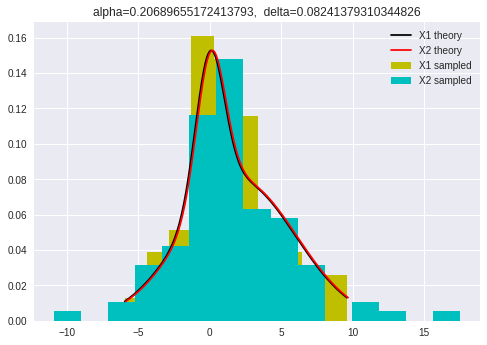


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2441.0, pvalue=0.7727196720119712)


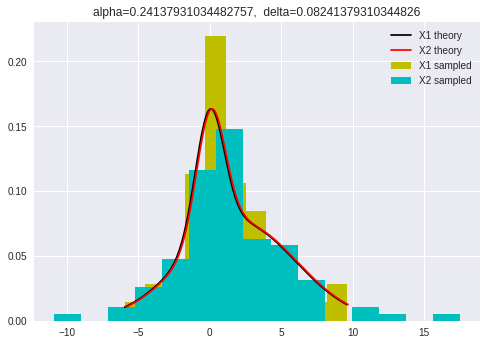


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2485.0, pvalue=0.8906095152877423)


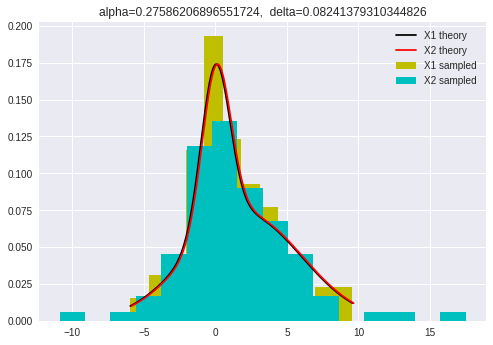


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2506.0, pvalue=0.947912712213223)


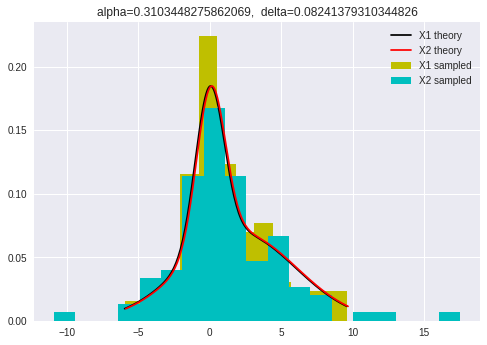


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2514.0, pvalue=0.9698299436867753)


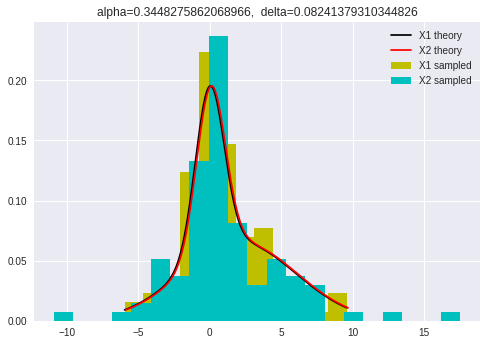


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2489.0, pvalue=0.9014897097022484)


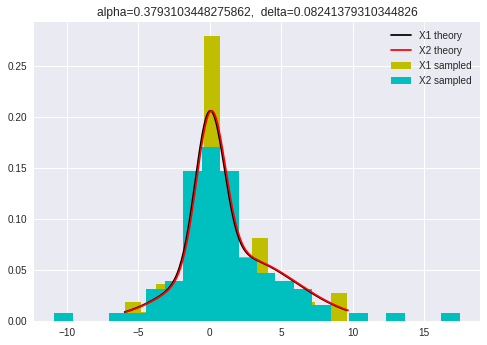


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2466.0, pvalue=0.8392435483441993)


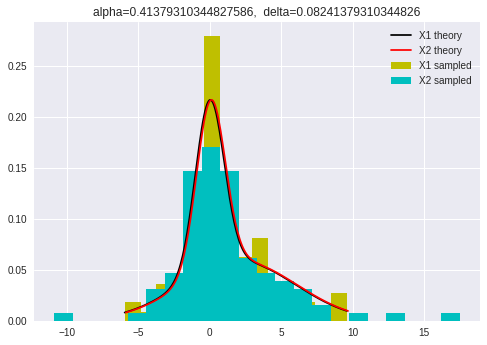


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2499.0, pvalue=0.9287668478981905)


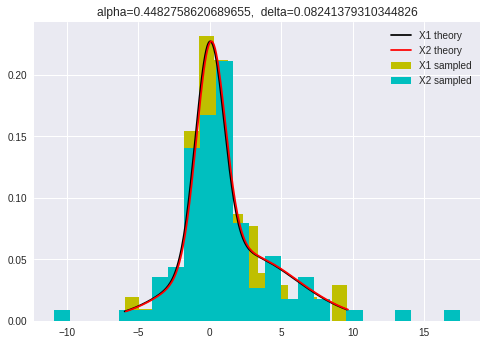


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2498.0, pvalue=0.9260348271927795)


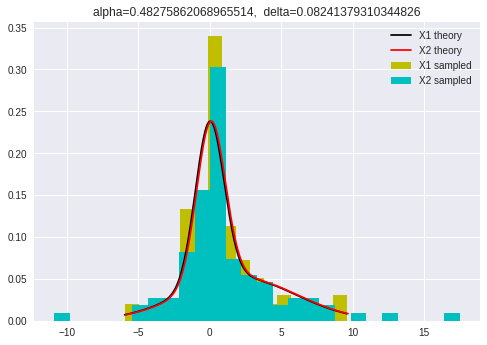


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2518.0, pvalue=0.9807981497441512)


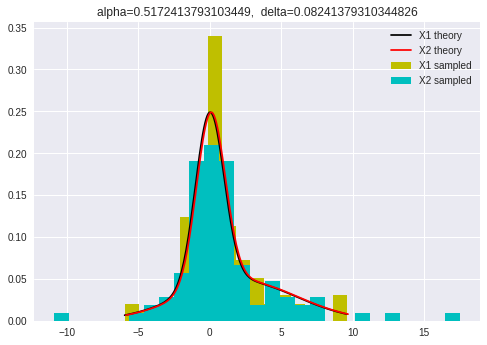


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2461.0, pvalue=0.8258300417006286)


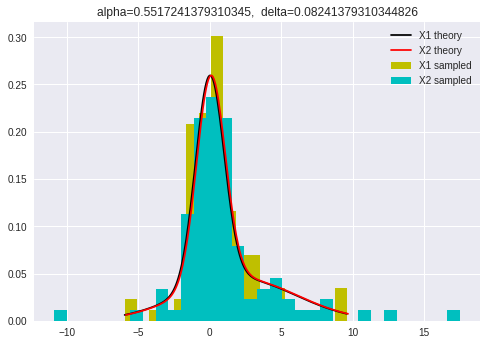


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2483.0, pvalue=0.8851770022716838)


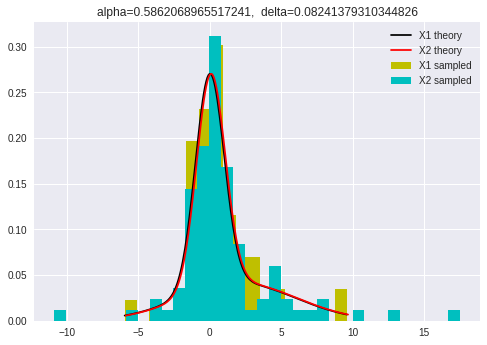


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2479.0, pvalue=0.8743284035131398)


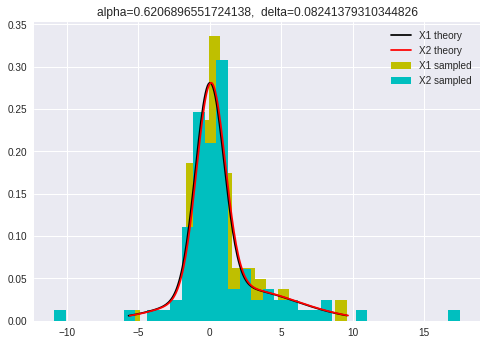


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


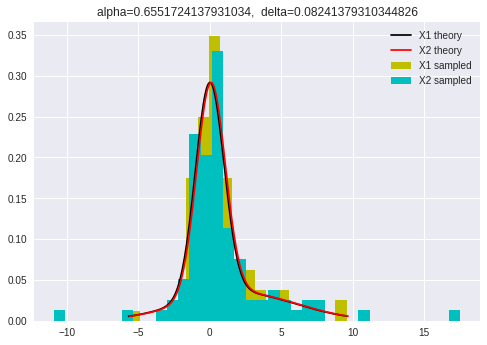


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2421.0, pvalue=0.7206533187202941)


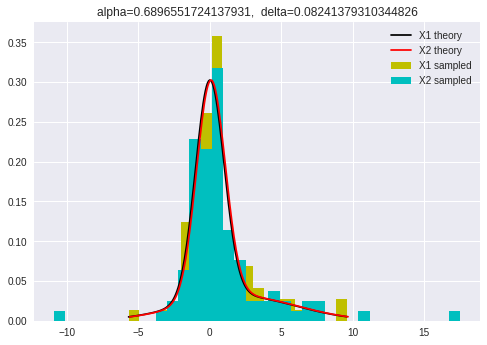


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2409.0, pvalue=0.6900069147093293)


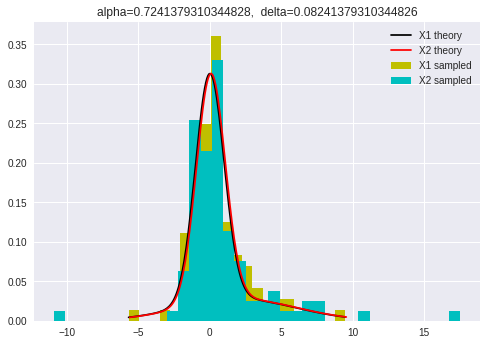


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2410.0, pvalue=0.6925422804041386)


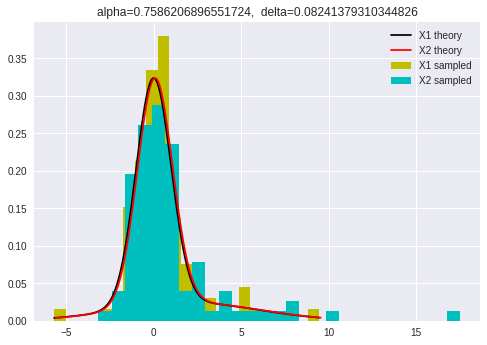


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2434.0, pvalue=0.7543660885045383)


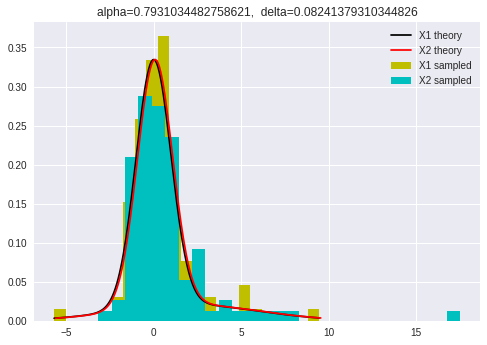


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2488.0, pvalue=0.8987678439874949)


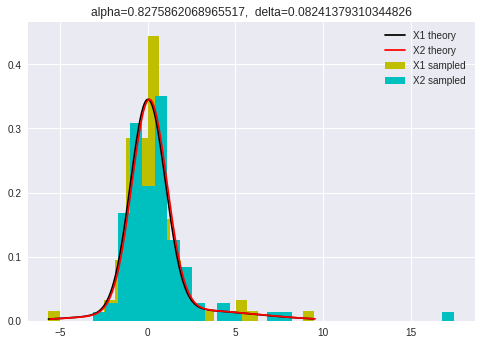


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2452.0, pvalue=0.8018158769149264)


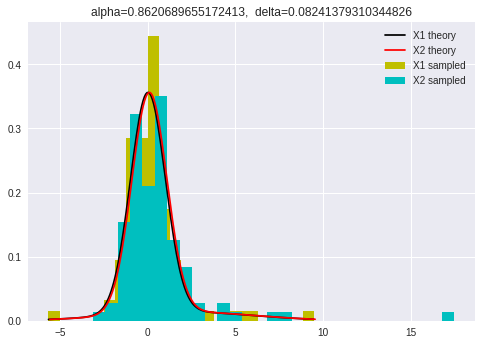


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


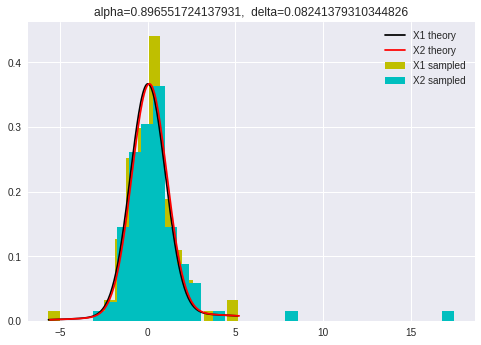


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2422.0, pvalue=0.7232283767760339)


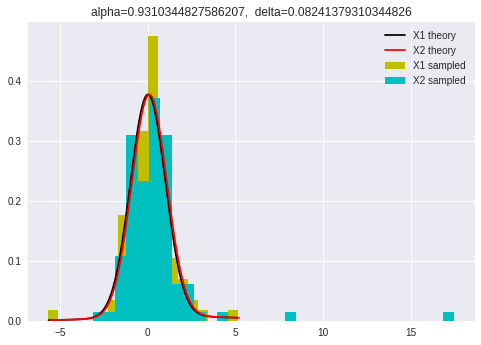


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


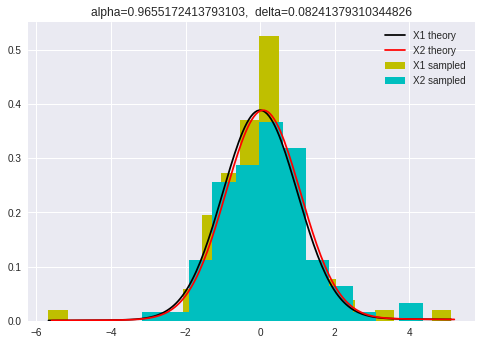


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2367.0, pvalue=0.5869540189208129)


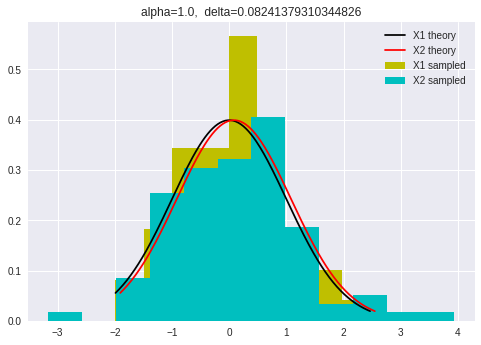

 53%|█████▎    | 16/30 [02:12<01:56,  8.36s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2495.0, pvalue=0.9178441245028052)


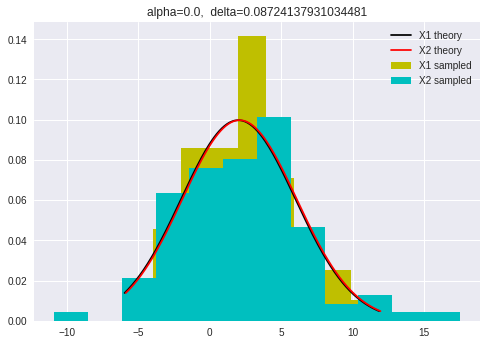


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2467.0, pvalue=0.8419319948258008)


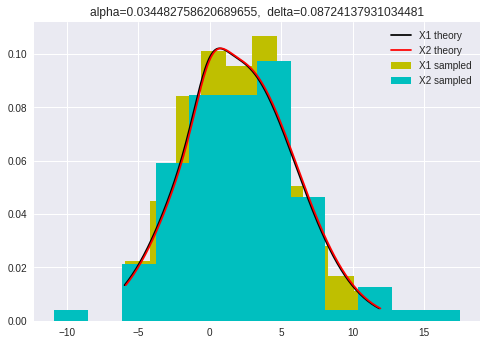


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2448.0, pvalue=0.7912012765498633)


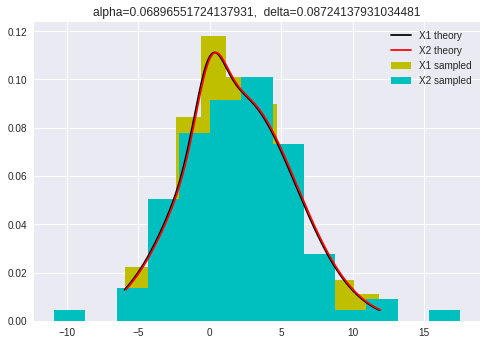


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


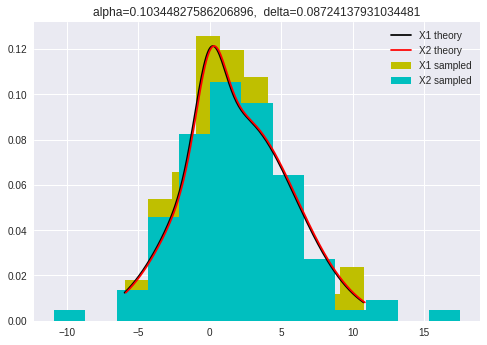


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


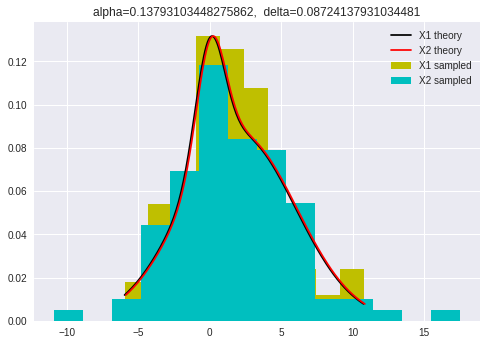


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2475.0, pvalue=0.8635033772834252)


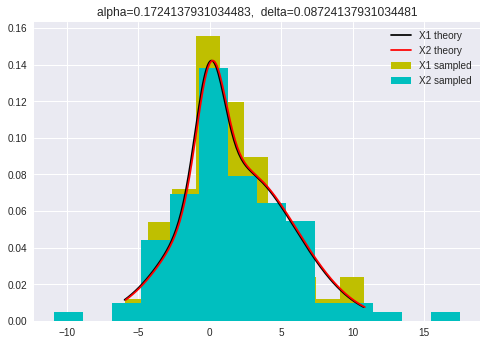


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2465.0, pvalue=0.8365569764052994)


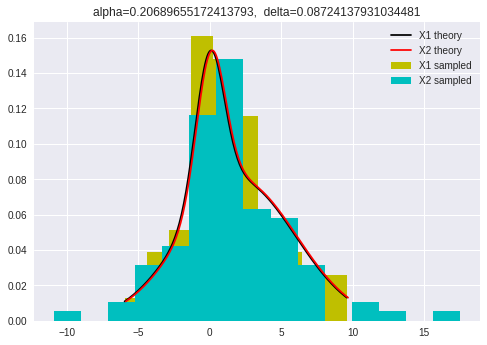


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


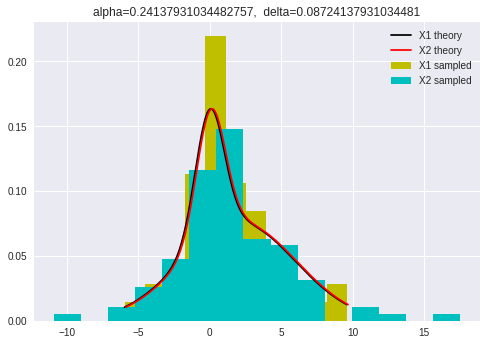


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2483.0, pvalue=0.8851770022716838)


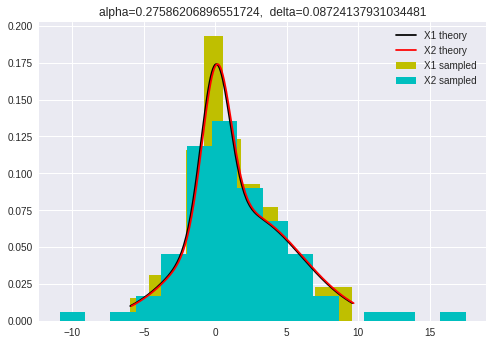


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2507.0, pvalue=0.9506505527719576)


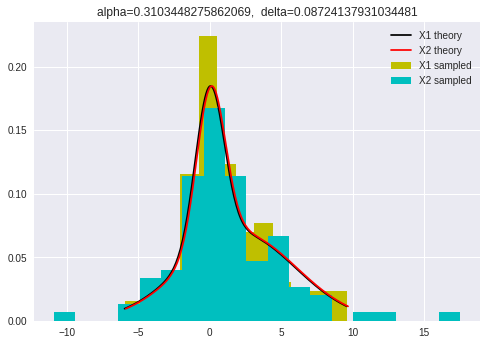


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2514.0, pvalue=0.9698299436867753)


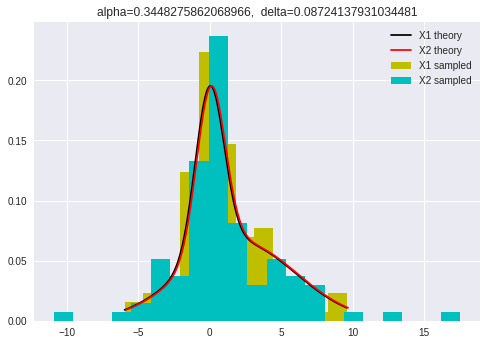


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2489.0, pvalue=0.9014897097022484)


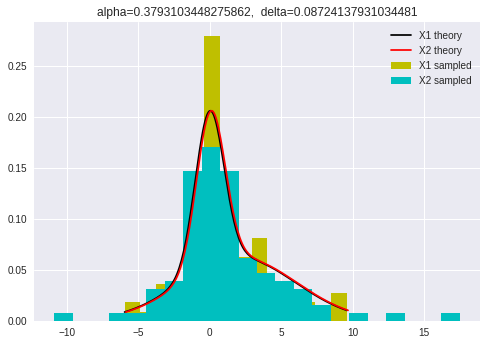


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2466.0, pvalue=0.8392435483441993)


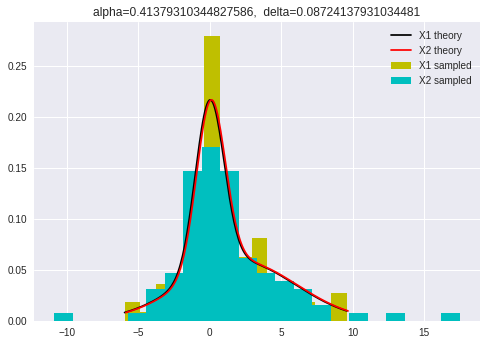


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2498.0, pvalue=0.9260348271927795)


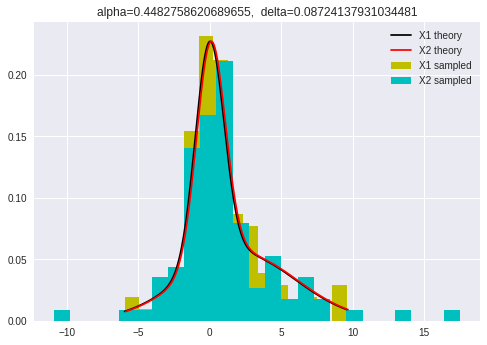


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2497.0, pvalue=0.9233036783976978)


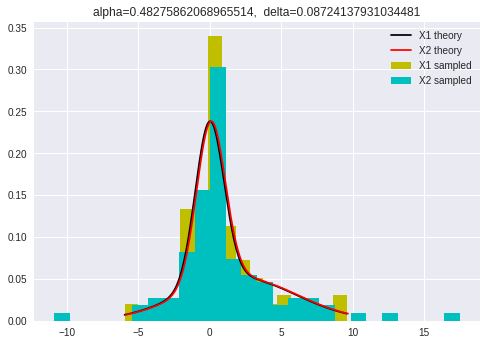


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2515.0, pvalue=0.9725715413852294)


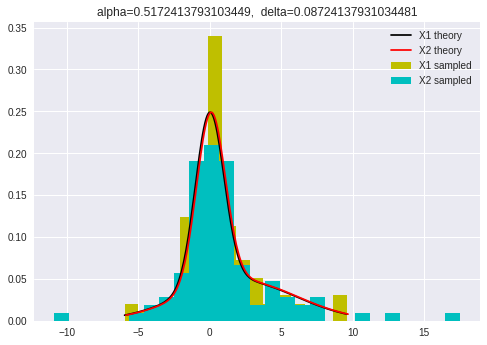


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2457.0, pvalue=0.8151355219610021)


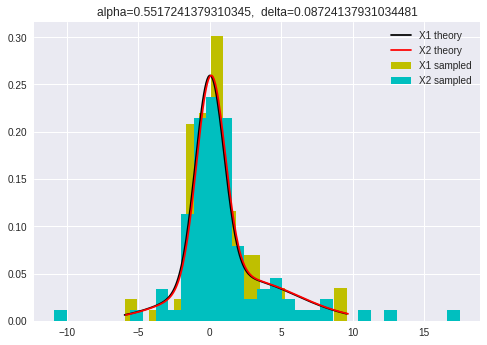


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2478.0, pvalue=0.8716198589954062)


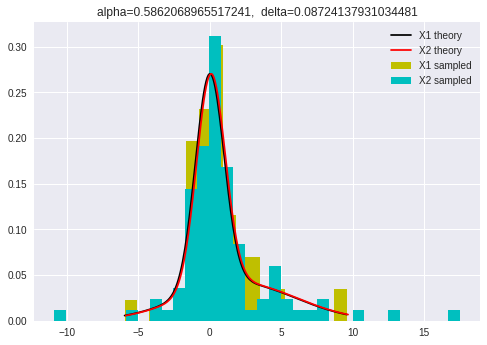


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2474.0, pvalue=0.8608010376424908)


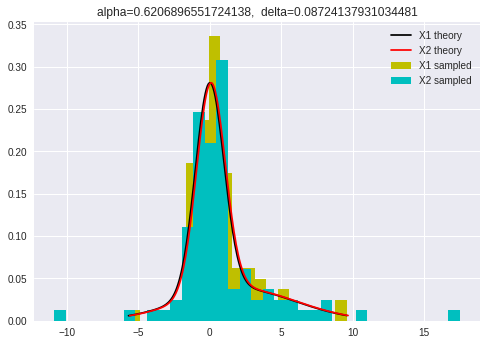


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2444.0, pvalue=0.7806252551793645)


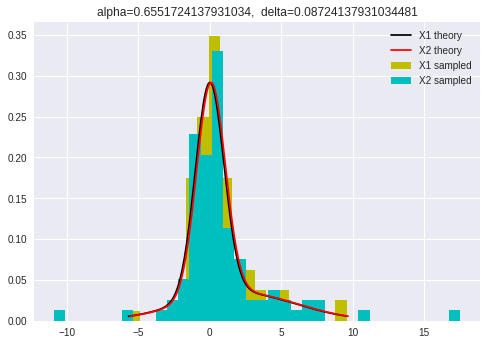


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2416.0, pvalue=0.7078260175355122)


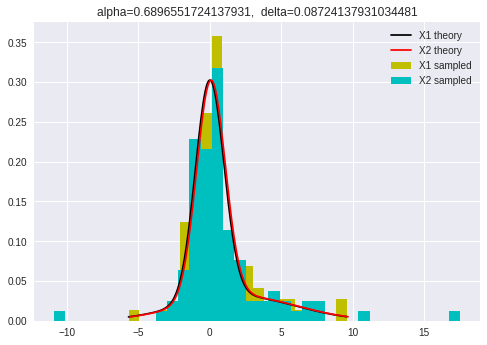


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2404.0, pvalue=0.6773827047880141)


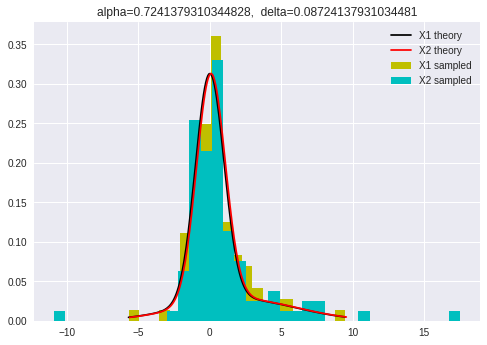


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2404.0, pvalue=0.6773827047880141)


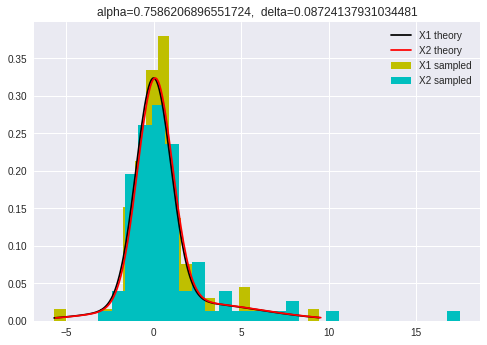


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2427.0, pvalue=0.7361501939167332)


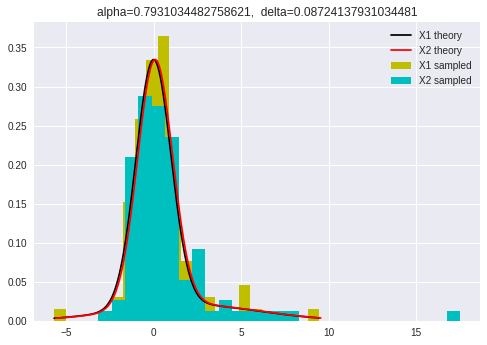


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2480.0, pvalue=0.8770384213786963)


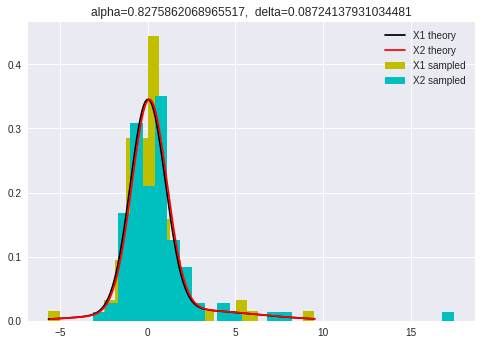


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2444.0, pvalue=0.7806252551793645)


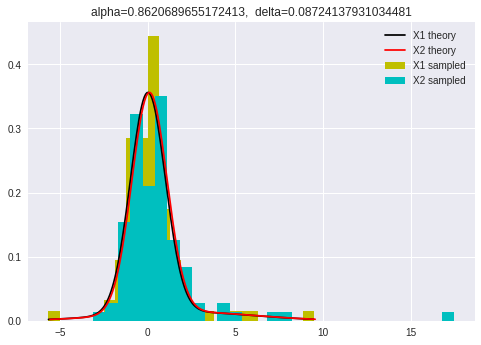


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


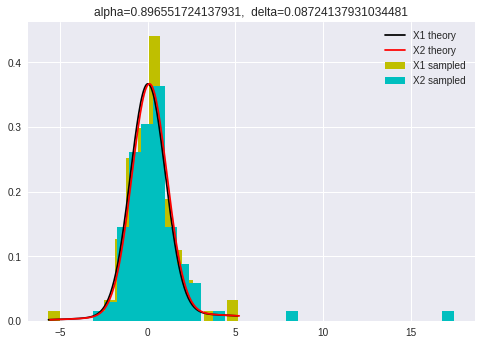


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2413.0, pvalue=0.7001689715399704)


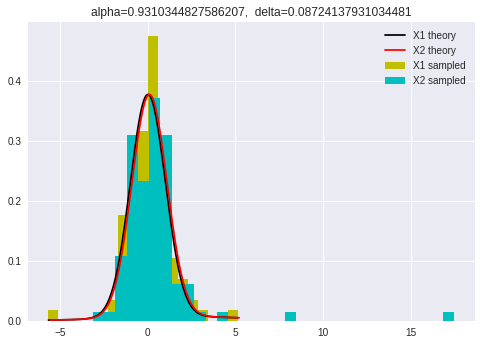


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2390.0, pvalue=0.6425231921087418)


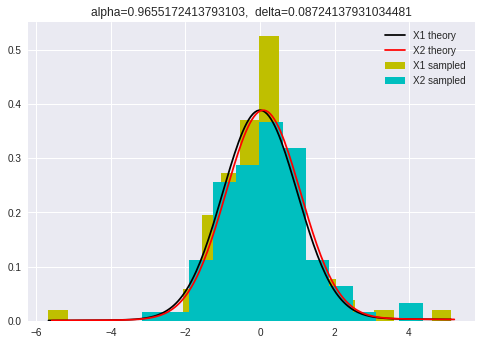


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2357.0, pvalue=0.5635081585027861)


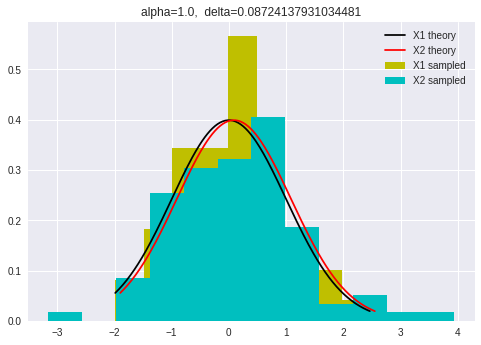

 57%|█████▋    | 17/30 [02:21<01:48,  8.33s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2495.0, pvalue=0.9178441245028052)


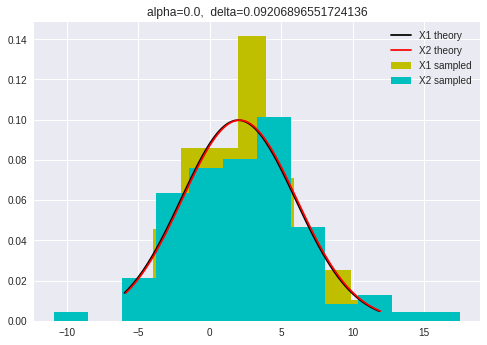


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2466.0, pvalue=0.8392435483441993)


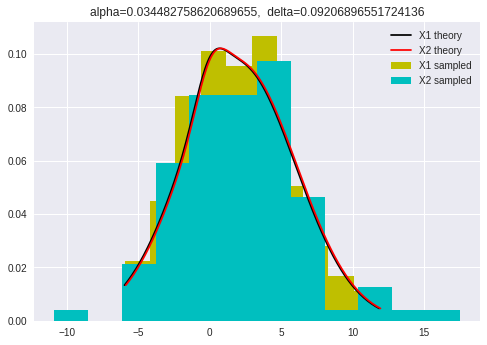


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2446.0, pvalue=0.7859083271789165)


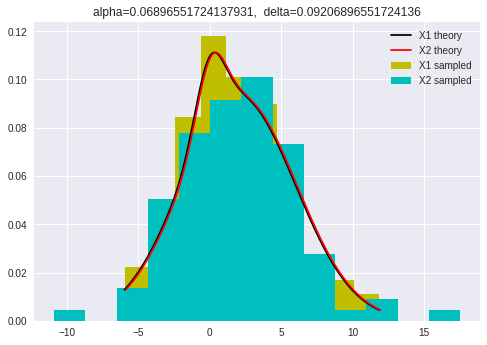


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2437.0, pvalue=0.7622156087305044)


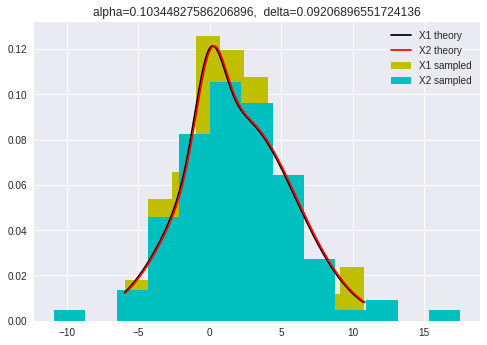


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2441.0, pvalue=0.7727196720119712)


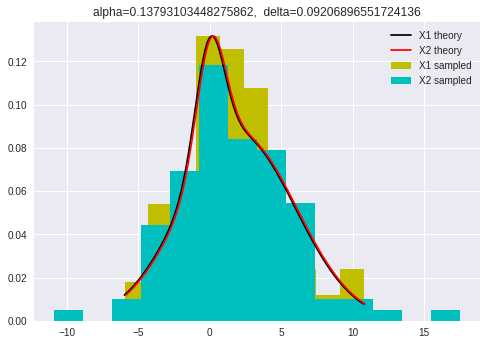


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


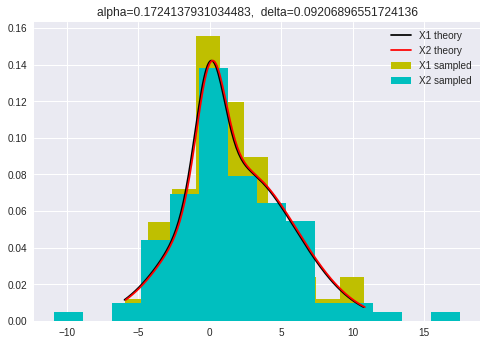


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2461.0, pvalue=0.8258300417006286)


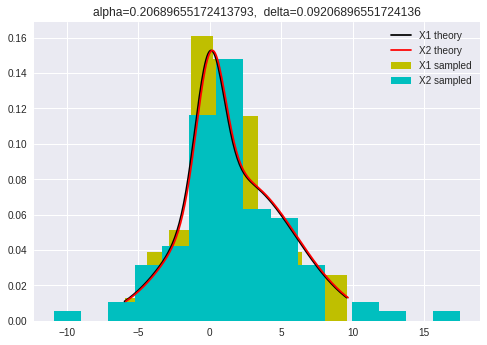


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


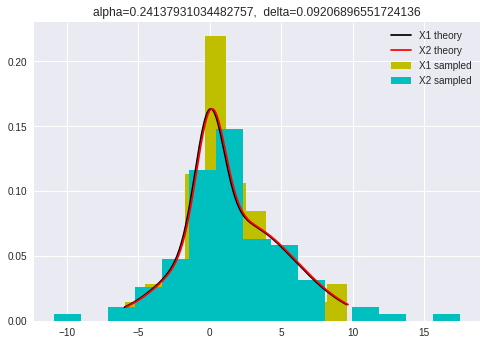


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2479.0, pvalue=0.8743284035131398)


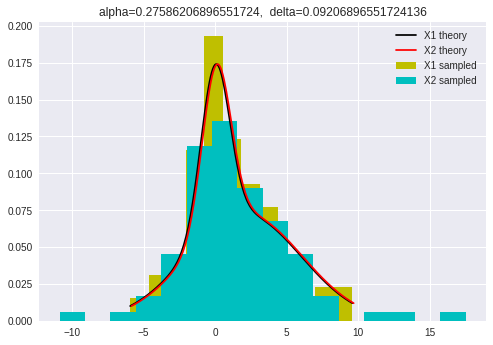


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2513.0, pvalue=0.9670887024899815)


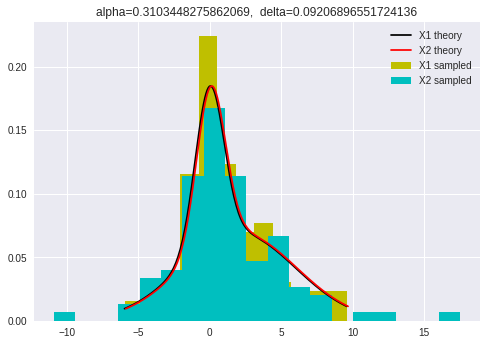


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2506.0, pvalue=0.947912712213223)


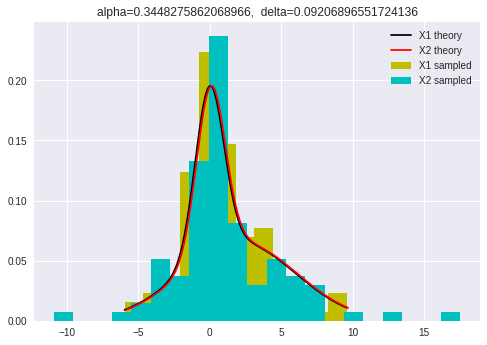


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2480.0, pvalue=0.8770384213786963)


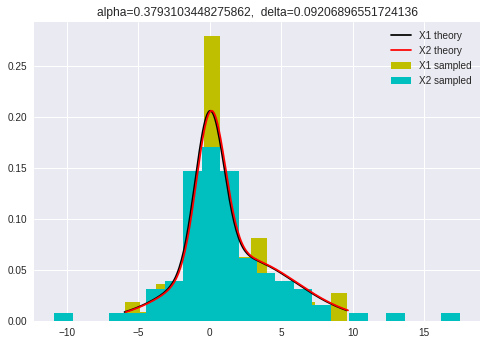


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2457.0, pvalue=0.8151355219610021)


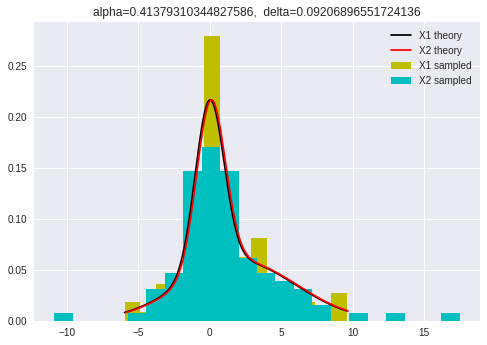


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2489.0, pvalue=0.9014897097022484)


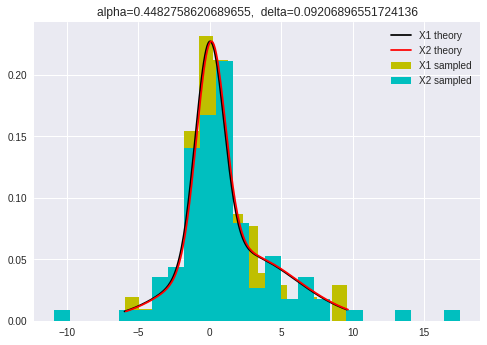


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2488.0, pvalue=0.8987678439874949)


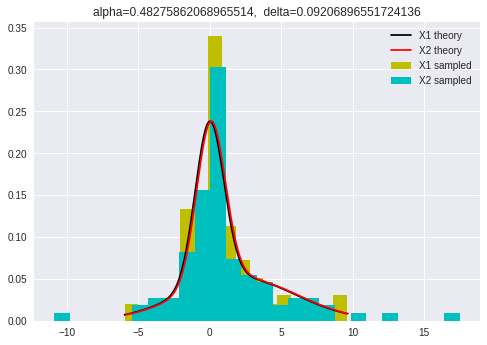


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2506.0, pvalue=0.947912712213223)


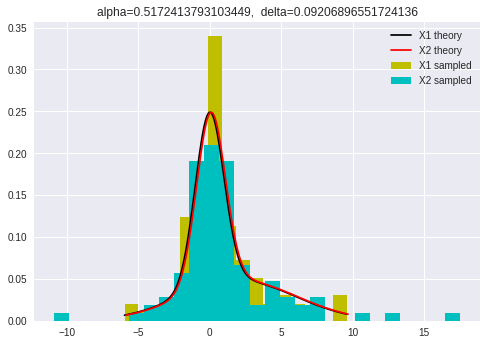


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2447.0, pvalue=0.7885535816793301)


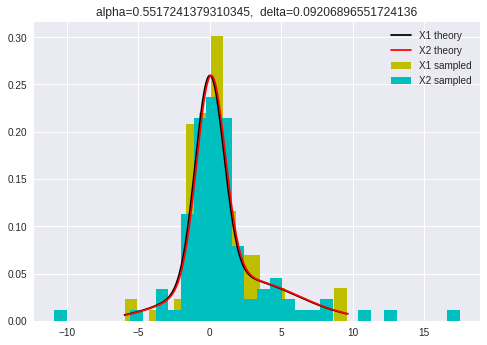


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2468.0, pvalue=0.8446222853530765)


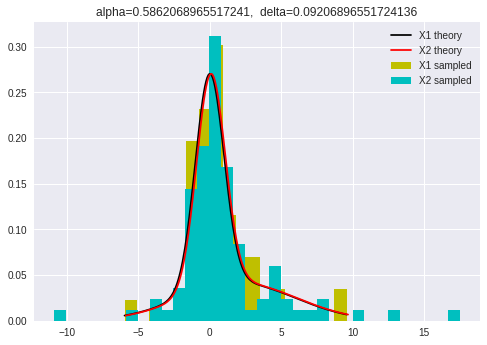


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2464.0, pvalue=0.8338723094405576)


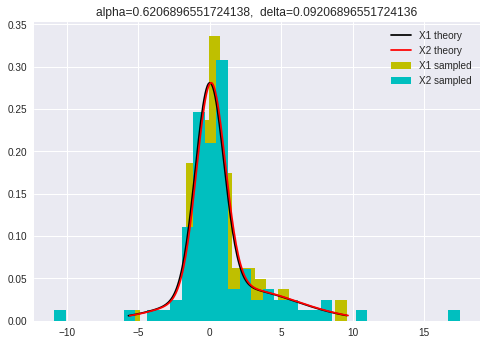


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2434.0, pvalue=0.7543660885045383)


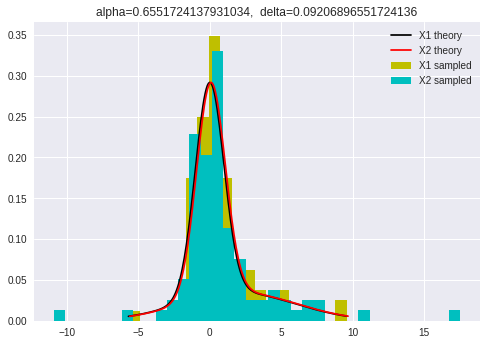


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2406.0, pvalue=0.6824217651170663)


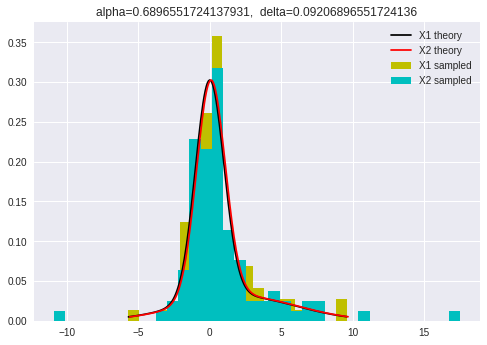


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2394.0, pvalue=0.652407226795377)


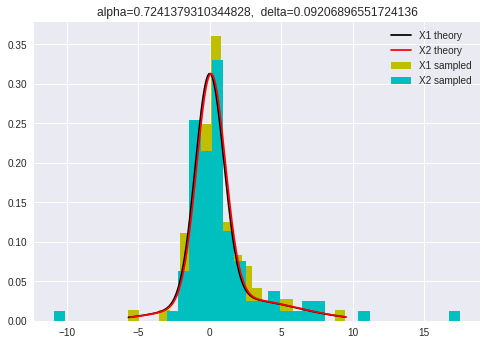


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2394.0, pvalue=0.652407226795377)


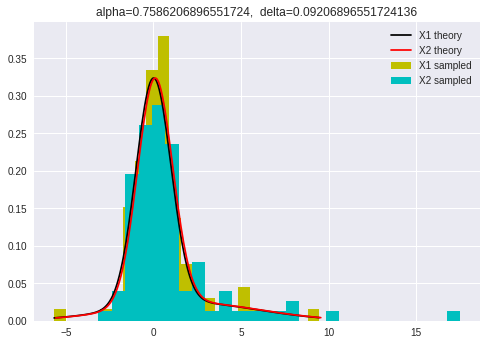


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2417.0, pvalue=0.7103849915044168)


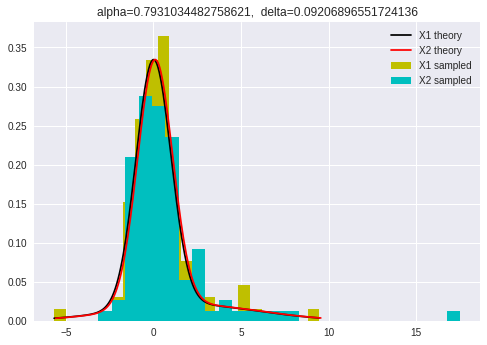


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2469.0, pvalue=0.8473143893644655)


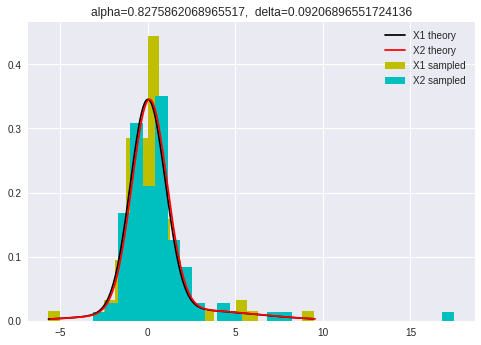


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


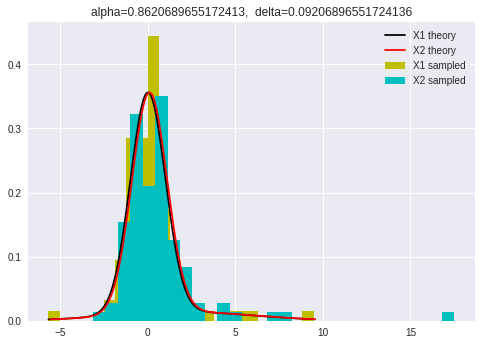


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2422.0, pvalue=0.7232283767760339)


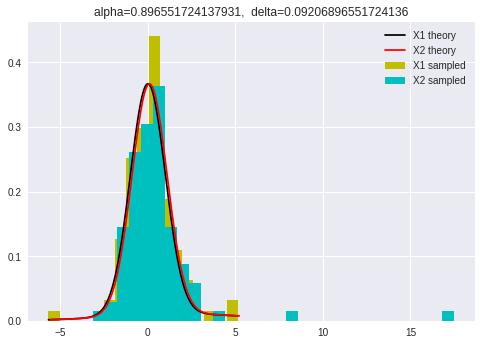


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


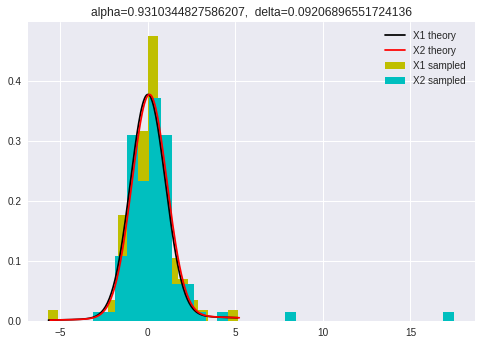


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2376.0, pvalue=0.6084337865773708)


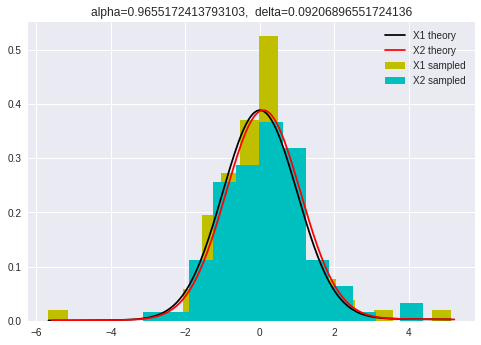


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2345.0, pvalue=0.5359832452872442)


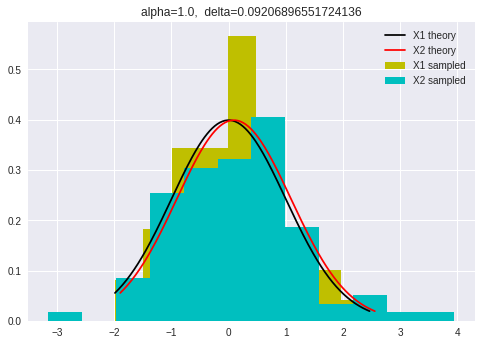

 60%|██████    | 18/30 [02:29<01:39,  8.31s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2492.0, pvalue=0.9096621319022171)


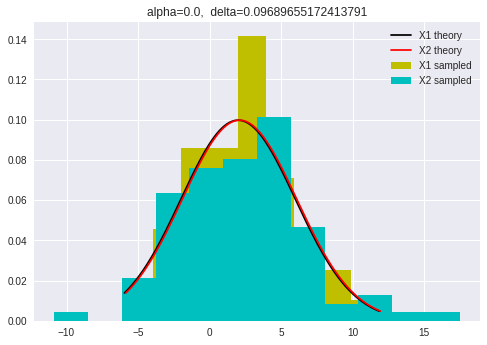


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2463.0, pvalue=0.8311895778148274)


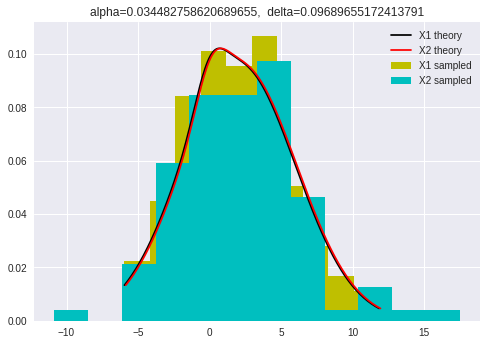


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2441.0, pvalue=0.7727196720119712)


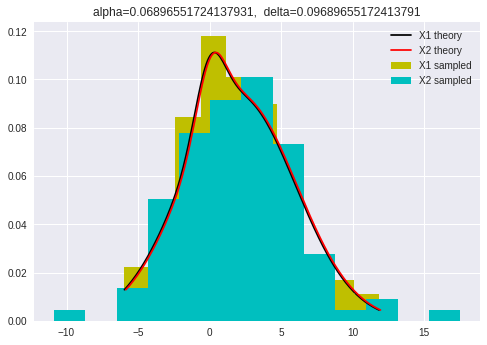


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


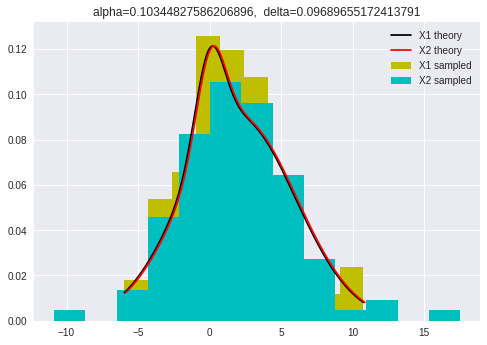


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2437.0, pvalue=0.7622156087305044)


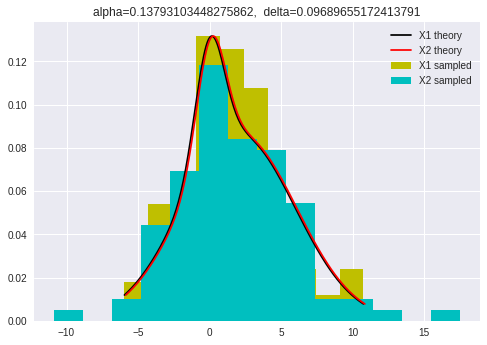


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2469.0, pvalue=0.8473143893644655)


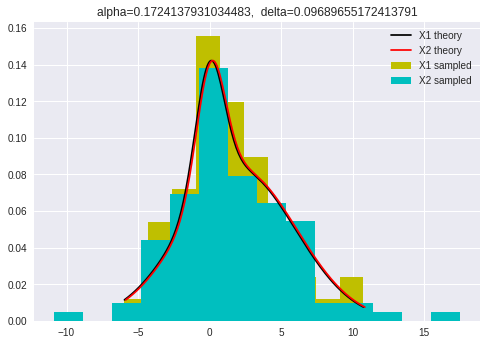


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2459.0, pvalue=0.8204786096104631)


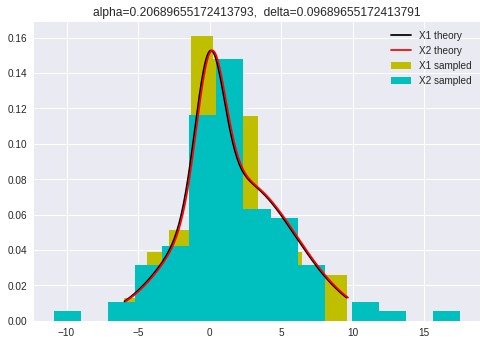


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


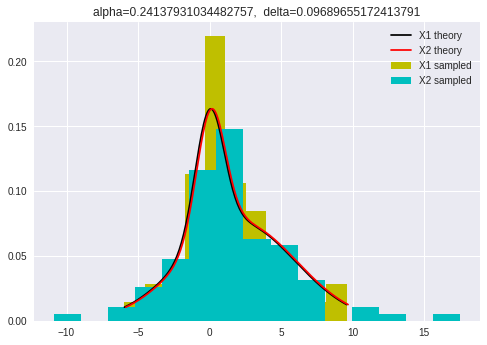


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2477.0, pvalue=0.8689128190274791)


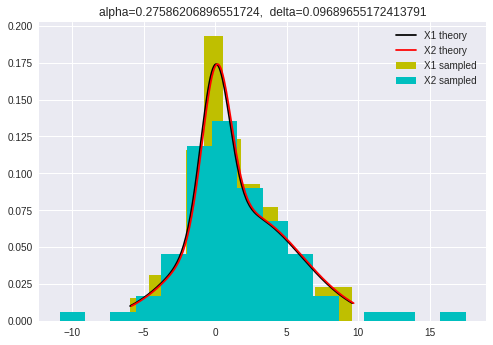


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2516.0, pvalue=0.9753134632163343)


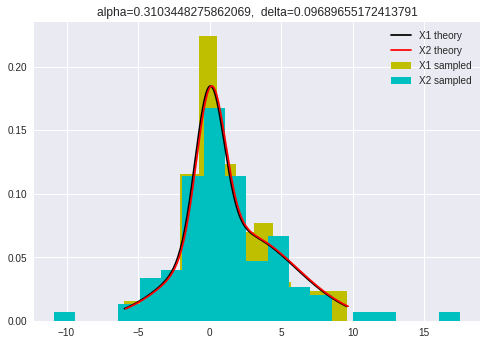


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2503.0, pvalue=0.9397030087863819)


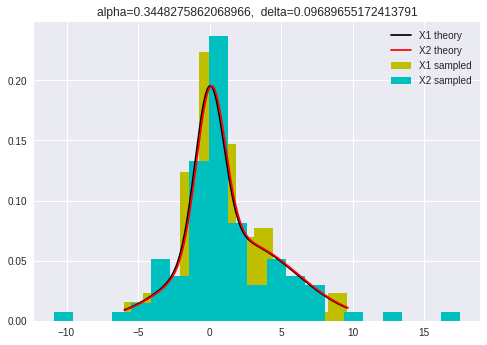


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2476.0, pvalue=0.8662073147584464)


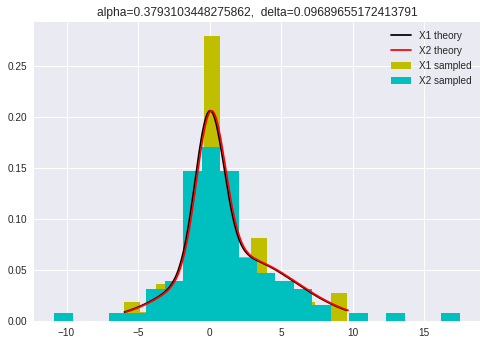


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2453.0, pvalue=0.8044753358016482)


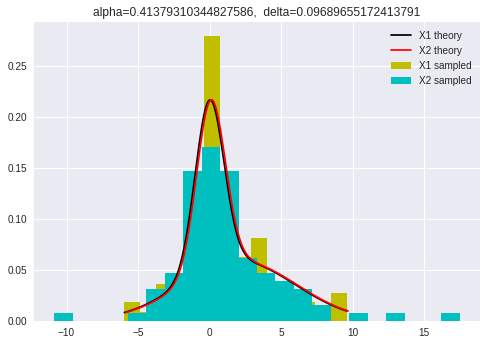


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2485.0, pvalue=0.8906095152877423)


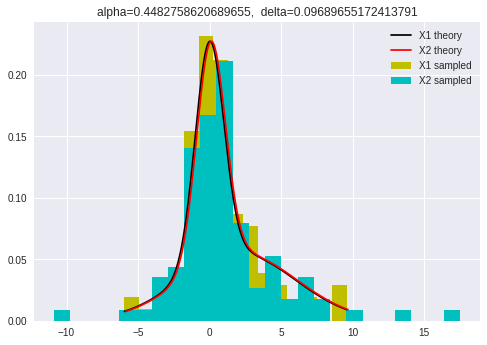


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2484.0, pvalue=0.8878926004885652)


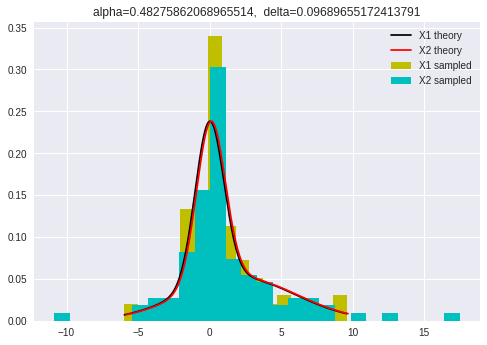


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2499.0, pvalue=0.9287668478981905)


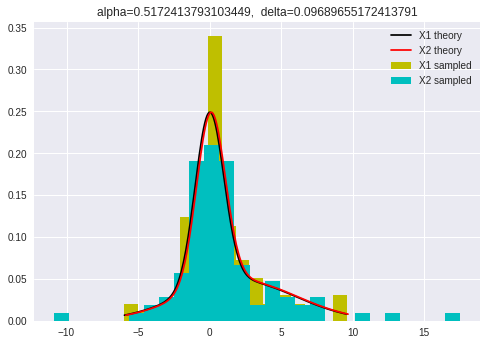


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


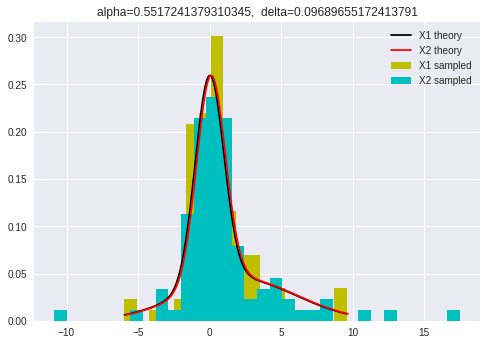


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


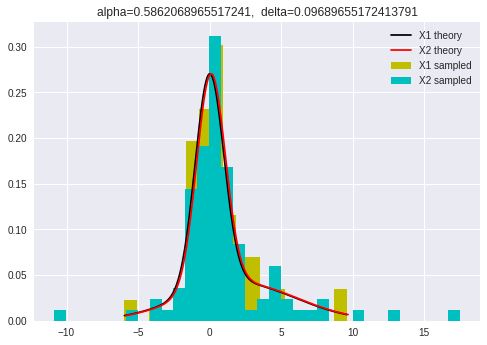


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


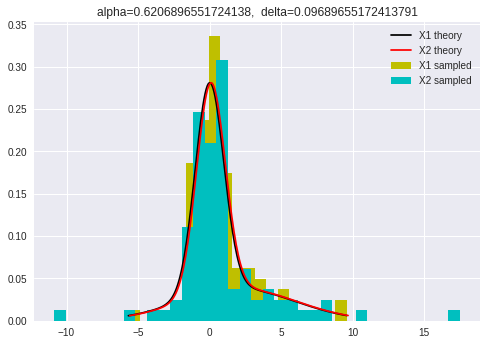


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2425.0, pvalue=0.7309722689902687)


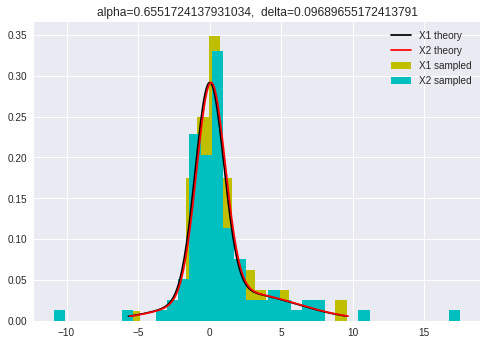


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2397.0, pvalue=0.6598606407090197)


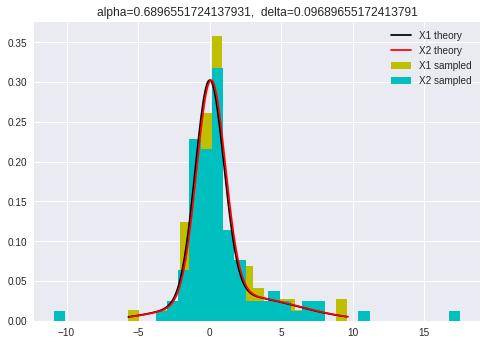


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2385.0, pvalue=0.6302567676905975)


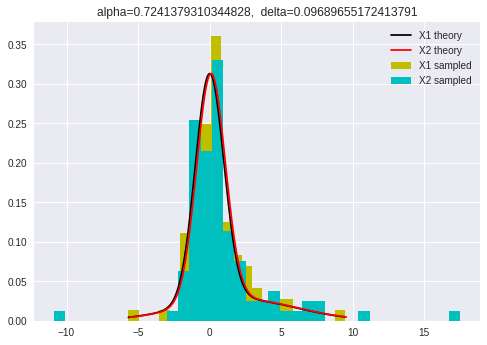


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2386.0, pvalue=0.6327020543587233)


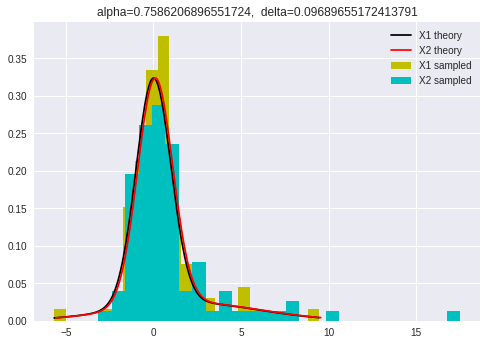


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2412.0, pvalue=0.6976233342391592)


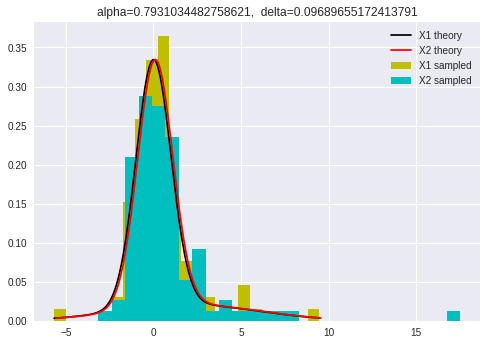


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2465.0, pvalue=0.8365569764052994)


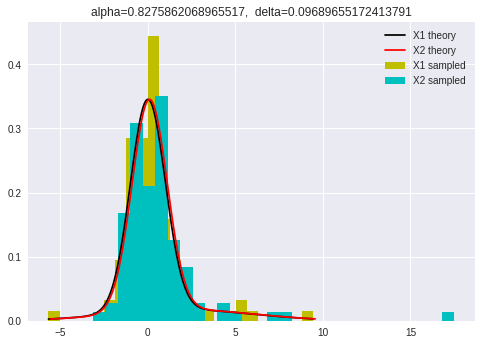


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


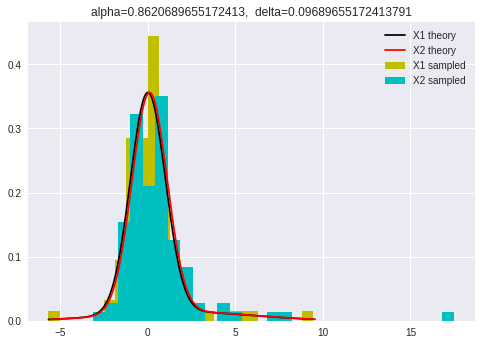


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2417.0, pvalue=0.7103849915044168)


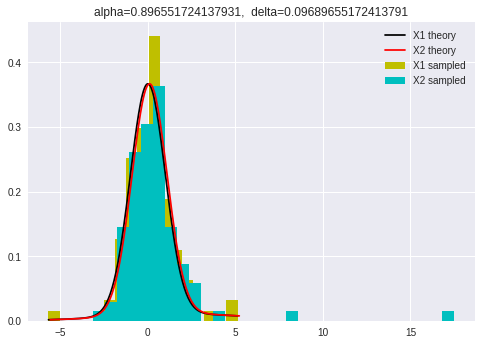


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2394.0, pvalue=0.652407226795377)


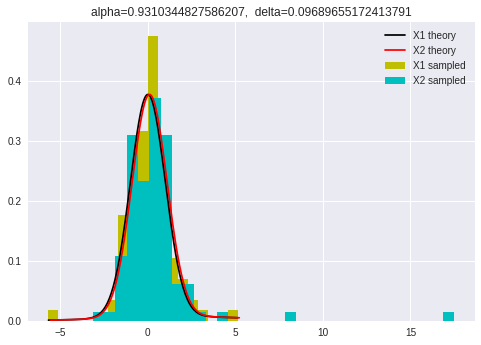


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2371.0, pvalue=0.5964572394238804)


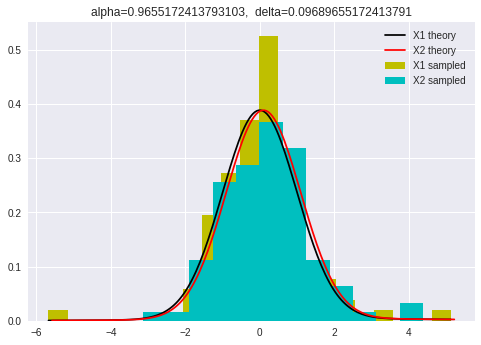


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2338.0, pvalue=0.5202456779483677)


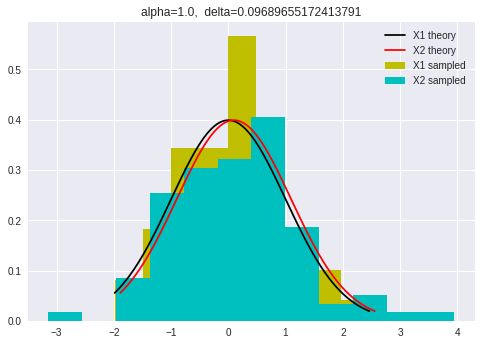

 63%|██████▎   | 19/30 [02:37<01:31,  8.32s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2489.0, pvalue=0.9014897097022484)


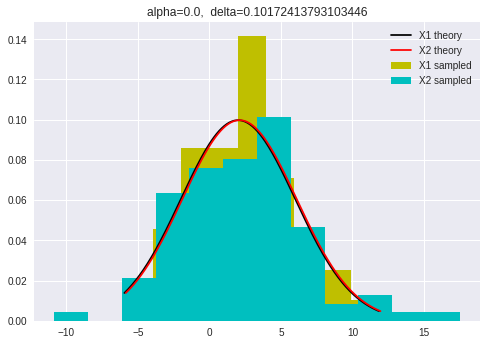


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


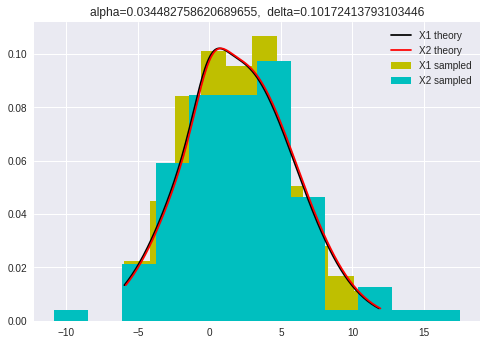


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2437.0, pvalue=0.7622156087305044)


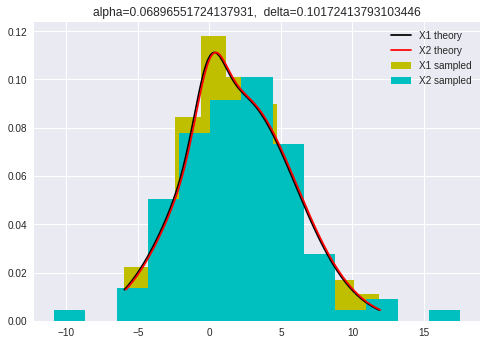


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


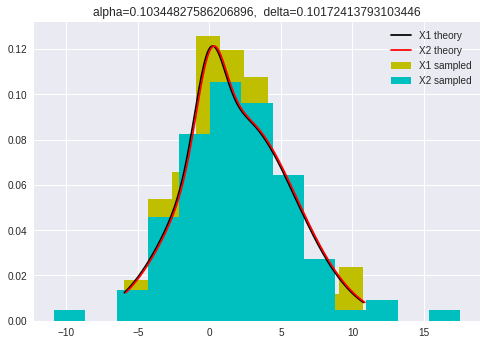


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2432.0, pvalue=0.7491470801654898)


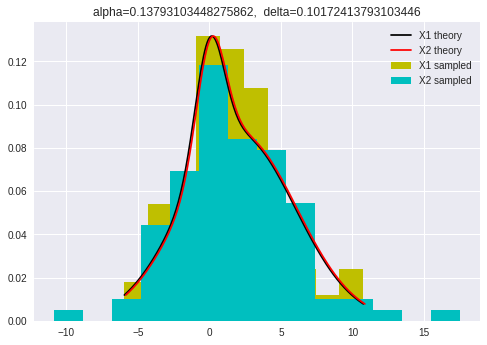


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2465.0, pvalue=0.8365569764052994)


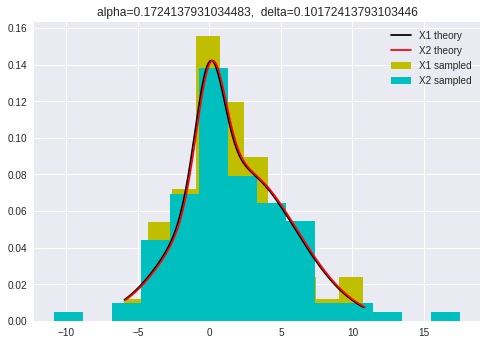


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2456.0, pvalue=0.8124671821144986)


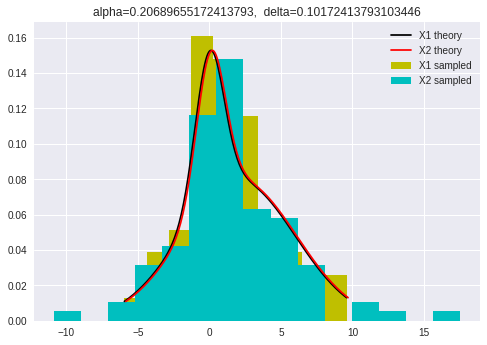


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


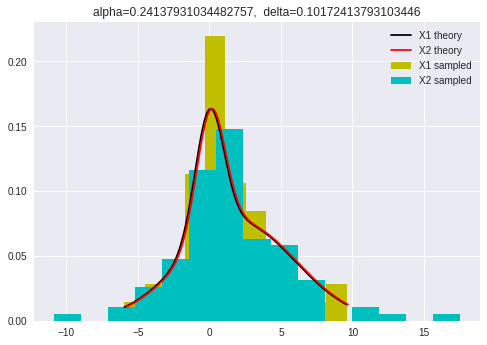


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2473.0, pvalue=0.8581003268196077)


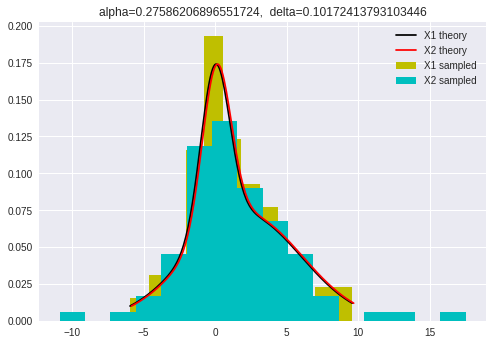


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2521.0, pvalue=0.9890268007061765)


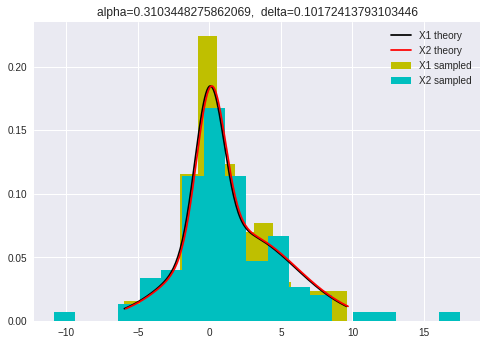


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2498.0, pvalue=0.9260348271927795)


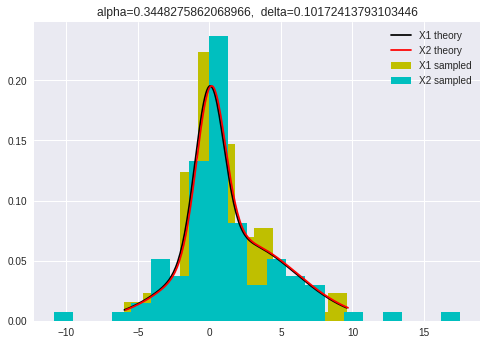


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2471.0, pvalue=0.8527039152769147)


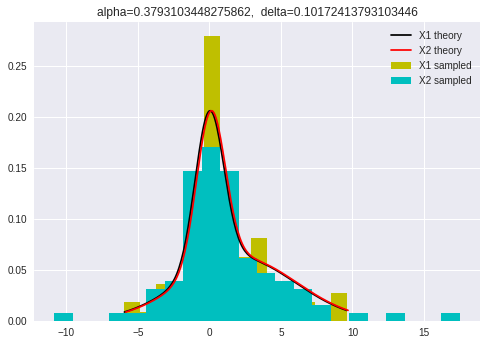


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2448.0, pvalue=0.7912012765498633)


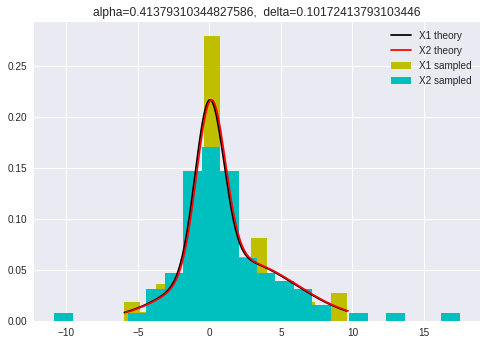


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2481.0, pvalue=0.8797498813382739)


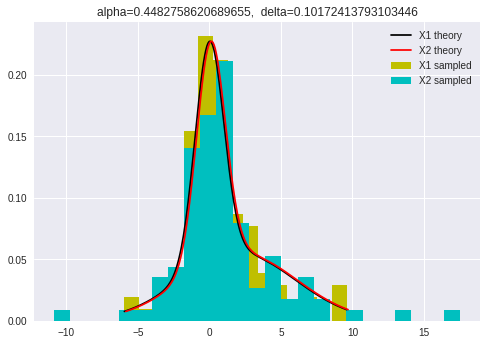


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2480.0, pvalue=0.8770384213786963)


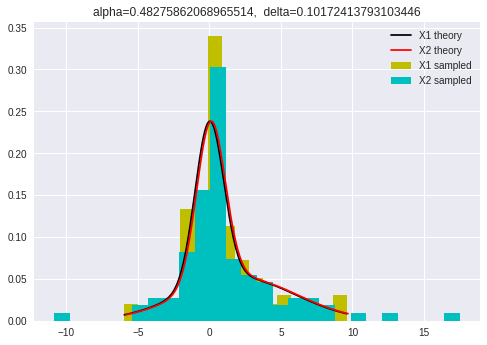


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2496.0, pvalue=0.9205734335120058)


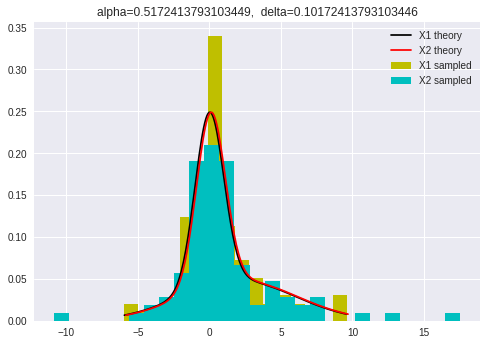


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2436.0, pvalue=0.7595963382015569)


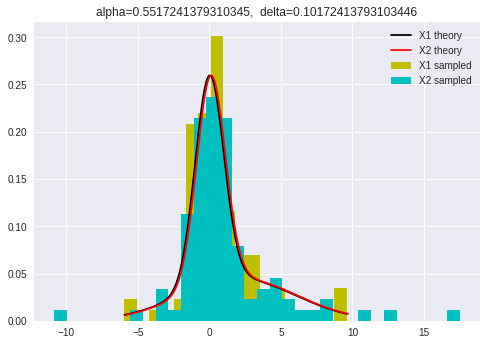


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2457.0, pvalue=0.8151355219610021)


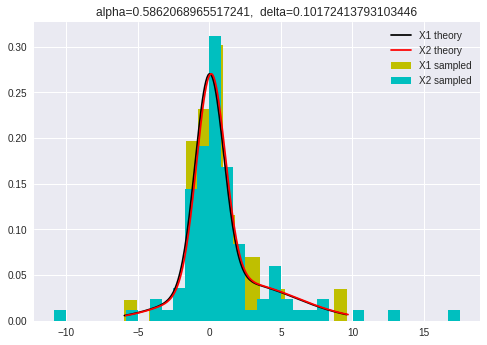


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2451.0, pvalue=0.7991587121799286)


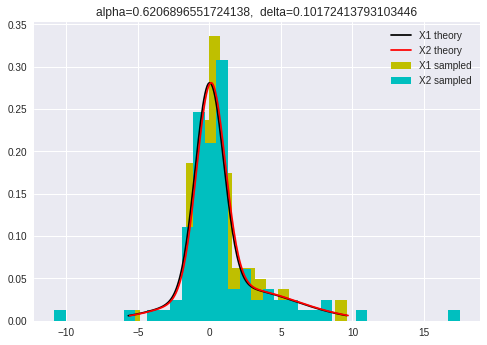


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2421.0, pvalue=0.7206533187202941)


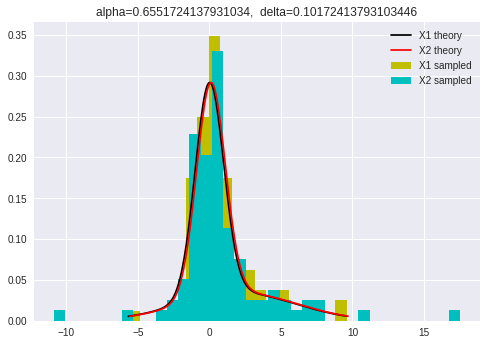


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2392.0, pvalue=0.6474574389756316)


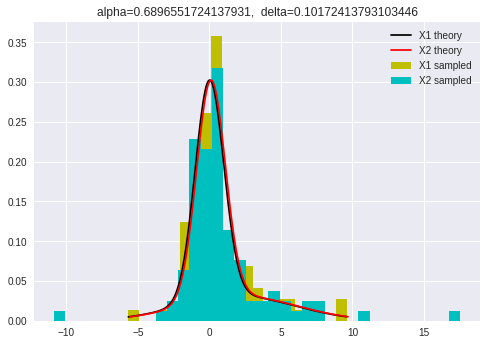


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2380.0, pvalue=0.61809143216358)


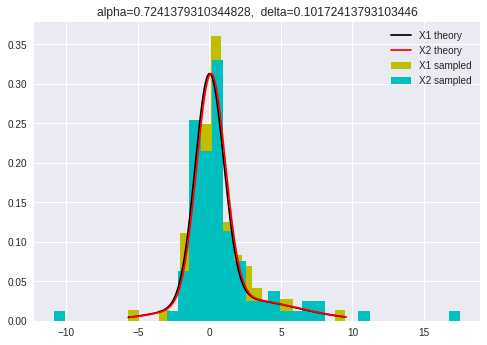


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2381.0, pvalue=0.6205162798090659)


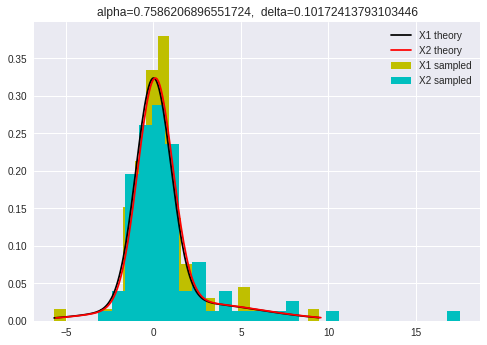


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2405.0, pvalue=0.6799004477897137)


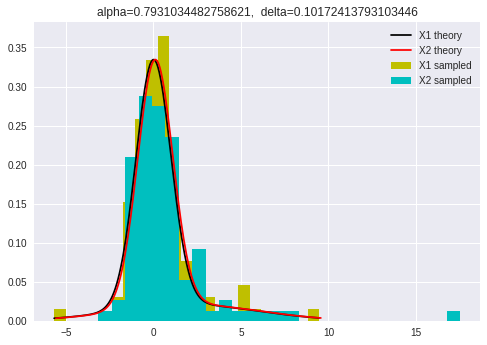


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2458.0, pvalue=0.817806007749672)


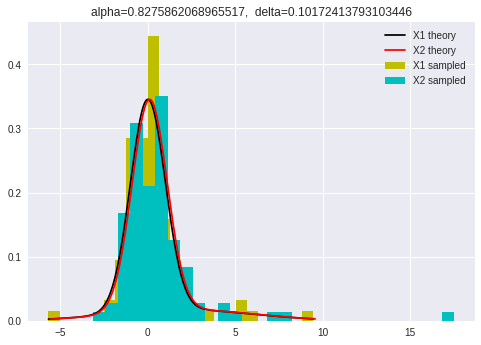


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2421.0, pvalue=0.7206533187202941)


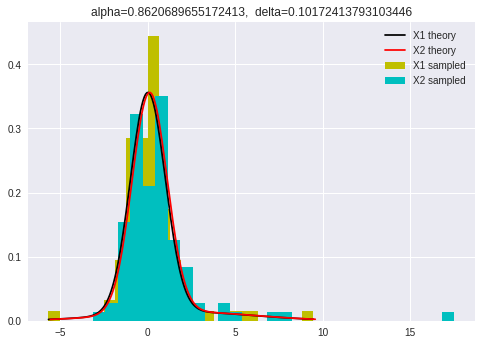


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2409.0, pvalue=0.6900069147093293)


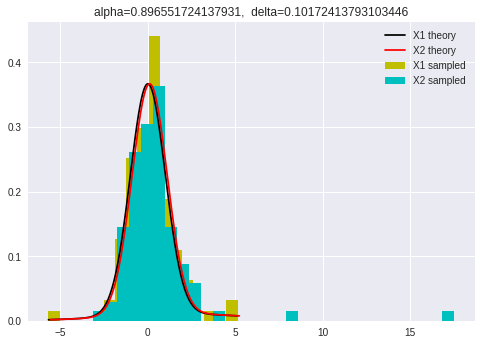


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2386.0, pvalue=0.6327020543587233)


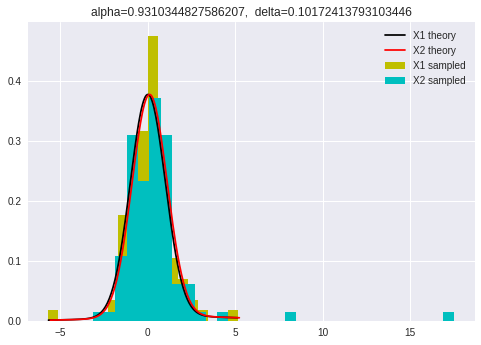


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2364.0, pvalue=0.579872956766072)


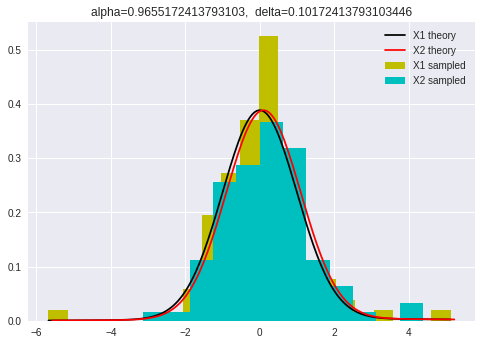


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2329.0, pvalue=0.500367472717453)


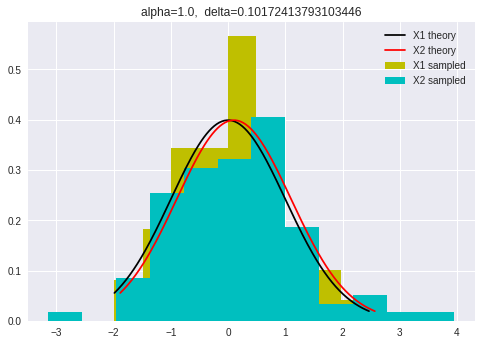

 67%|██████▋   | 20/30 [02:46<01:22,  8.29s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2487.0, pvalue=0.8960471686012128)


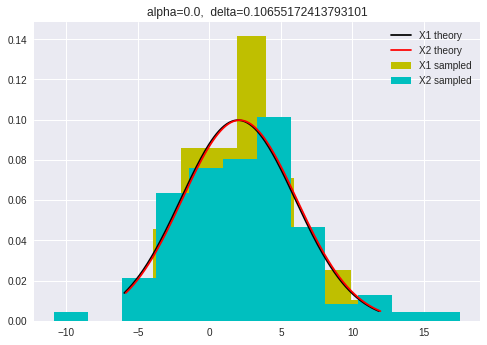


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2458.0, pvalue=0.817806007749672)


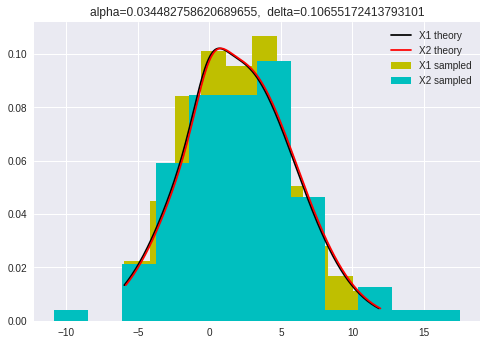


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2434.0, pvalue=0.7543660885045383)


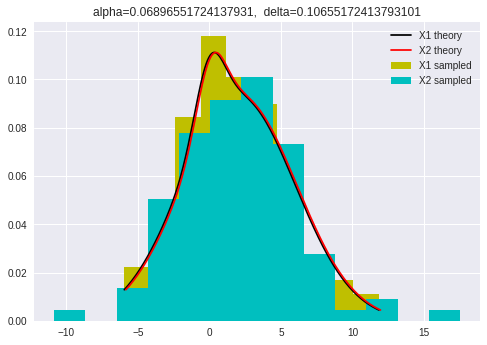


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2426.0, pvalue=0.7335597164128502)


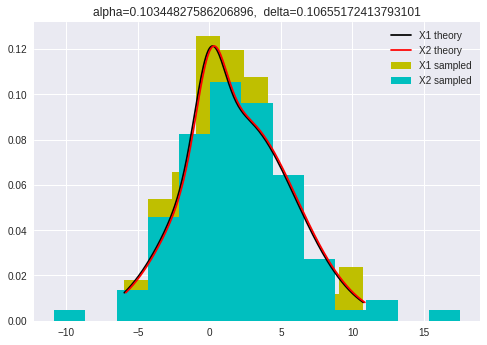


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2428.0, pvalue=0.7387436743898753)


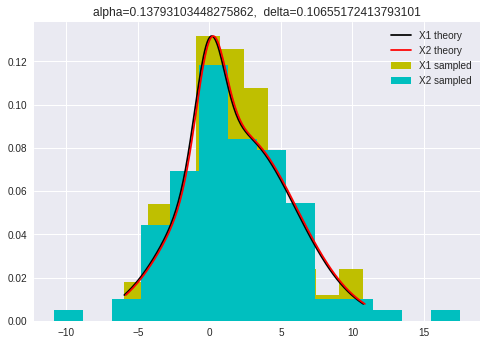


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2462.0, pvalue=0.8285088118253296)


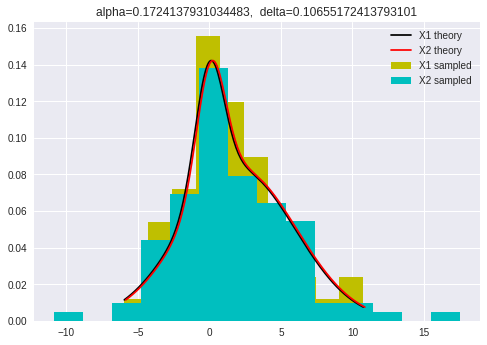


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2452.0, pvalue=0.8018158769149264)


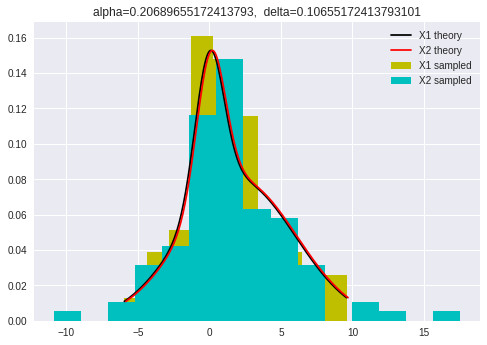


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2425.0, pvalue=0.7309722689902687)


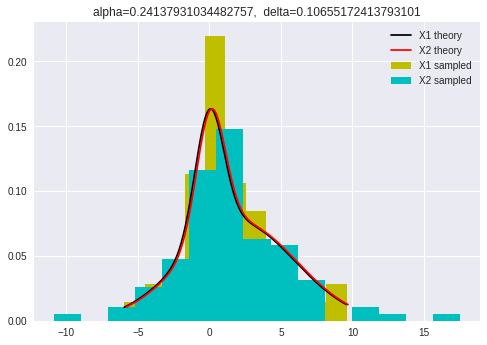


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2469.0, pvalue=0.8473143893644655)


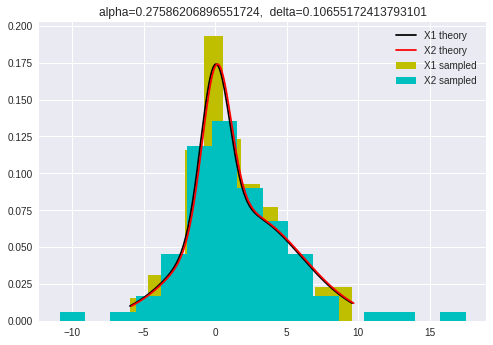


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2522.0, pvalue=0.9917699870208231)


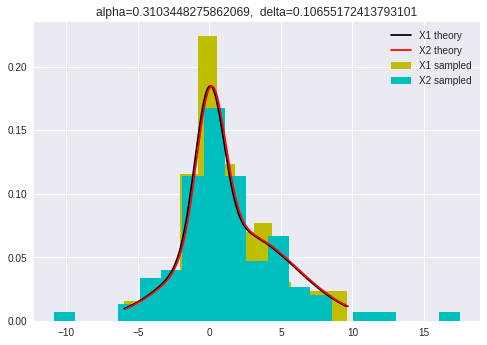


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2490.0, pvalue=0.9042127340742919)


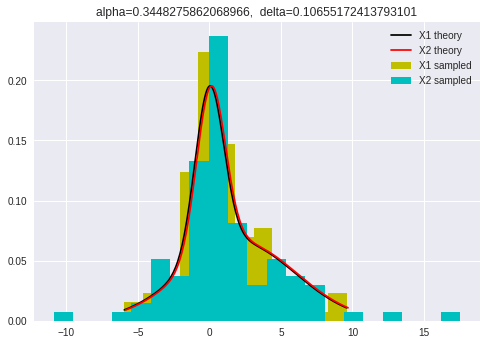


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2463.0, pvalue=0.8311895778148274)


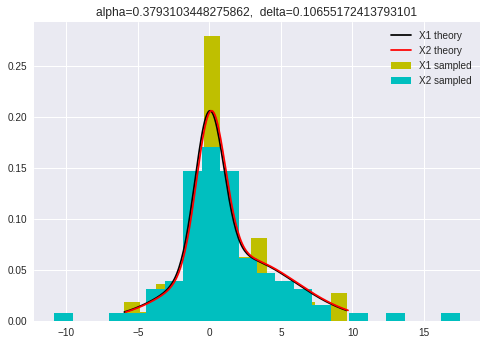


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2440.0, pvalue=0.7700896655852555)


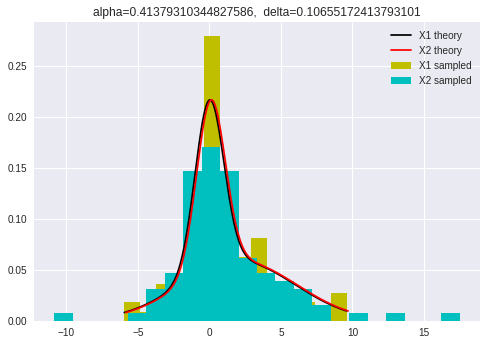


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2472.0, pvalue=0.8554012757415651)


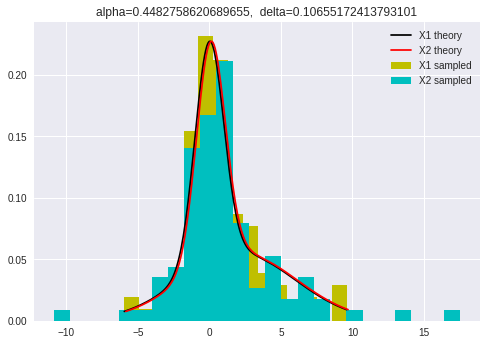


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2471.0, pvalue=0.8527039152769147)


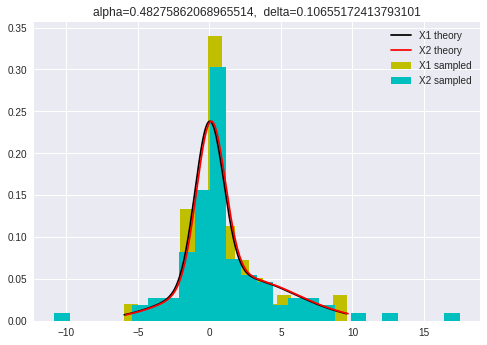


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2487.0, pvalue=0.8960471686012128)


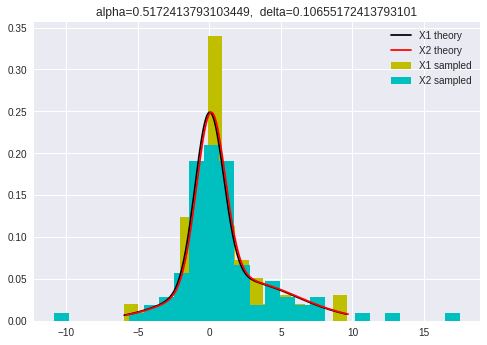


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2427.0, pvalue=0.7361501939167332)


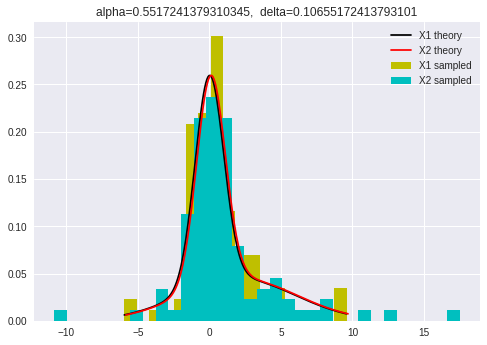


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2448.0, pvalue=0.7912012765498633)


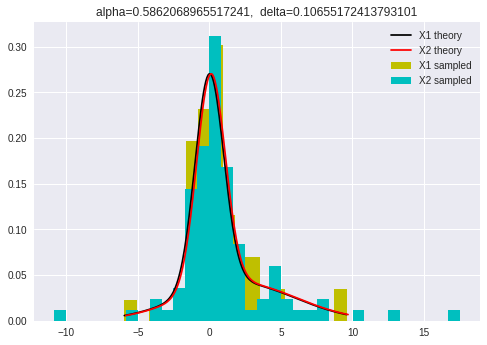


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


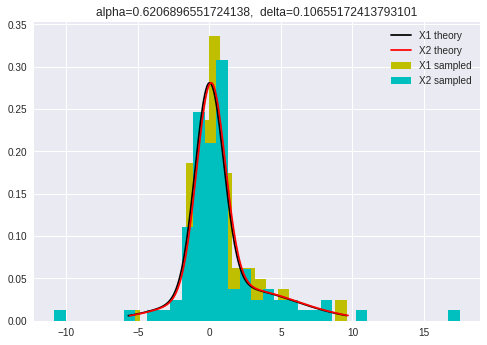


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2413.0, pvalue=0.7001689715399704)


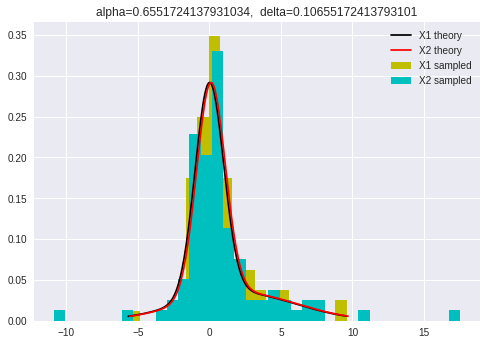


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2384.0, pvalue=0.6278155248427884)


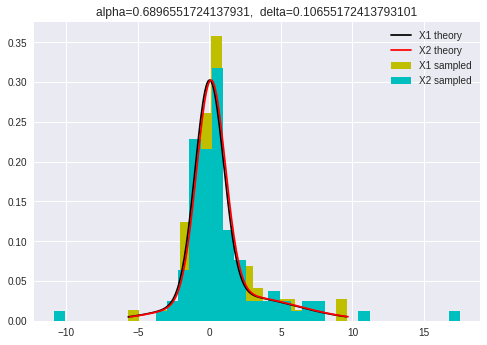


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2370.0, pvalue=0.5940748720051938)


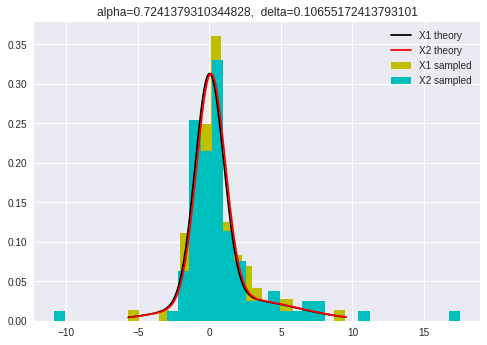


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2371.0, pvalue=0.5964572394238804)


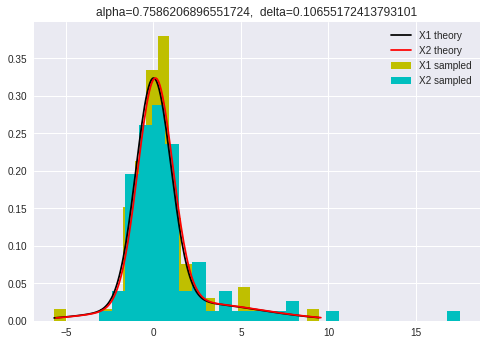


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2397.0, pvalue=0.6598606407090197)


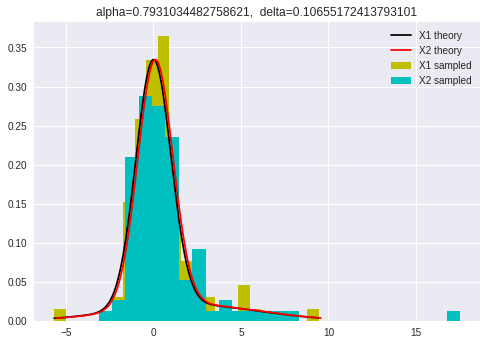


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


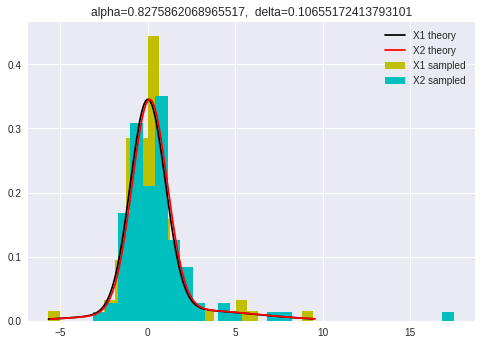


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2411.0, pvalue=0.695081095368113)


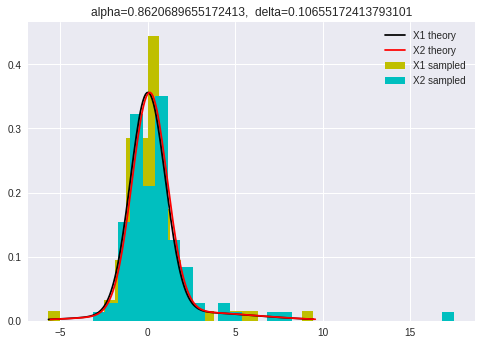


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


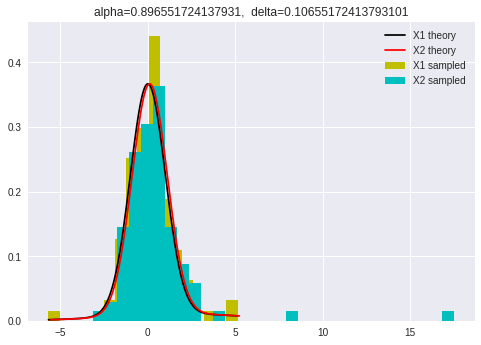


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2374.0, pvalue=0.603630307822939)


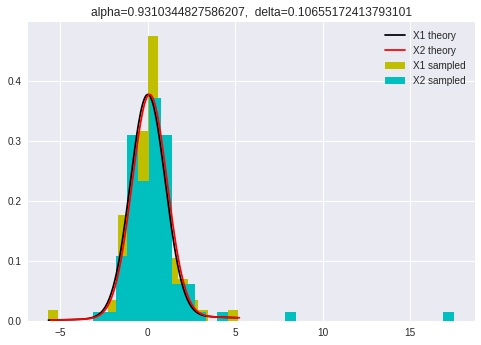


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2352.0, pvalue=0.5519569797477354)


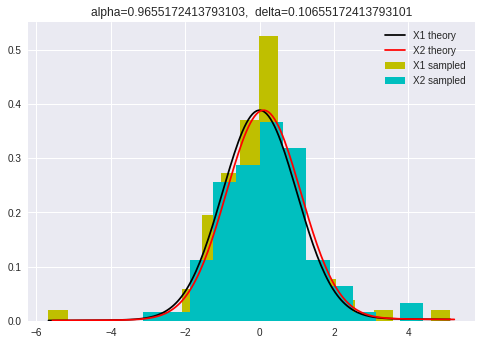


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2317.0, pvalue=0.4745030356140598)


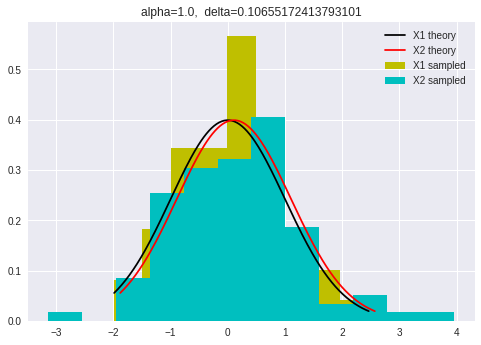

 70%|███████   | 21/30 [02:54<01:14,  8.25s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2482.0, pvalue=0.8824627520873338)


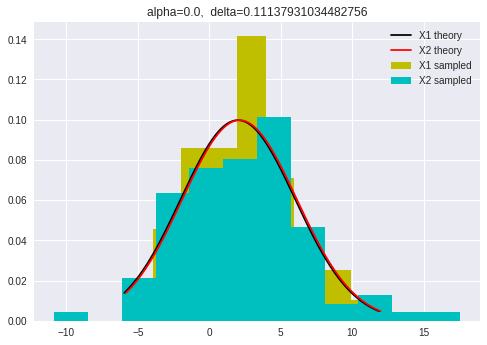


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2452.0, pvalue=0.8018158769149264)


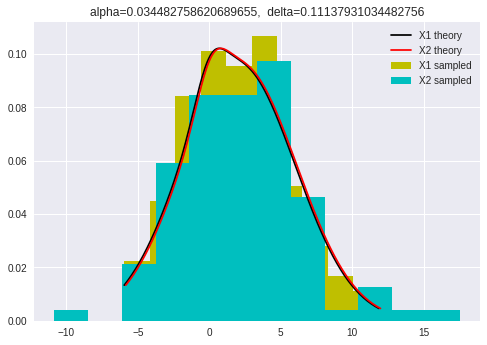


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2428.0, pvalue=0.7387436743898753)


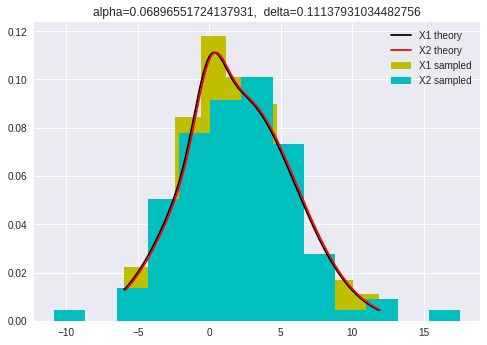


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2418.0, pvalue=0.7129472348148089)


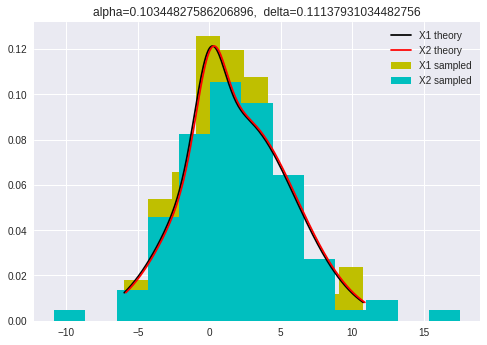


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2420.0, pvalue=0.7180814247397251)


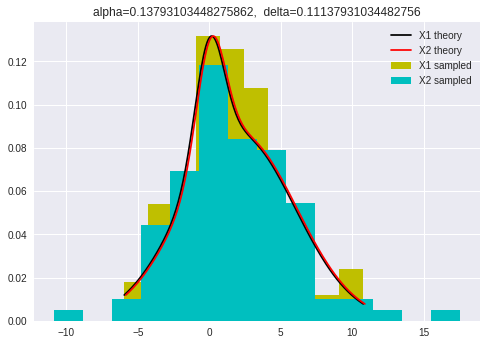


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2454.0, pvalue=0.8071370593535689)


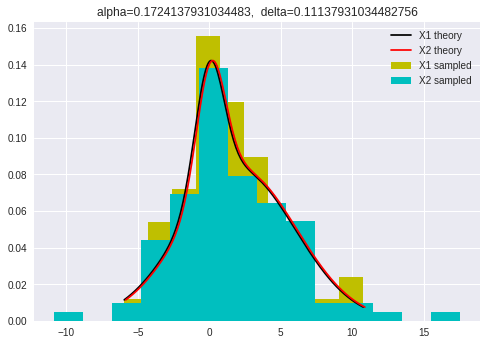


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2444.0, pvalue=0.7806252551793645)


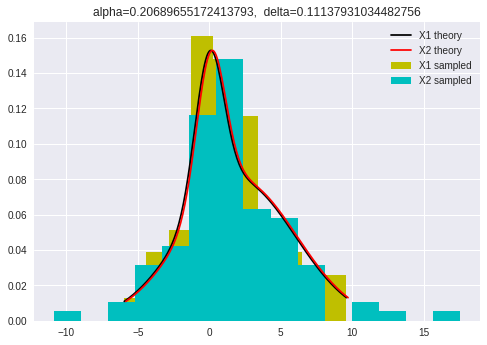


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2417.0, pvalue=0.7103849915044168)


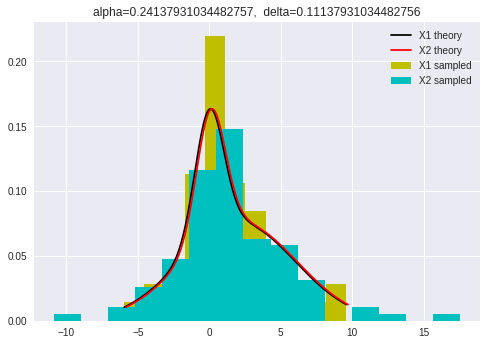


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2461.0, pvalue=0.8258300417006286)


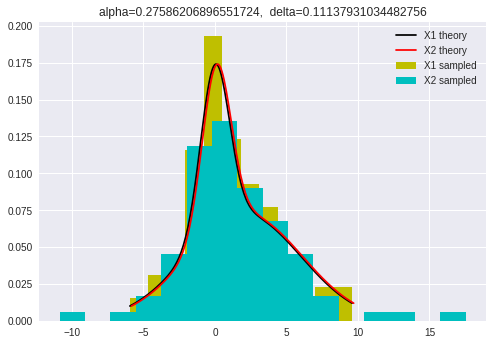


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2513.0, pvalue=0.9670887024899815)


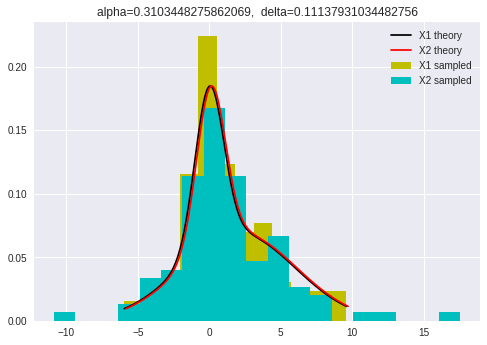


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2481.0, pvalue=0.8797498813382739)


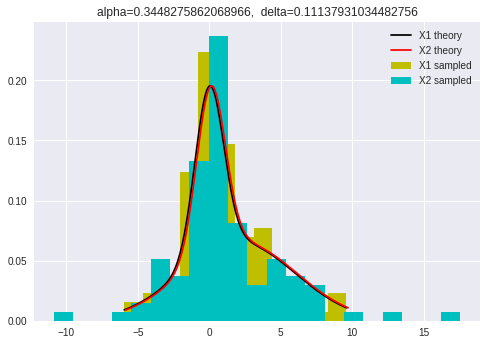


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2454.0, pvalue=0.8071370593535689)


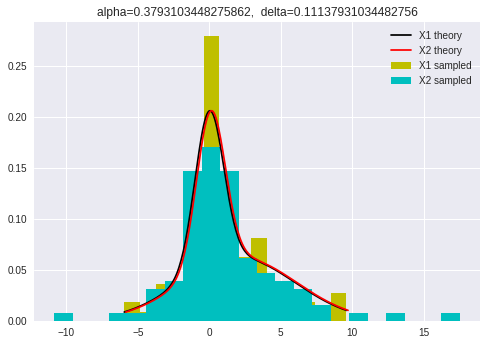


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2431.0, pvalue=0.7465418609724369)


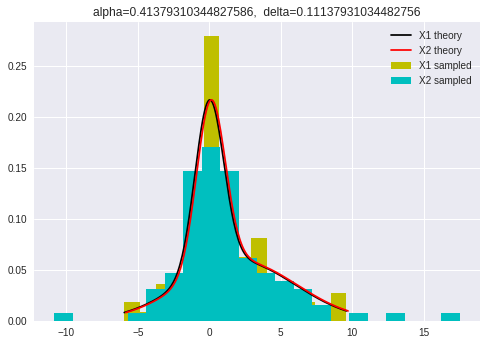


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2465.0, pvalue=0.8365569764052994)


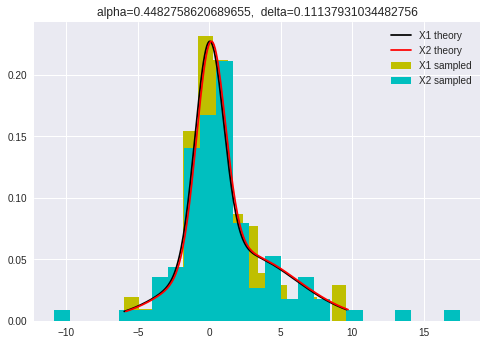


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2464.0, pvalue=0.8338723094405576)


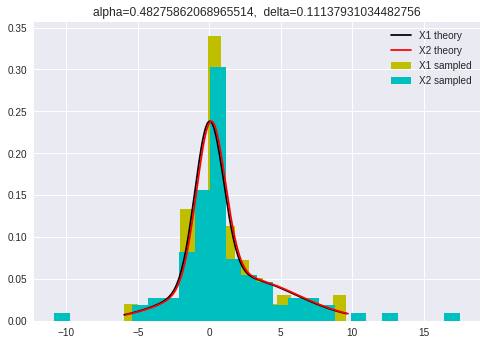


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2480.0, pvalue=0.8770384213786963)


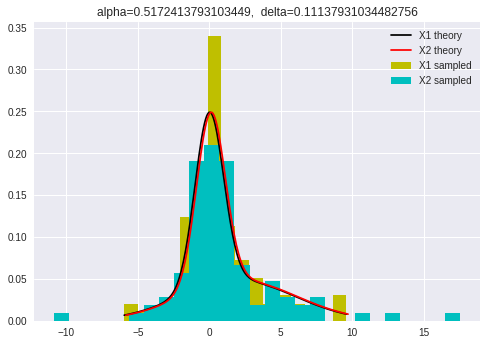


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2418.0, pvalue=0.7129472348148089)


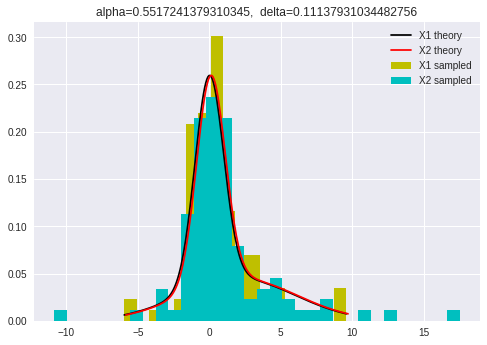


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2438.0, pvalue=0.7648376056140332)


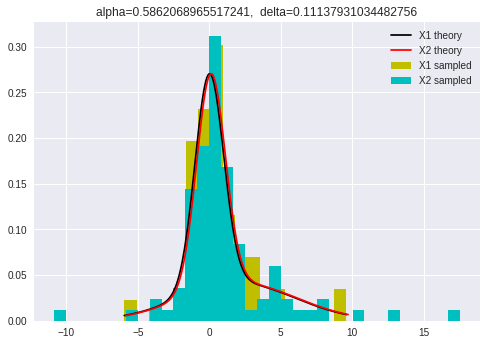


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2434.0, pvalue=0.7543660885045383)


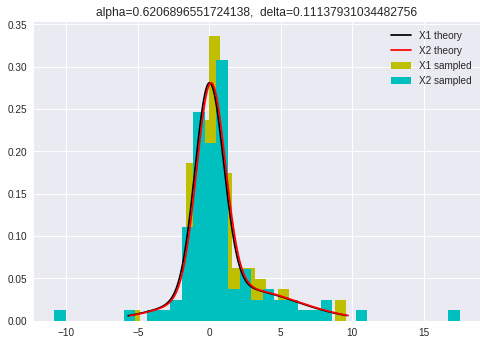


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2404.0, pvalue=0.6773827047880141)


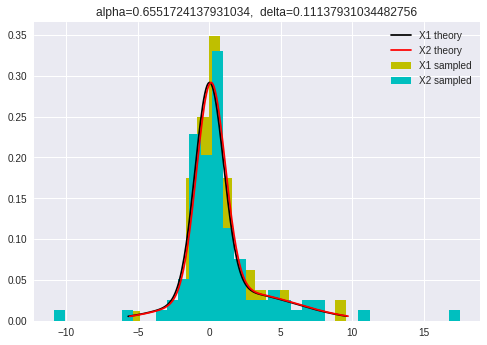


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2375.0, pvalue=0.6060299176865905)


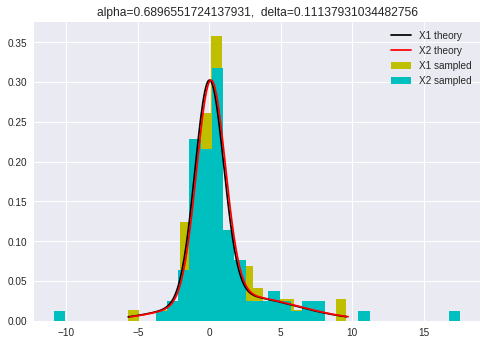


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2361.0, pvalue=0.5728322123507377)


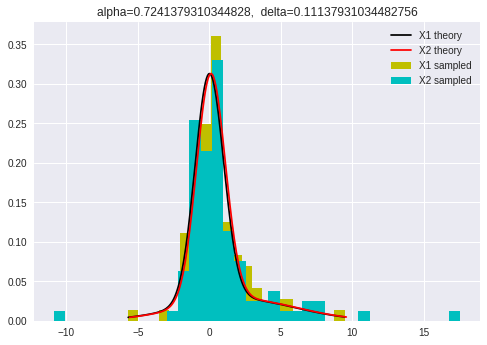


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2362.0, pvalue=0.5751746153622864)


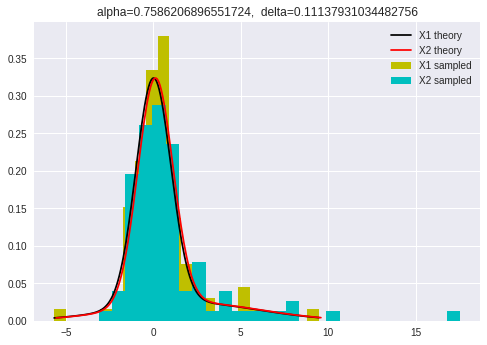


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2388.0, pvalue=0.6376046699936373)


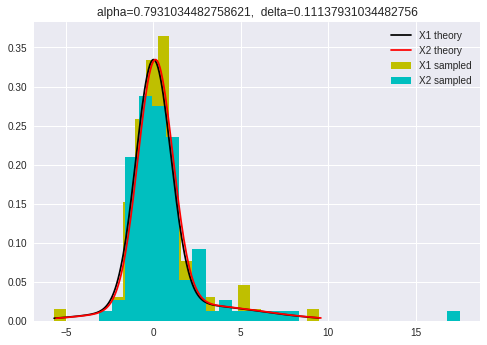


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2441.0, pvalue=0.7727196720119712)


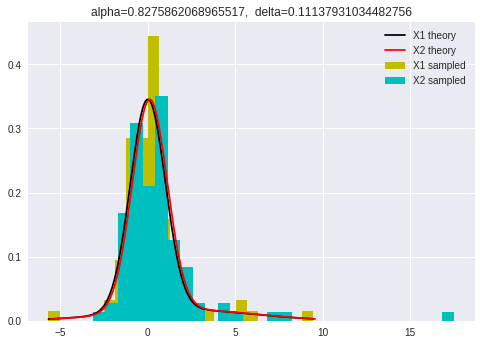


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2403.0, pvalue=0.6748685607674054)


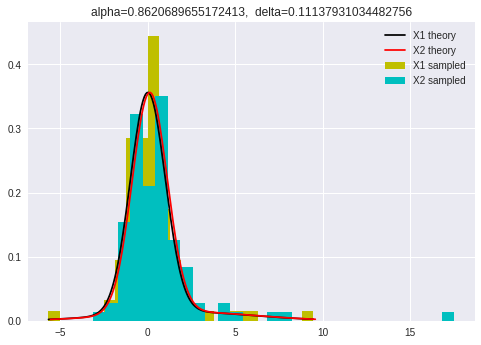


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2388.0, pvalue=0.6376046699936373)


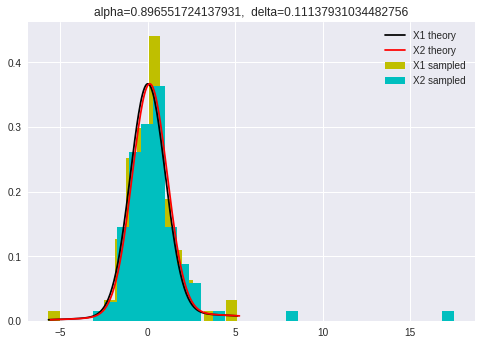


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2362.0, pvalue=0.5751746153622864)


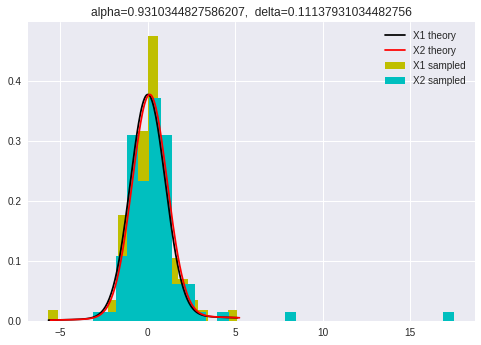


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2340.0, pvalue=0.5247177003787094)


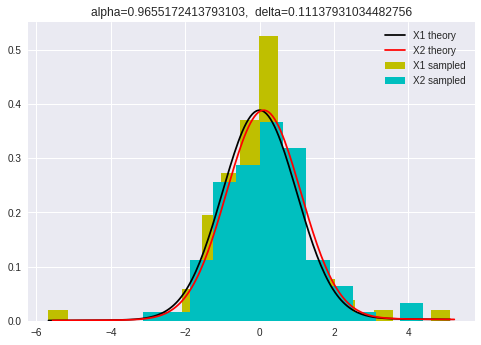


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2304.0, pvalue=0.4473324208168965)


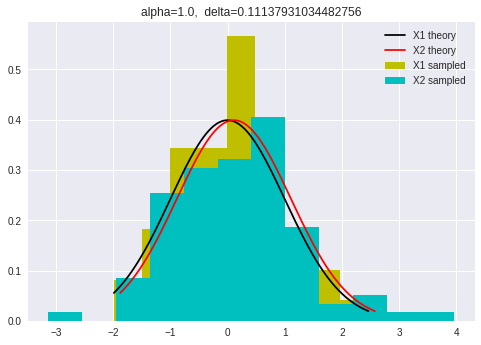

 73%|███████▎  | 22/30 [03:02<01:05,  8.22s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2479.0, pvalue=0.8743284035131398)


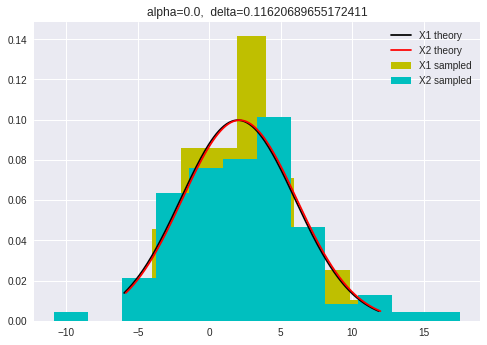


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2447.0, pvalue=0.7885535816793301)


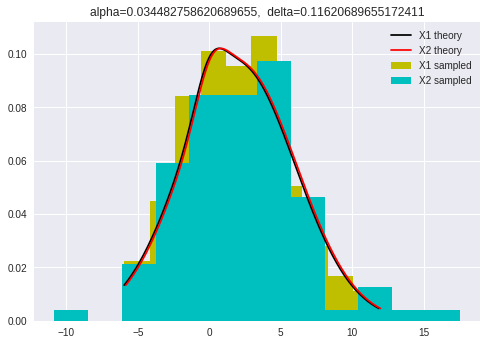


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2424.0, pvalue=0.7283878786577169)


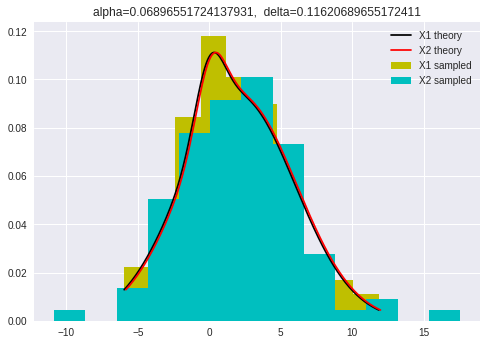


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2414.0, pvalue=0.7027179816787763)


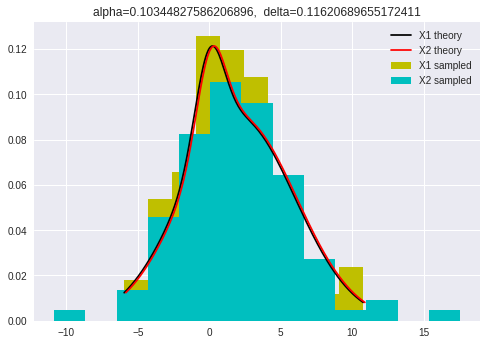


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2417.0, pvalue=0.7103849915044168)


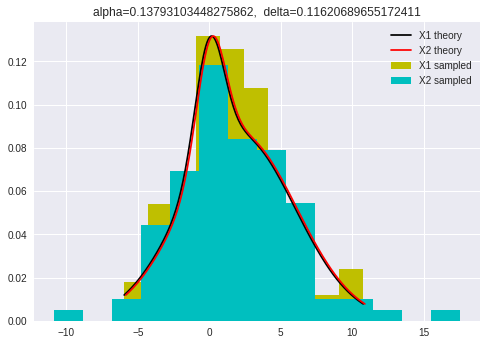


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2451.0, pvalue=0.7991587121799286)


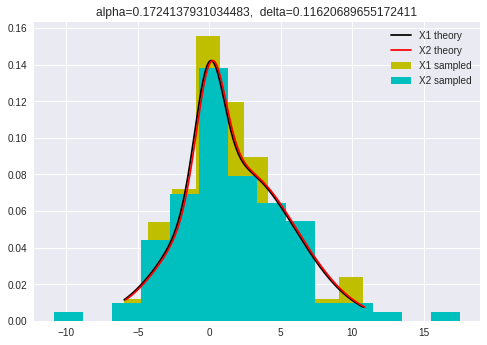


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2440.0, pvalue=0.7700896655852555)


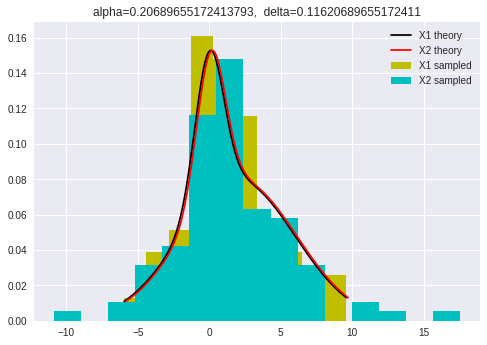


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2413.0, pvalue=0.7001689715399704)


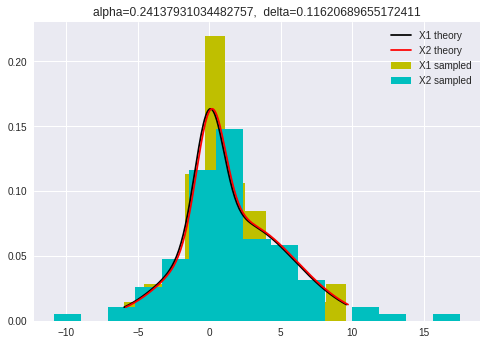


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2456.0, pvalue=0.8124671821144986)


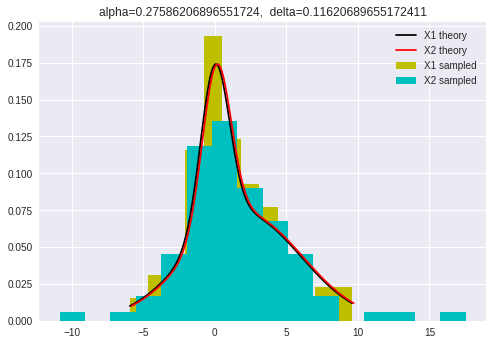


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2508.0, pvalue=0.9533889759974613)


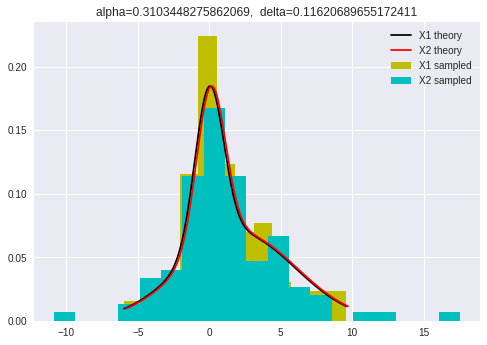


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2476.0, pvalue=0.8662073147584464)


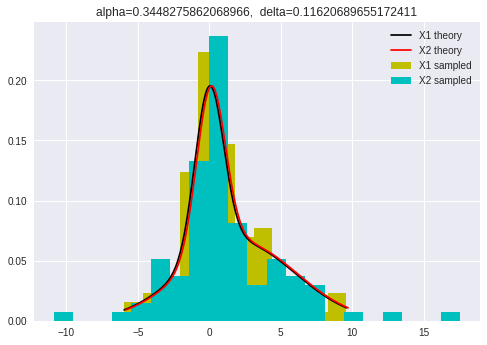


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


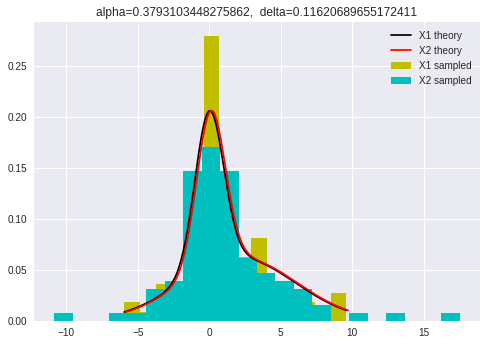


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2426.0, pvalue=0.7335597164128502)


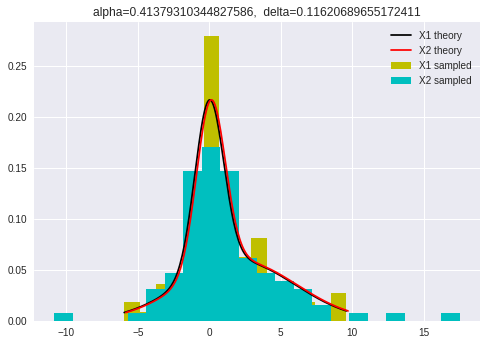


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


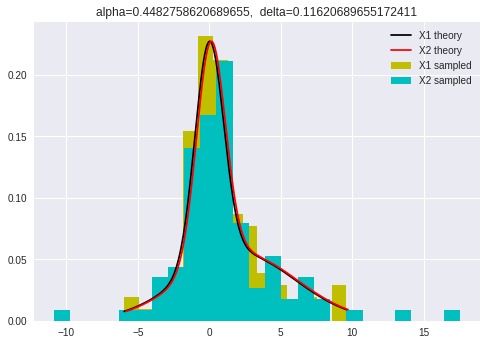


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2459.0, pvalue=0.8204786096104631)


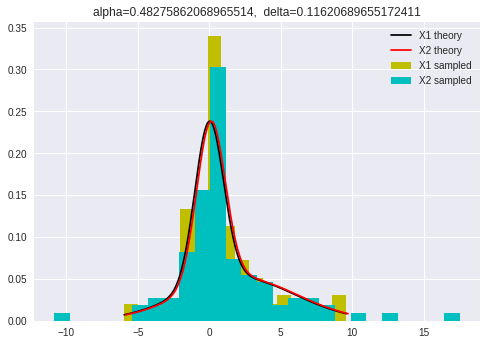


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2475.0, pvalue=0.8635033772834252)


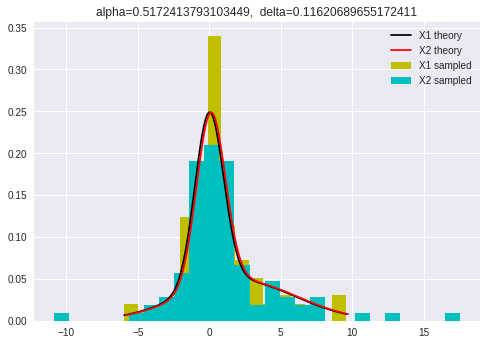


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2414.0, pvalue=0.7027179816787763)


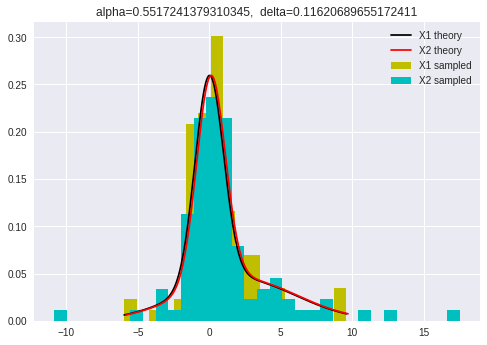


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2434.0, pvalue=0.7543660885045383)


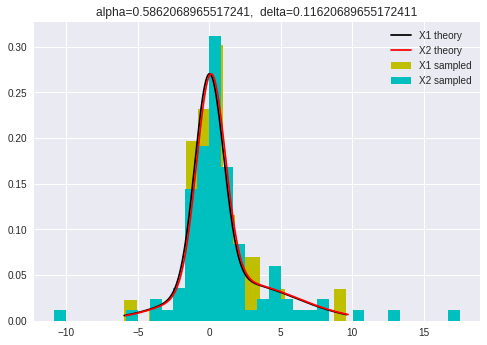


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


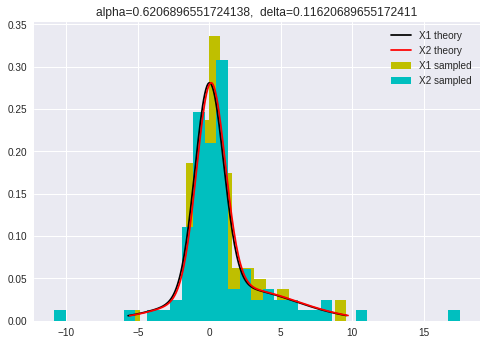


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2401.0, pvalue=0.6698511676891292)


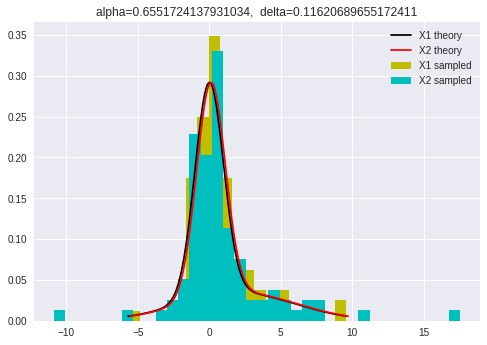


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2371.0, pvalue=0.5964572394238804)


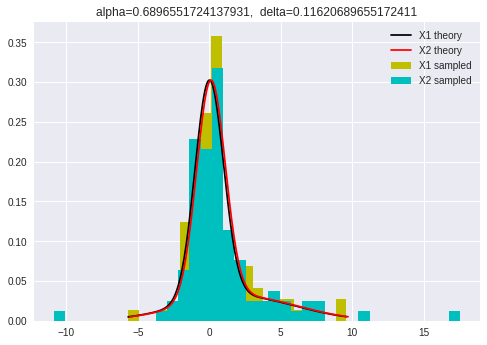


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2357.0, pvalue=0.5635081585027861)


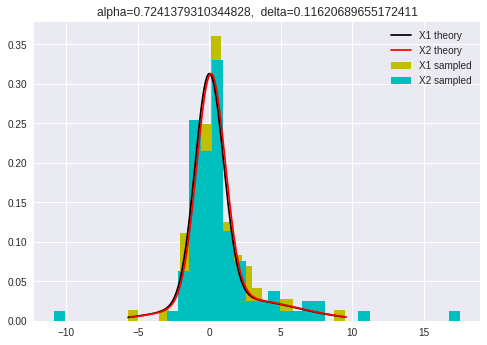


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2358.0, pvalue=0.5658323009305045)


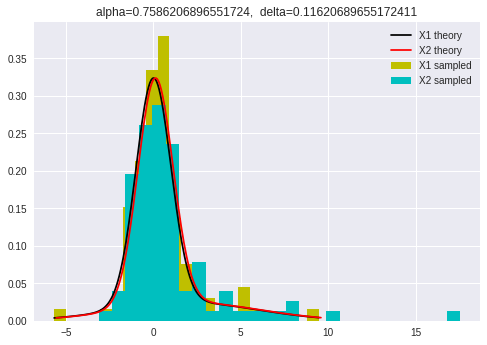


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2384.0, pvalue=0.6278155248427884)


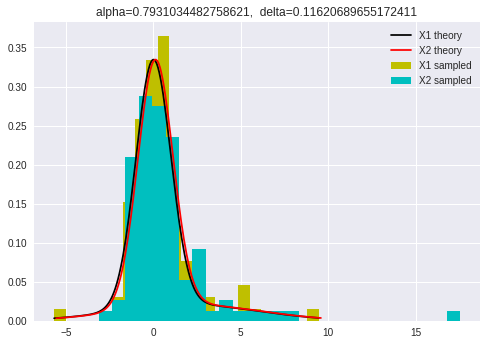


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


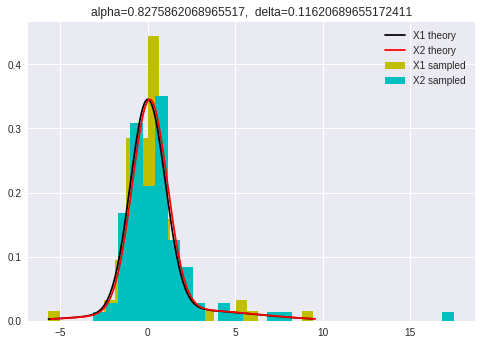


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2396.0, pvalue=0.6573723697180689)


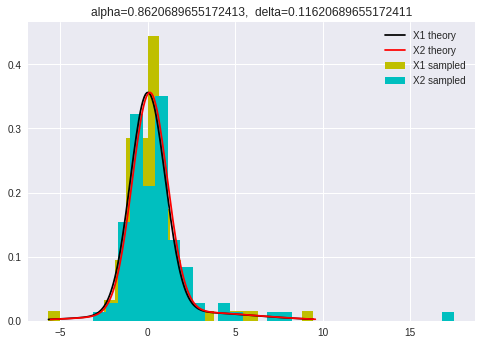


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2381.0, pvalue=0.6205162798090659)


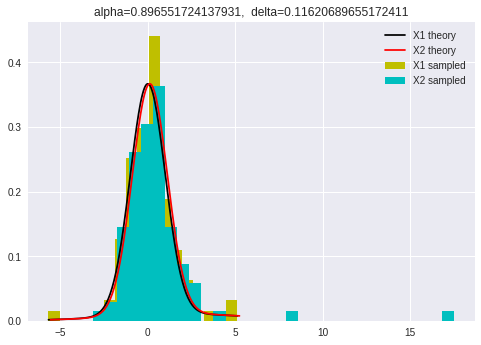


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2355.0, pvalue=0.5588737261094053)


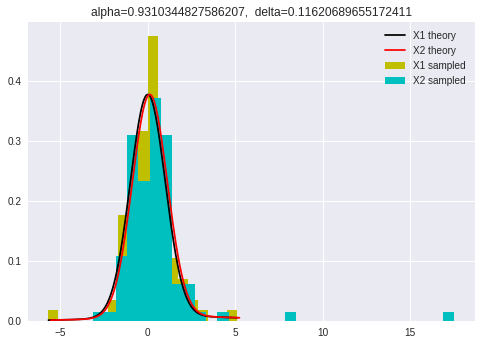


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2332.0, pvalue=0.506948473287772)


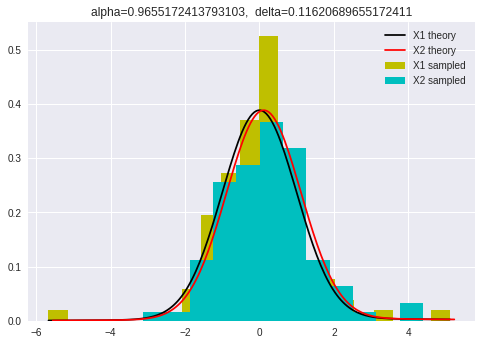


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2295.0, pvalue=0.42905212231325207)


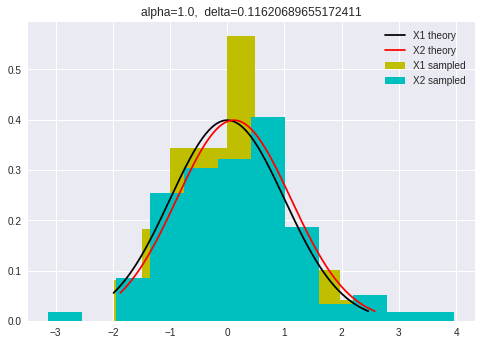

 77%|███████▋  | 23/30 [03:10<00:57,  8.23s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2472.0, pvalue=0.8554012757415651)


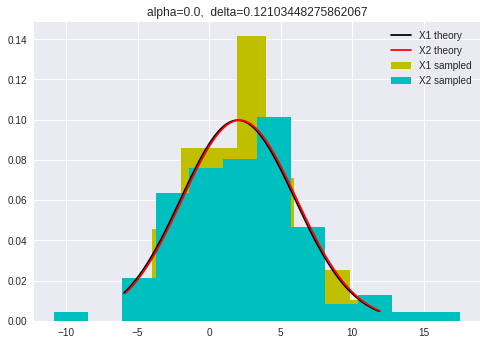


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2440.0, pvalue=0.7700896655852555)


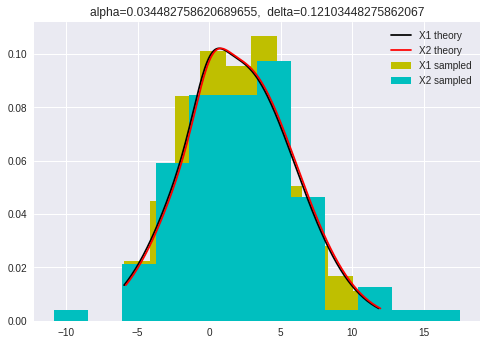


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2418.0, pvalue=0.7129472348148089)


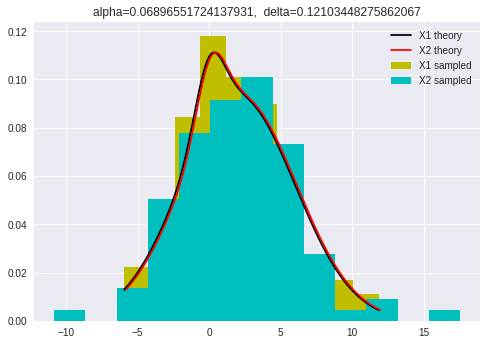


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2408.0, pvalue=0.687475023529822)


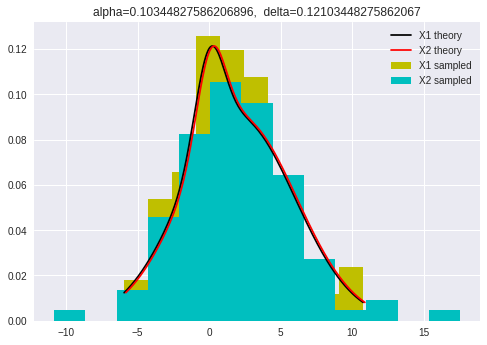


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2411.0, pvalue=0.695081095368113)


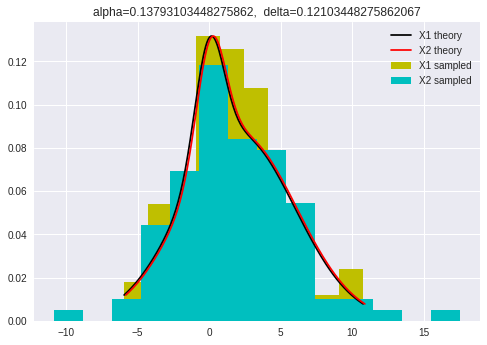


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2446.0, pvalue=0.7859083271789165)


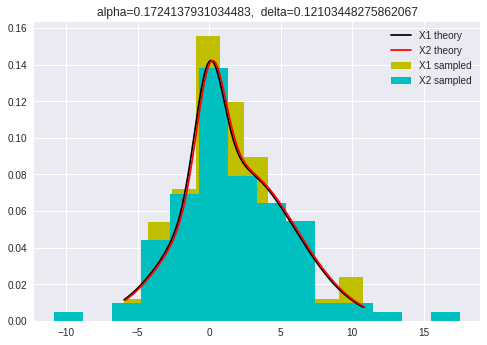


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2436.0, pvalue=0.7595963382015569)


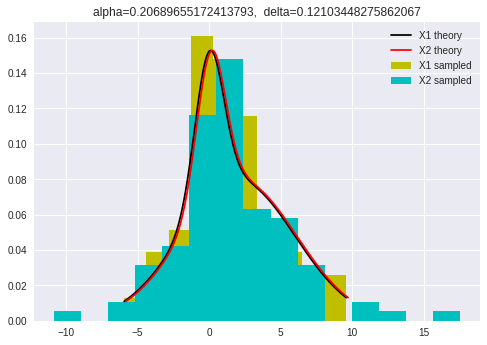


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2409.0, pvalue=0.6900069147093293)


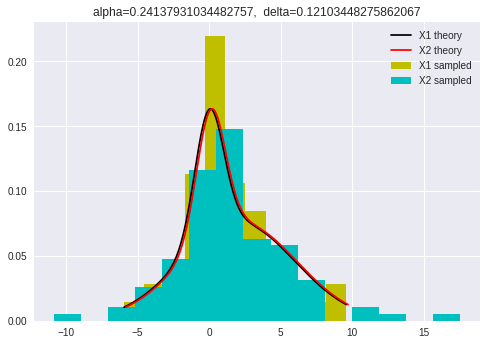


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2452.0, pvalue=0.8018158769149264)


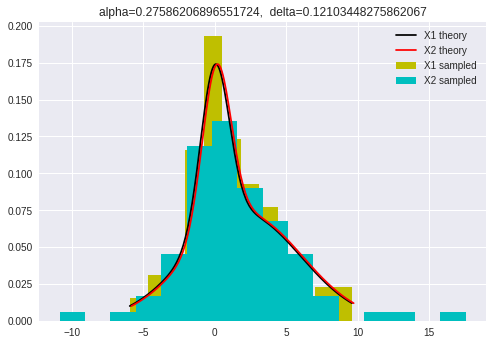


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2504.0, pvalue=0.9424389080177923)


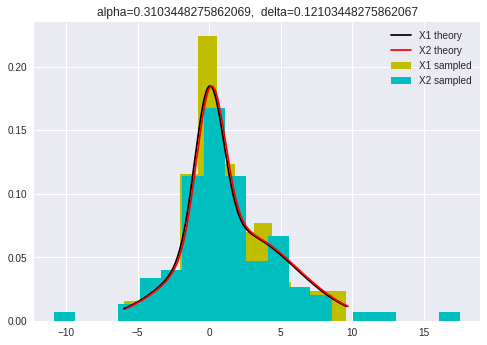


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2472.0, pvalue=0.8554012757415651)


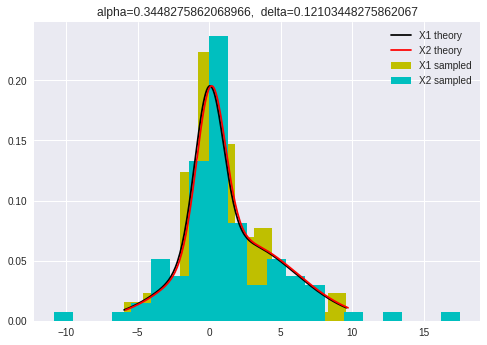


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2445.0, pvalue=0.7832655420427076)


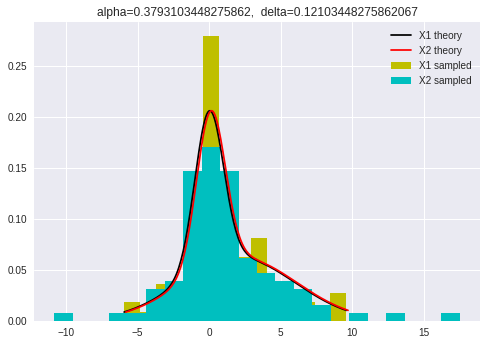


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2423.0, pvalue=0.7258065723197727)


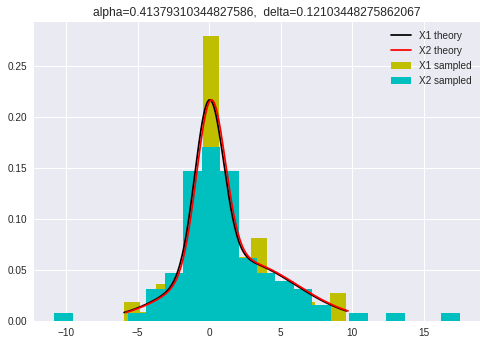


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2457.0, pvalue=0.8151355219610021)


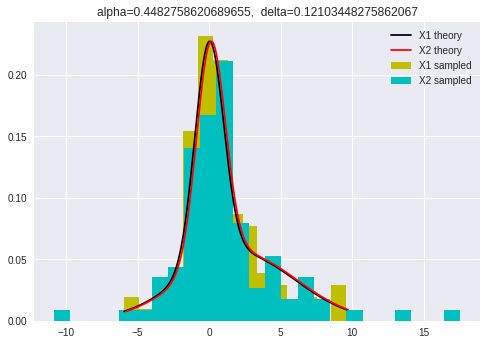


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


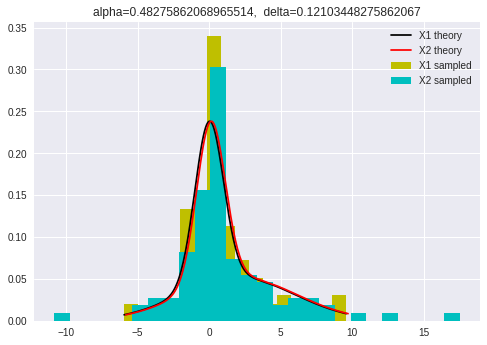


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2471.0, pvalue=0.8527039152769147)


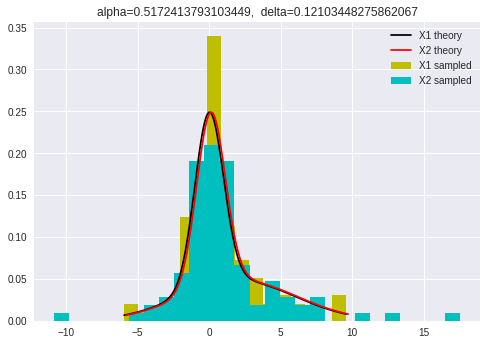


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2410.0, pvalue=0.6925422804041386)


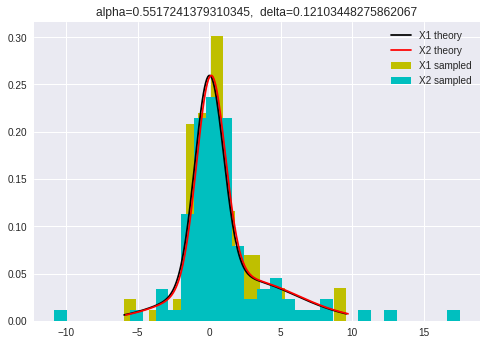


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


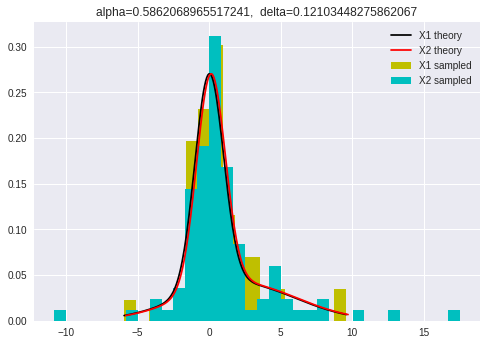


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2423.0, pvalue=0.7258065723197727)


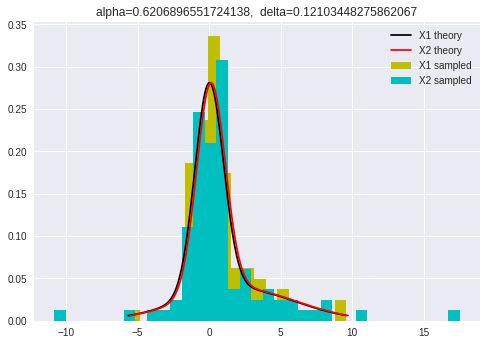


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2395.0, pvalue=0.6548878905640467)


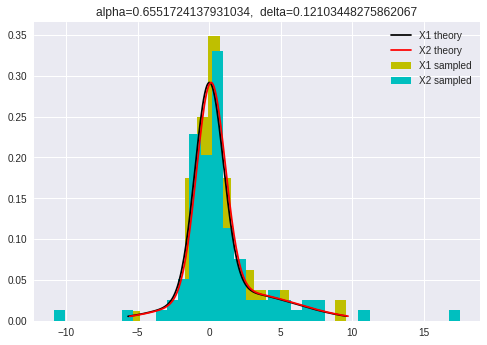


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2365.0, pvalue=0.5822288568473547)


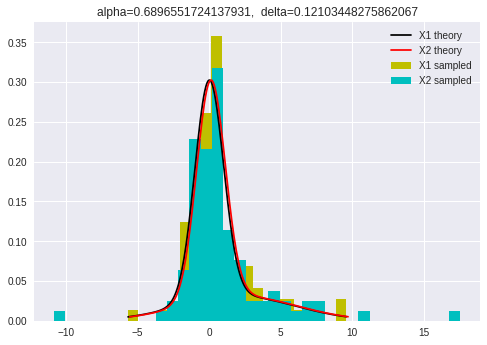


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2351.0, pvalue=0.5496607761509097)


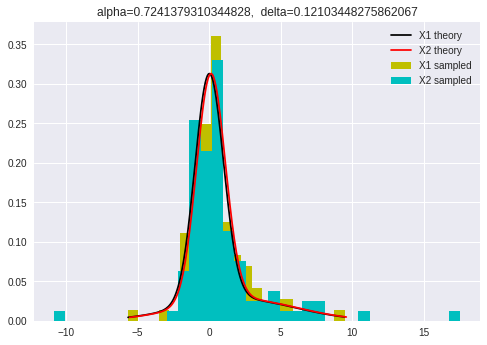


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2351.0, pvalue=0.5496607761509097)


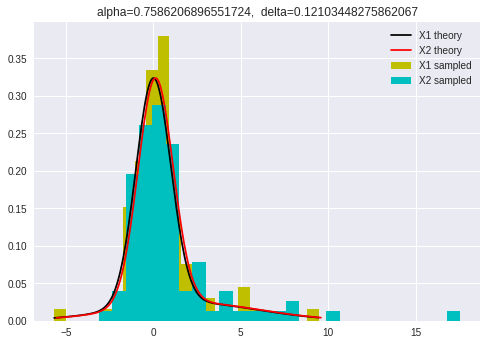


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2375.0, pvalue=0.6060299176865905)


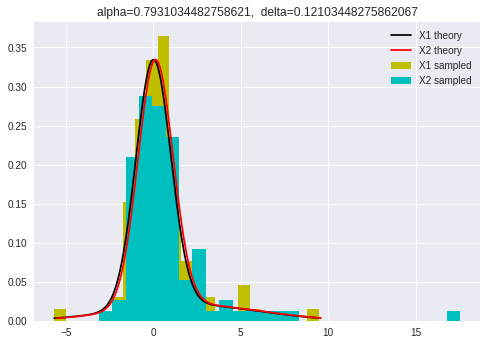


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2424.0, pvalue=0.7283878786577169)


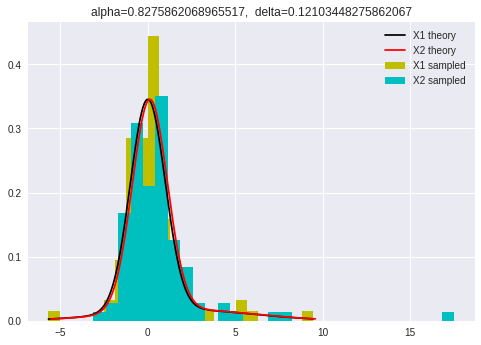


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2384.0, pvalue=0.6278155248427884)


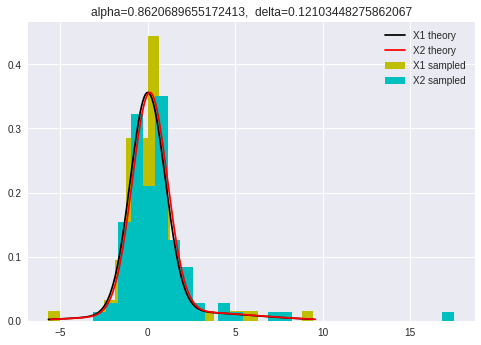


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2366.0, pvalue=0.5845892174029008)


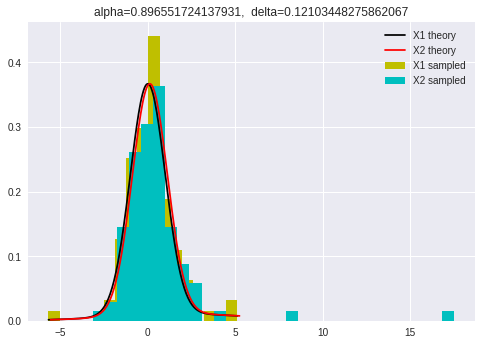


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2340.0, pvalue=0.5247177003787094)


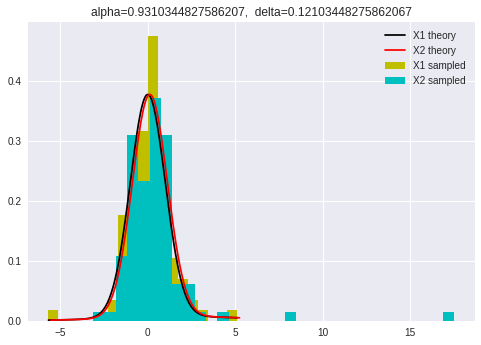


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2317.0, pvalue=0.4745030356140598)


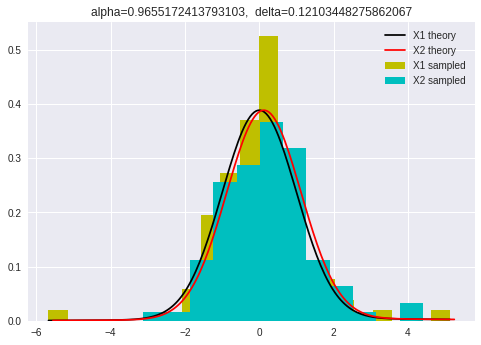


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2280.0, pvalue=0.3995699198907845)


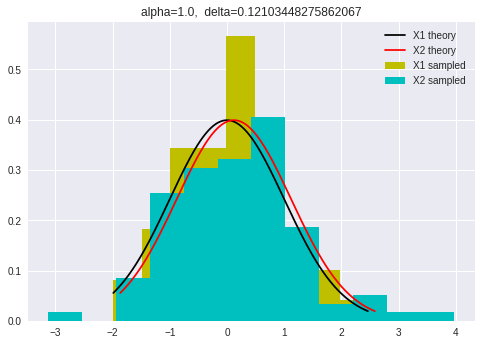

 80%|████████  | 24/30 [03:18<00:49,  8.25s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2470.0, pvalue=0.8500082762349129)


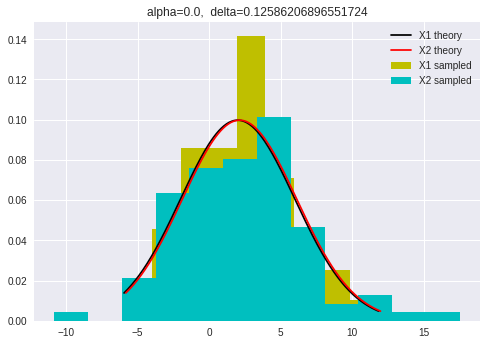


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2437.0, pvalue=0.7622156087305044)


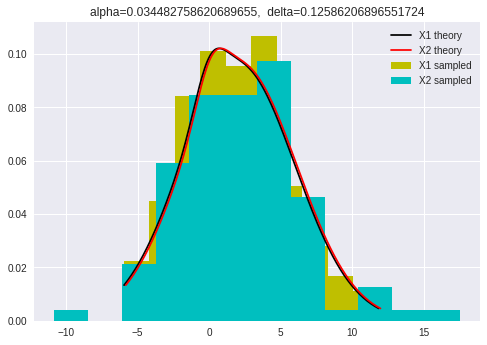


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2415.0, pvalue=0.7052703389500983)


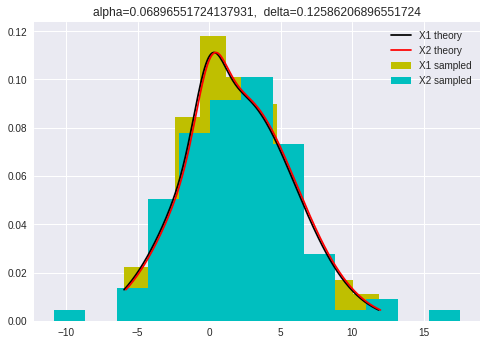


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2405.0, pvalue=0.6799004477897137)


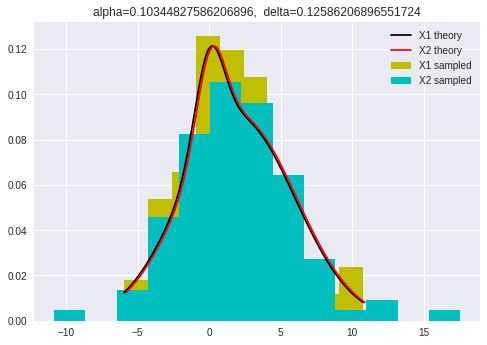


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2407.0, pvalue=0.6849466319950608)


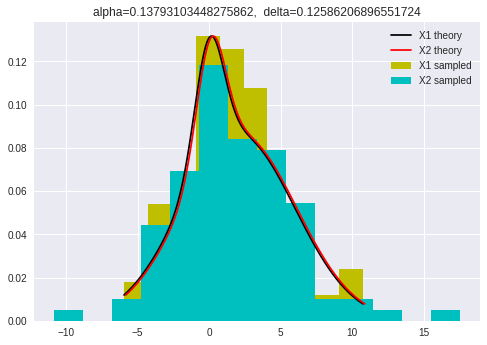


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


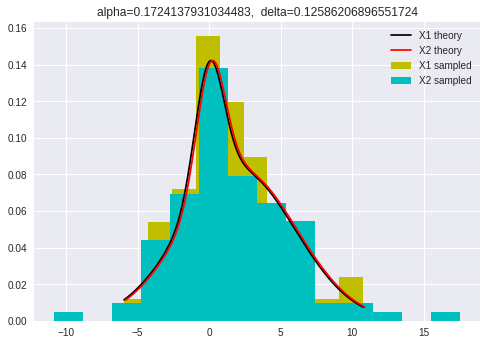


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


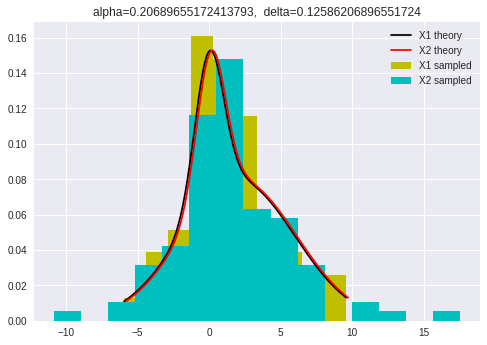


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2406.0, pvalue=0.6824217651170663)


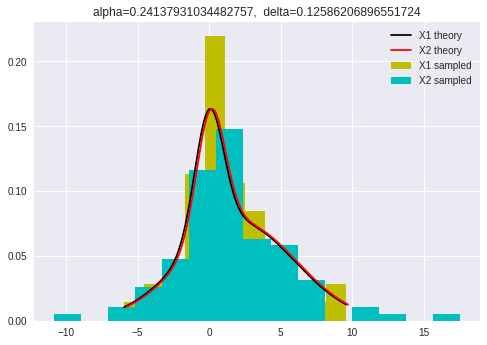


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


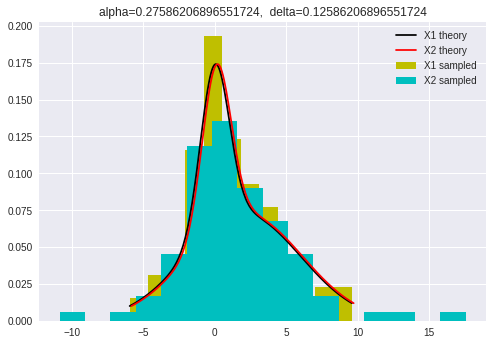


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2500.0, pvalue=0.9314997084840357)


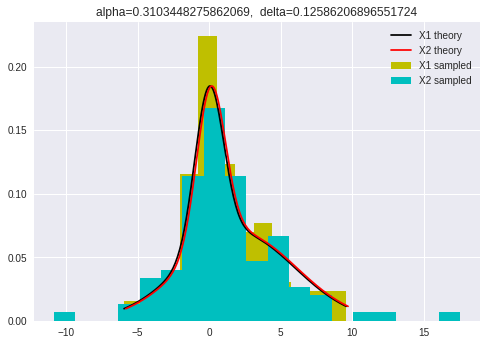


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2467.0, pvalue=0.8419319948258008)


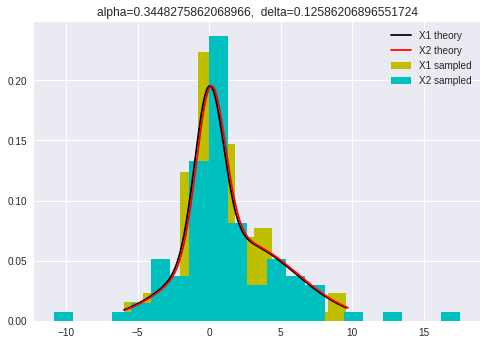


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2442.0, pvalue=0.7753522914731348)


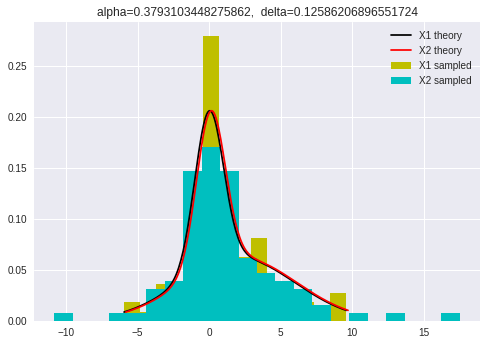


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2420.0, pvalue=0.7180814247397251)


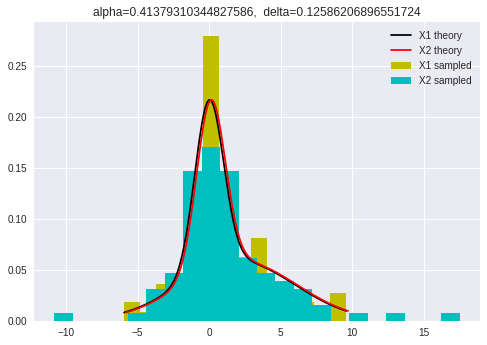


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2453.0, pvalue=0.8044753358016482)


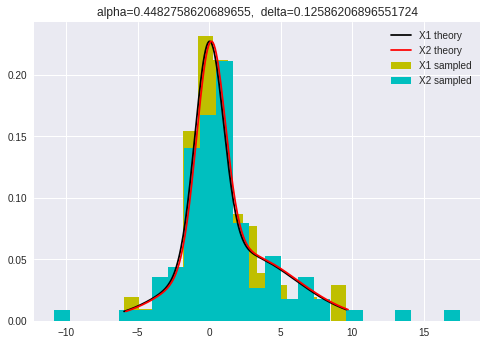


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2451.0, pvalue=0.7991587121799286)


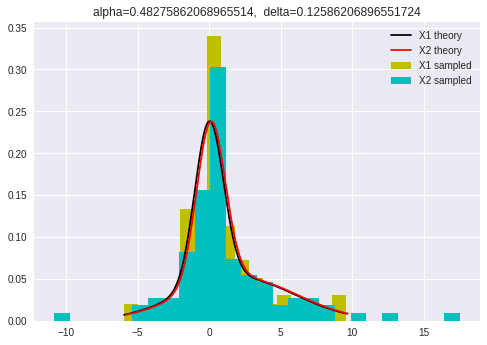


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2467.0, pvalue=0.8419319948258008)


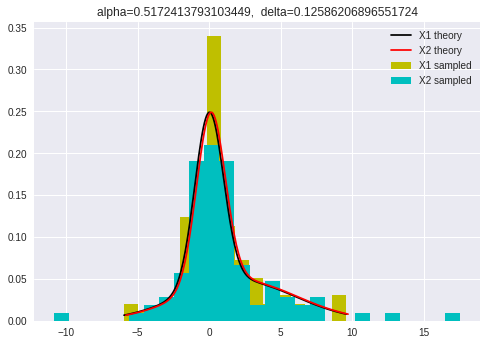


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2404.0, pvalue=0.6773827047880141)


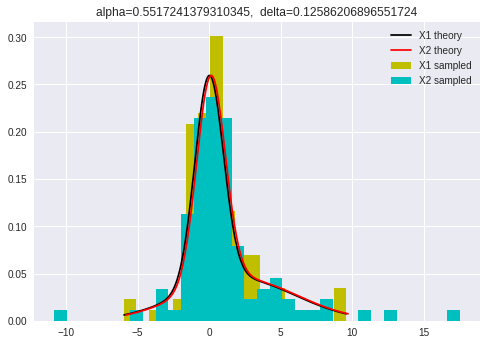


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2423.0, pvalue=0.7258065723197727)


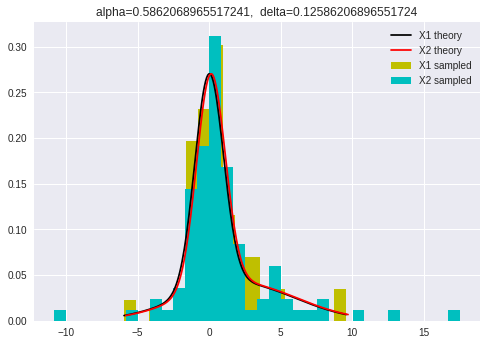


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2416.0, pvalue=0.7078260175355122)


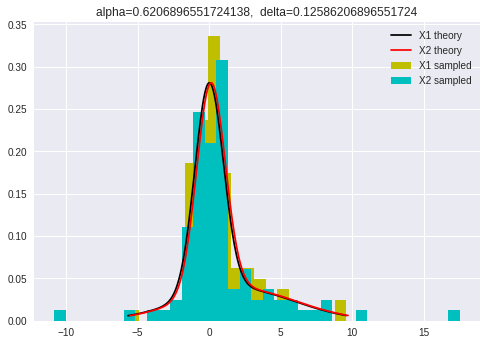


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2388.0, pvalue=0.6376046699936373)


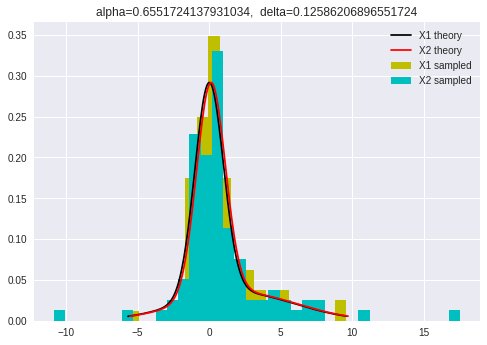


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2357.0, pvalue=0.5635081585027861)


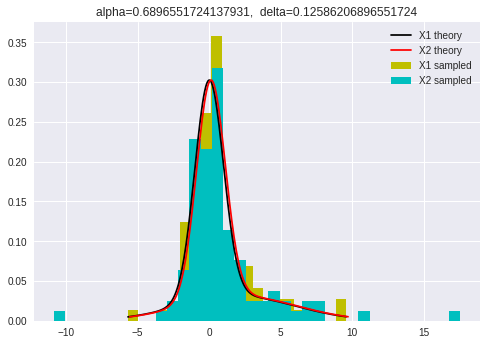


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2342.0, pvalue=0.5292093269572754)


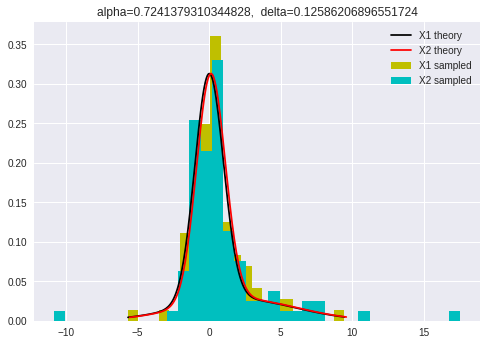


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2342.0, pvalue=0.5292093269572754)


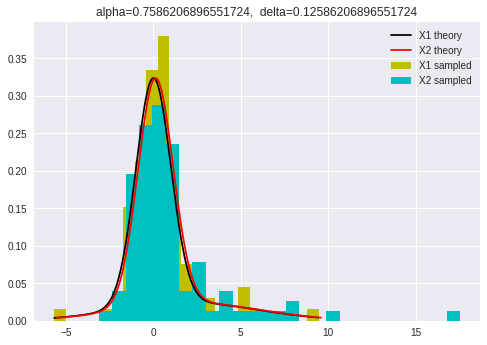


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2366.0, pvalue=0.5845892174029008)


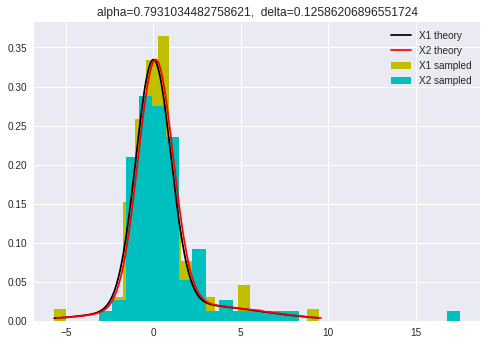


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2414.0, pvalue=0.7027179816787763)


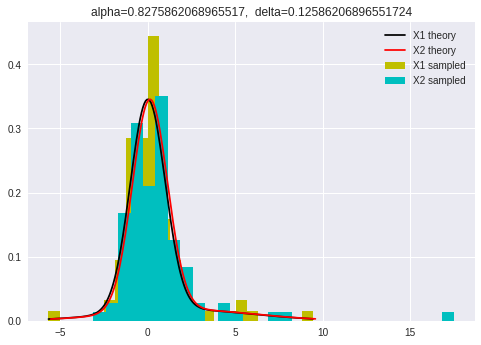


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2374.0, pvalue=0.603630307822939)


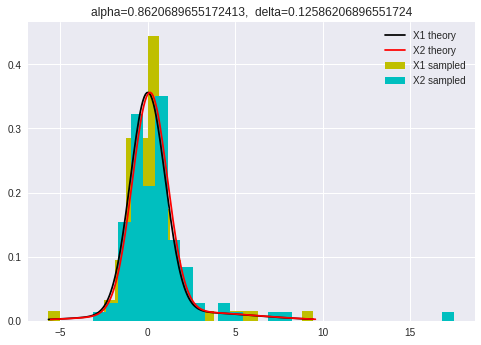


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2356.0, pvalue=0.5611886274899517)


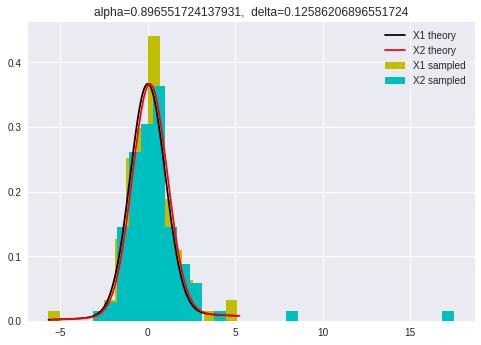


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2330.0, pvalue=0.5025560930996884)


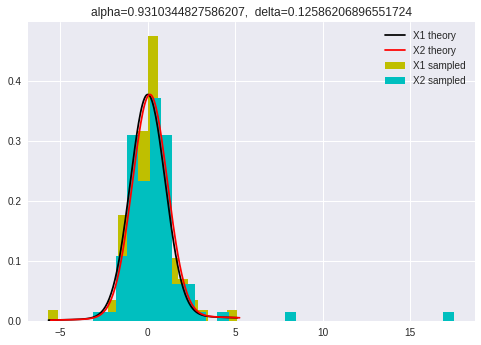


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2305.0, pvalue=0.44939054842060555)


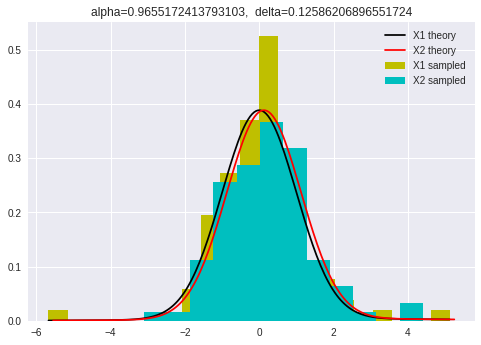


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2269.0, pvalue=0.37874492892909406)


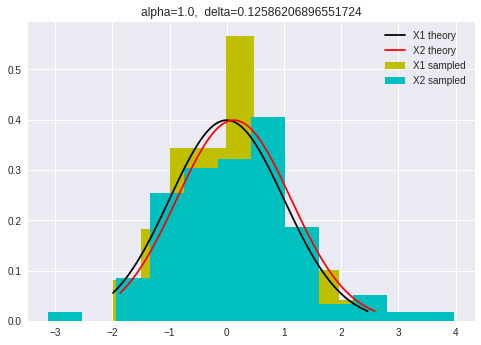

 83%|████████▎ | 25/30 [03:27<00:41,  8.22s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2466.0, pvalue=0.8392435483441993)


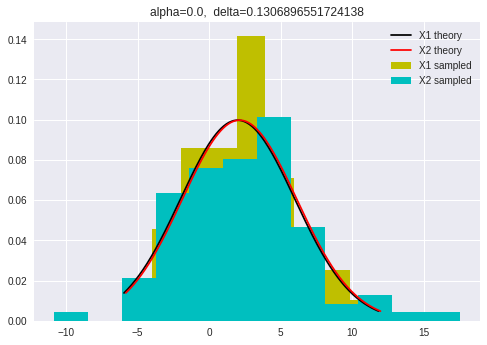


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


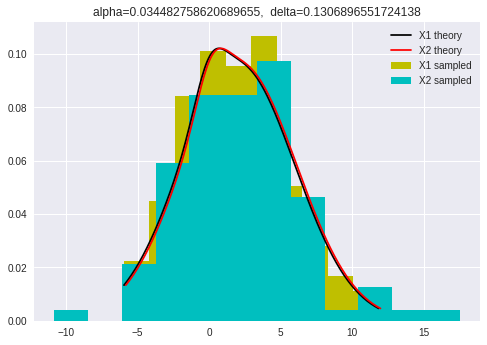


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2411.0, pvalue=0.695081095368113)


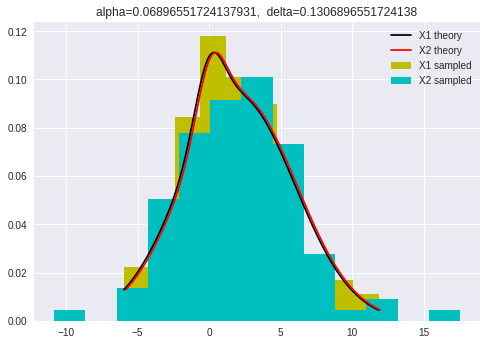


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2401.0, pvalue=0.6698511676891292)


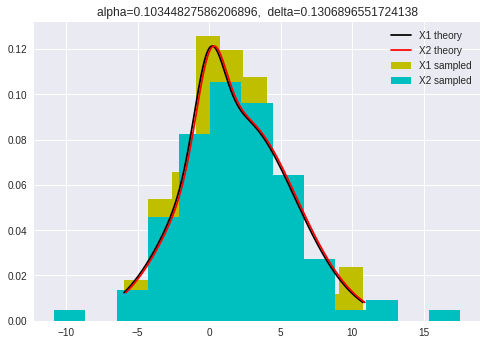


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2403.0, pvalue=0.6748685607674054)


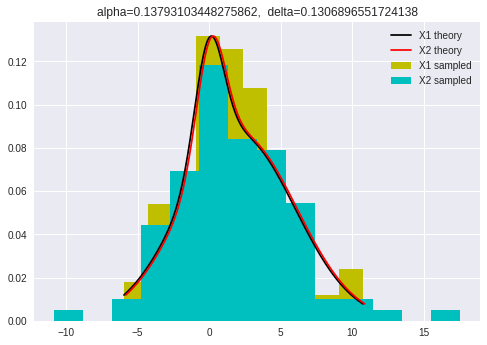


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2440.0, pvalue=0.7700896655852555)


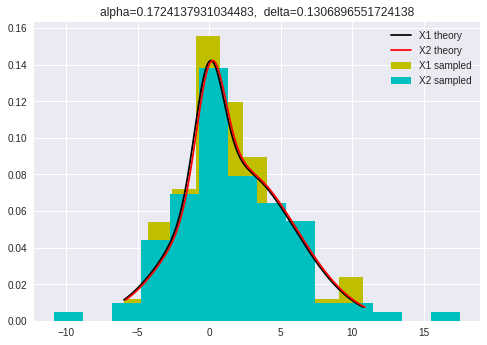


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2430.0, pvalue=0.7439395352842529)


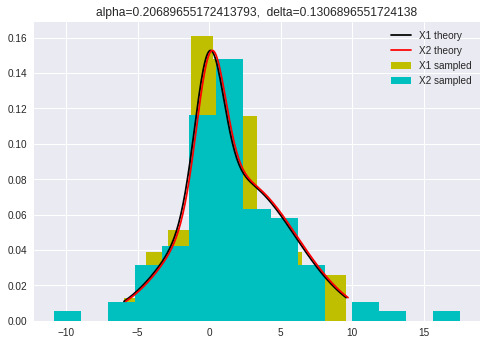


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2403.0, pvalue=0.6748685607674054)


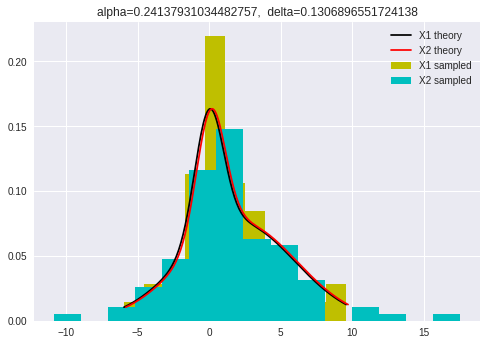


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2446.0, pvalue=0.7859083271789165)


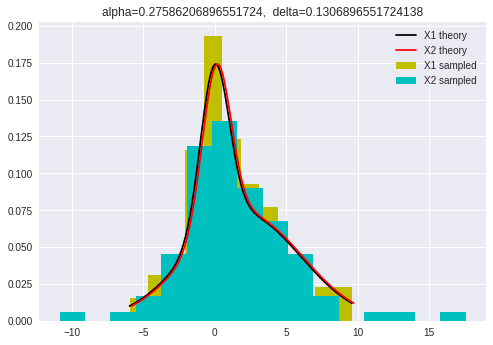


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2498.0, pvalue=0.9260348271927795)


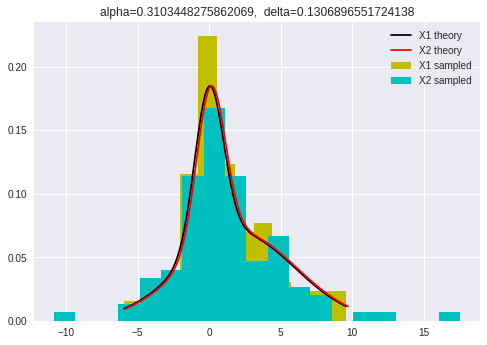


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2464.0, pvalue=0.8338723094405576)


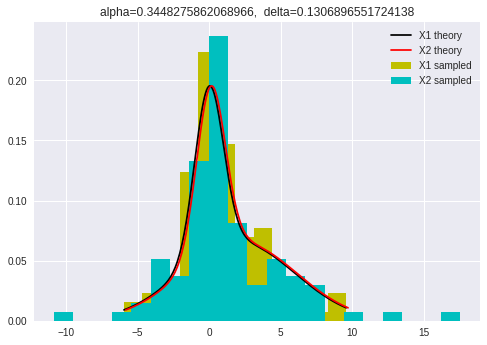


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


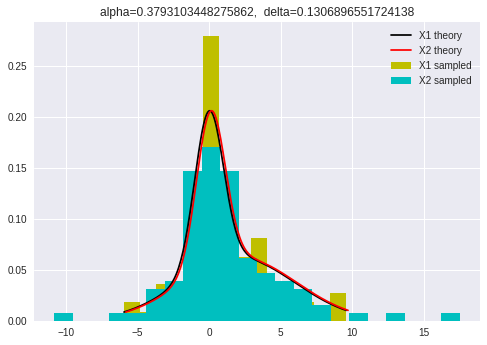


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2417.0, pvalue=0.7103849915044168)


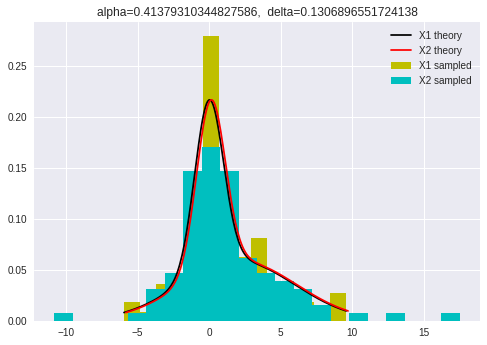


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2449.0, pvalue=0.7938513827119553)


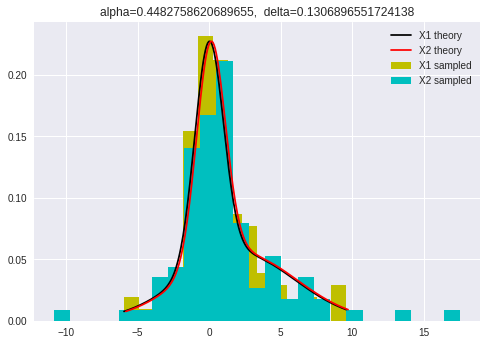


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2446.0, pvalue=0.7859083271789165)


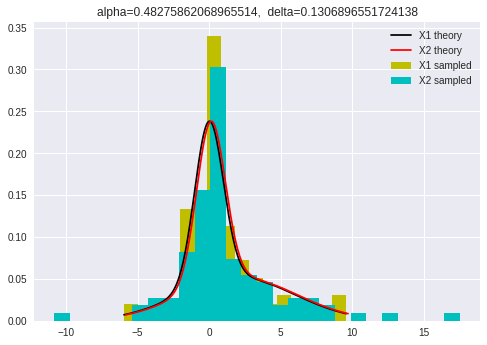


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2462.0, pvalue=0.8285088118253296)


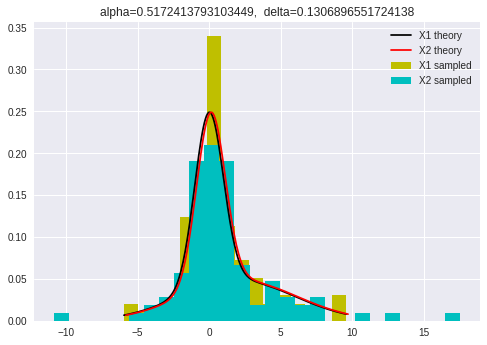


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


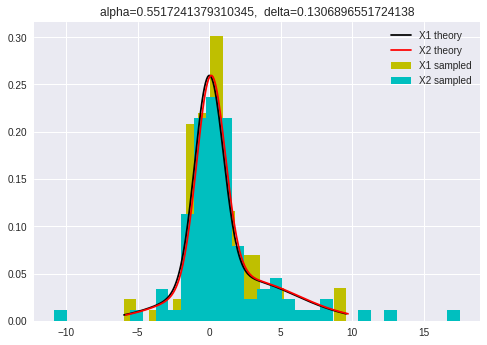


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2418.0, pvalue=0.7129472348148089)


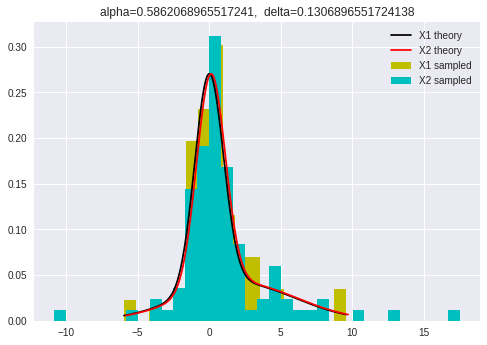


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2411.0, pvalue=0.695081095368113)


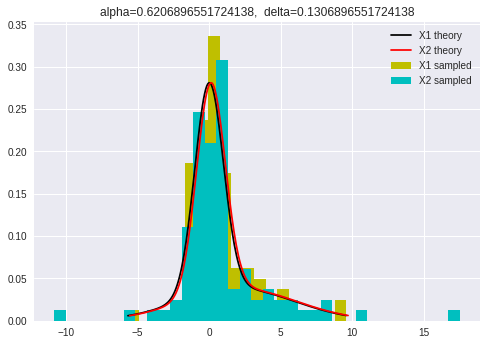


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2383.0, pvalue=0.6253783479405848)


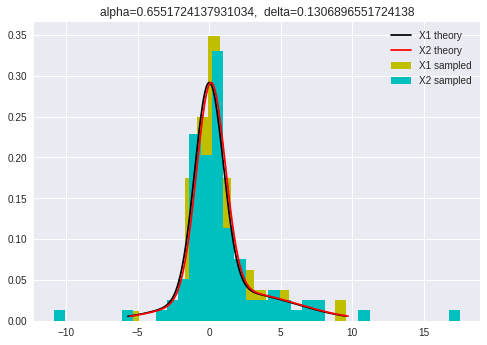


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2352.0, pvalue=0.5519569797477354)


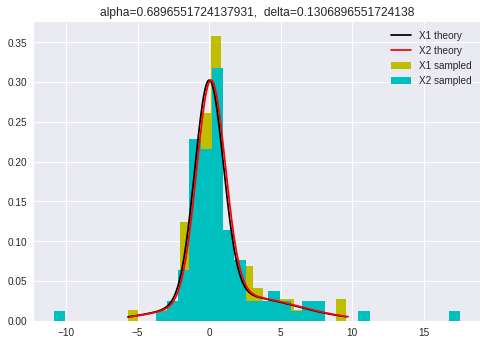


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2337.0, pvalue=0.5180170574396306)


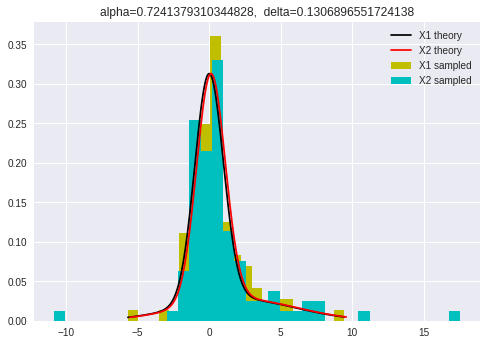


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2337.0, pvalue=0.5180170574396306)


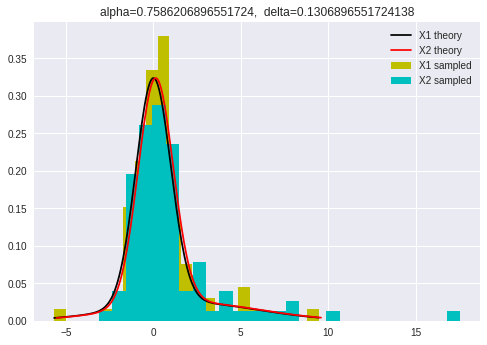


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2358.0, pvalue=0.5658323009305045)


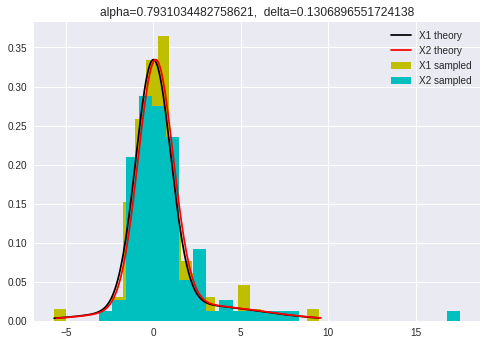


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2404.0, pvalue=0.6773827047880141)


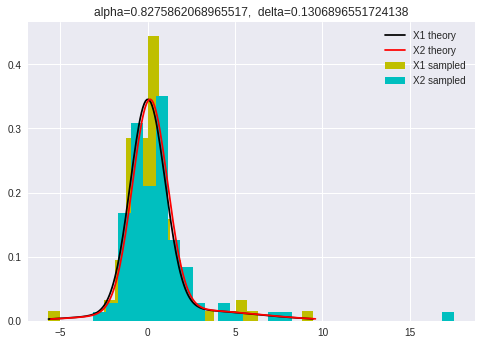


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2363.0, pvalue=0.5775215365287132)


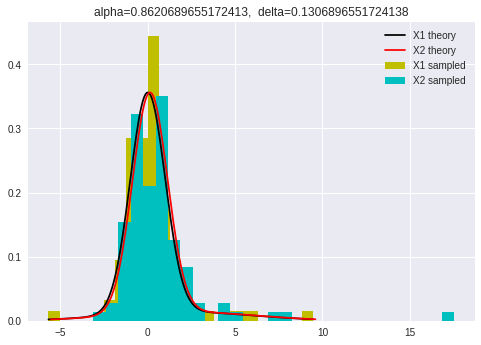


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2343.0, pvalue=0.5314624520873817)


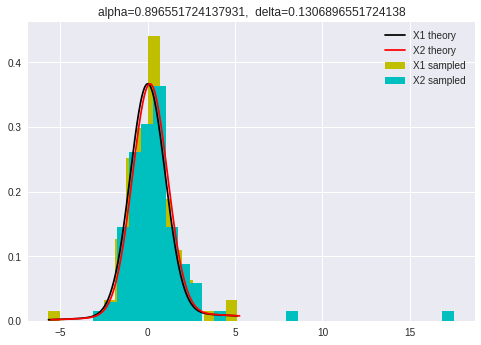


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2318.0, pvalue=0.47662997837909227)


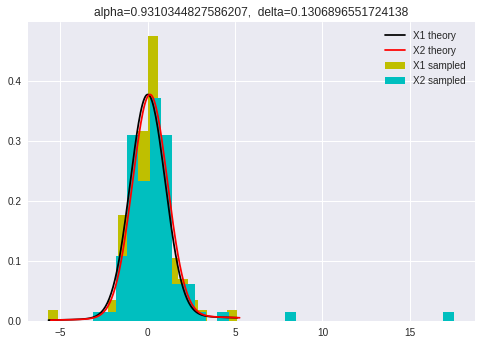


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2293.0, pvalue=0.4250496167958784)


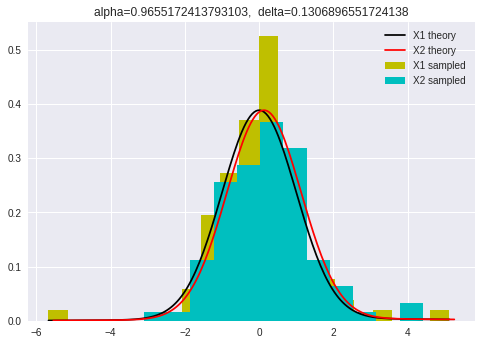


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2256.0, pvalue=0.35501304550262447)


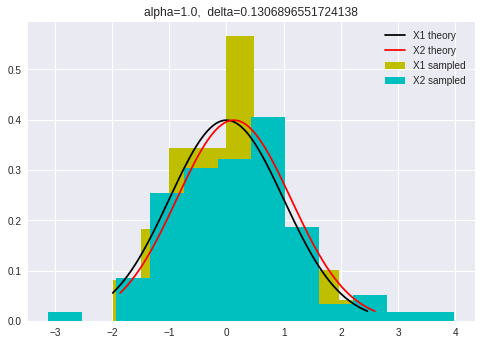

 87%|████████▋ | 26/30 [03:35<00:33,  8.27s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2466.0, pvalue=0.8392435483441993)


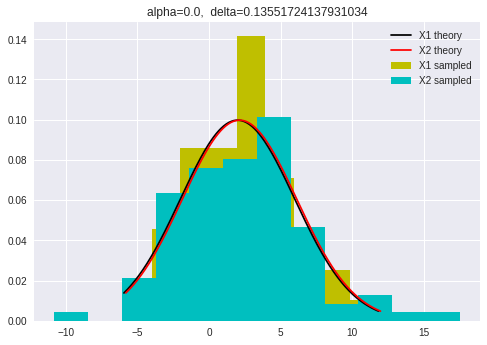


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


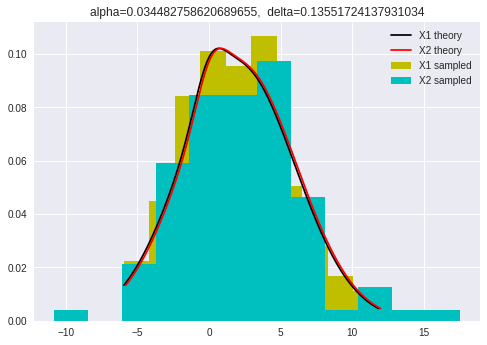


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2410.0, pvalue=0.6925422804041386)


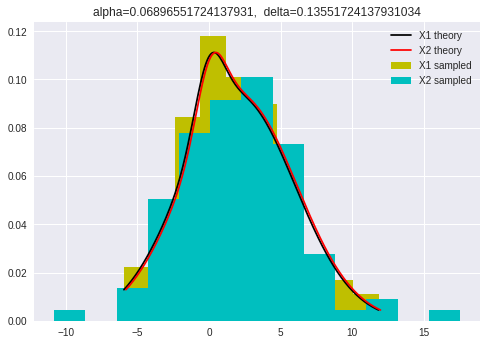


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2400.0, pvalue=0.6673479673381713)


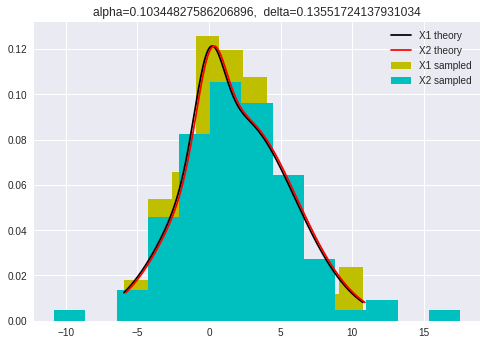


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2401.0, pvalue=0.6698511676891292)


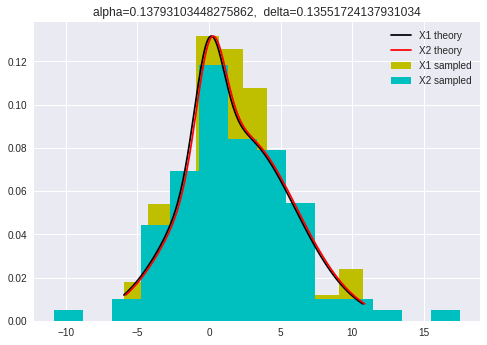


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2438.0, pvalue=0.7648376056140332)


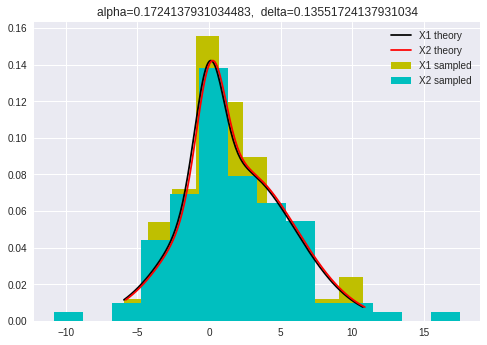


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2428.0, pvalue=0.7387436743898753)


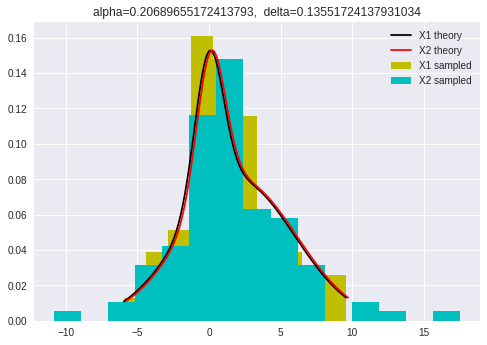


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2401.0, pvalue=0.6698511676891292)


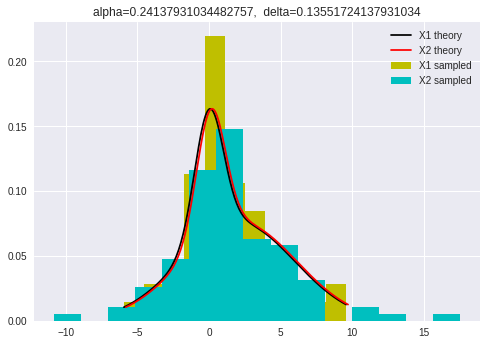


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


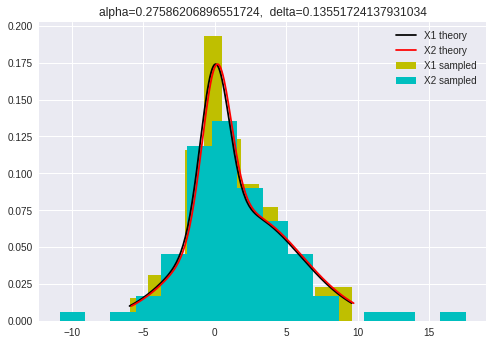


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2495.0, pvalue=0.9178441245028052)


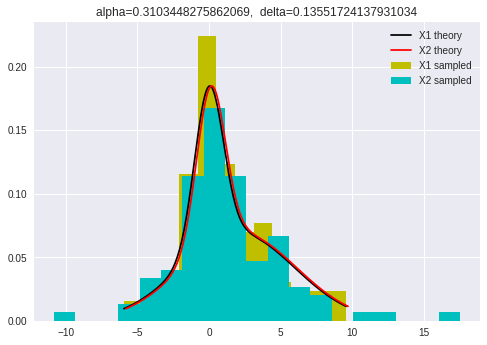


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2461.0, pvalue=0.8258300417006286)


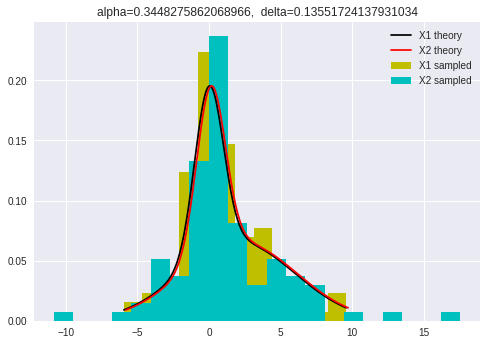


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2436.0, pvalue=0.7595963382015569)


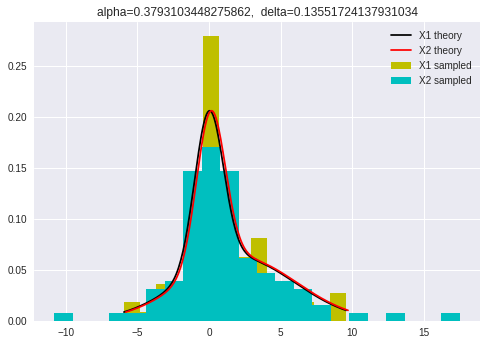


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2414.0, pvalue=0.7027179816787763)


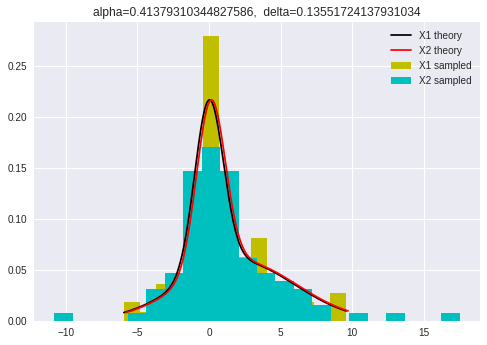


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2446.0, pvalue=0.7859083271789165)


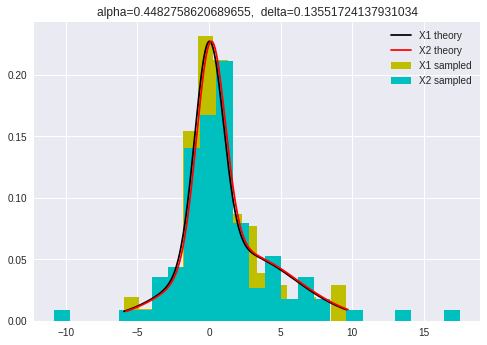


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


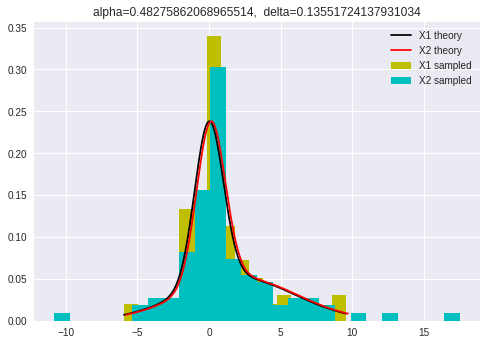


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2459.0, pvalue=0.8204786096104631)


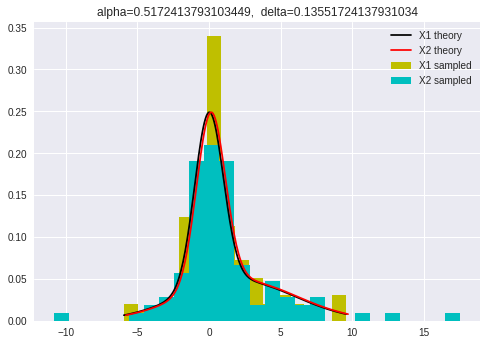


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2396.0, pvalue=0.6573723697180689)


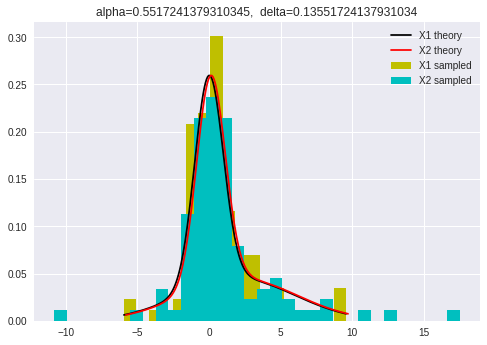


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2415.0, pvalue=0.7052703389500983)


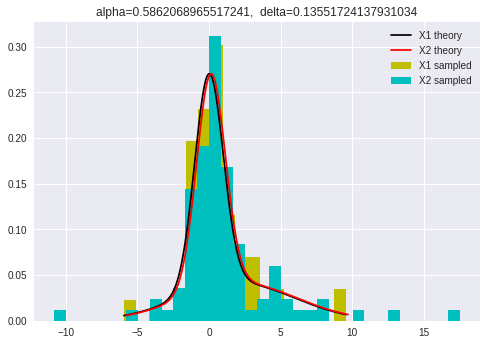


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2405.0, pvalue=0.6799004477897137)


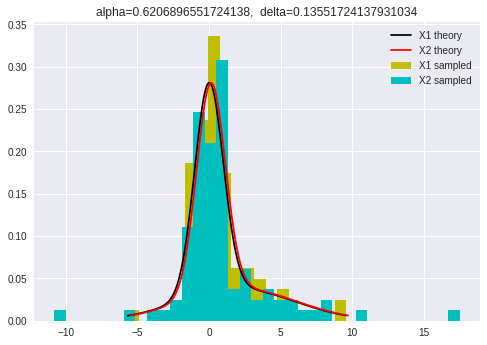


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2376.0, pvalue=0.6084337865773708)


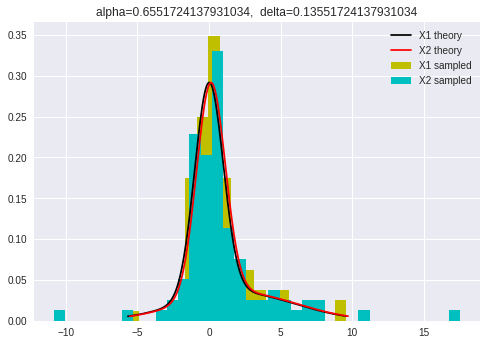


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2346.0, pvalue=0.5382508806114013)


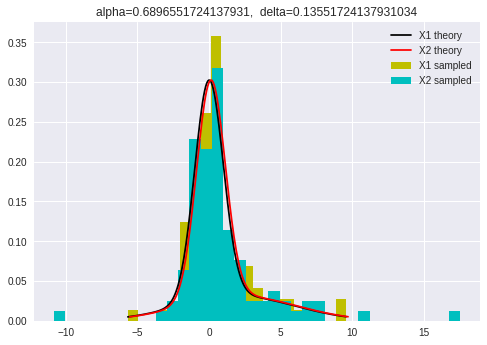


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2329.0, pvalue=0.500367472717453)


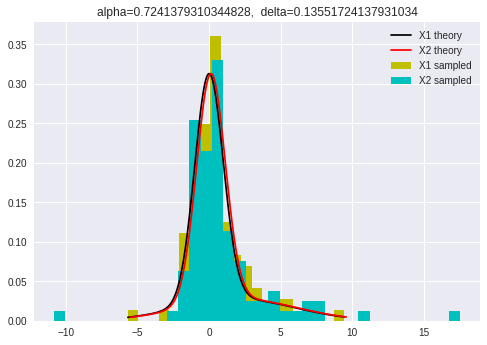


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2330.0, pvalue=0.5025560930996884)


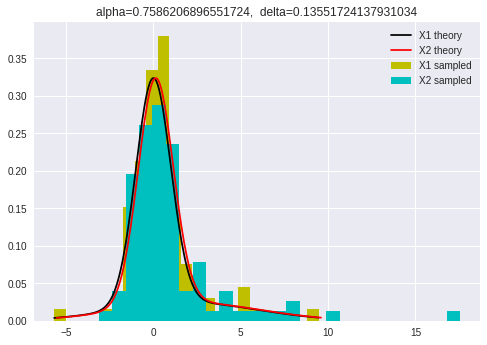


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2351.0, pvalue=0.5496607761509097)


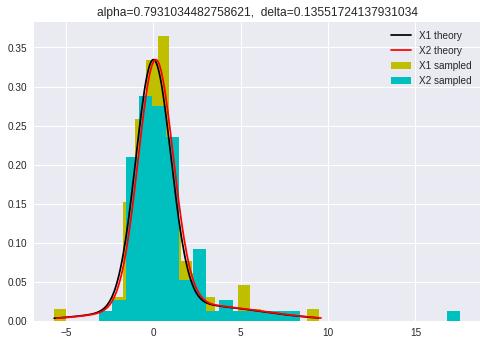


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2397.0, pvalue=0.6598606407090197)


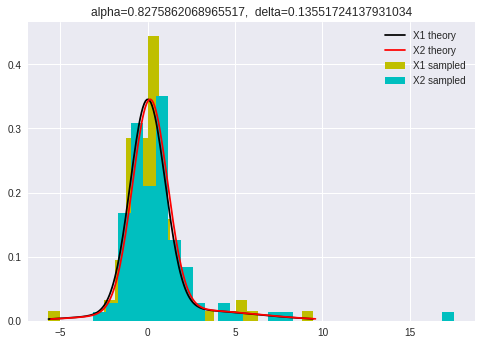


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2354.0, pvalue=0.5565634724328369)


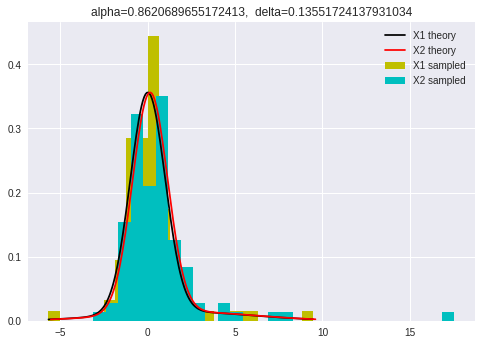


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2334.0, pvalue=0.511360943044574)


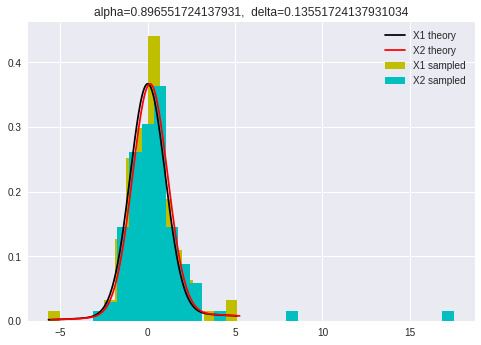


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2309.0, pvalue=0.4576765516449649)


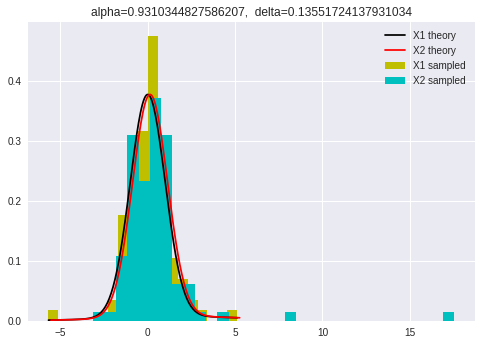


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2284.0, pvalue=0.407310248043495)


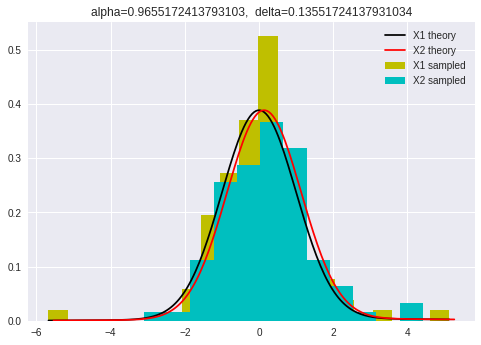


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2246.0, pvalue=0.3374113464376355)


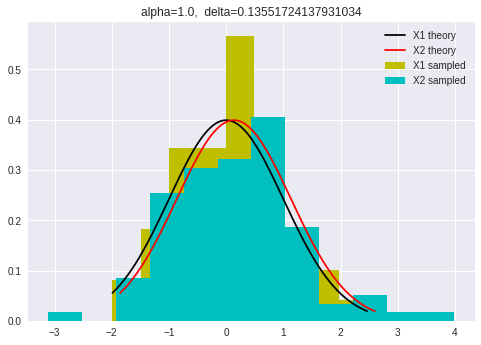

 90%|█████████ | 27/30 [03:43<00:24,  8.32s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2465.0, pvalue=0.8365569764052994)


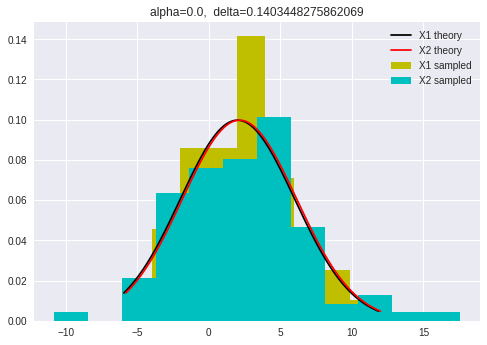


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2431.0, pvalue=0.7465418609724369)


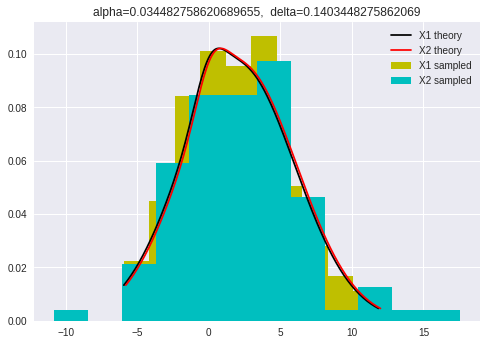


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2408.0, pvalue=0.687475023529822)


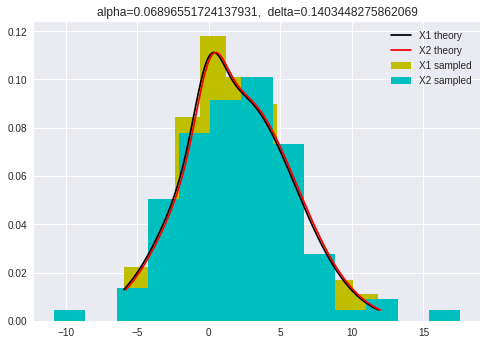


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2398.0, pvalue=0.6623526798628128)


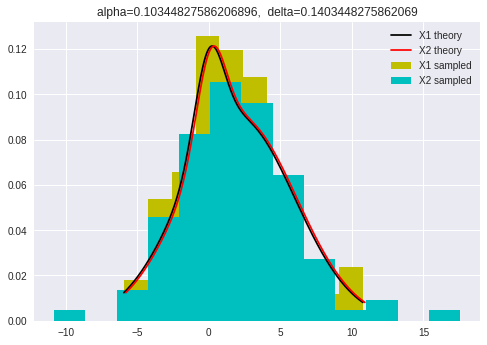


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


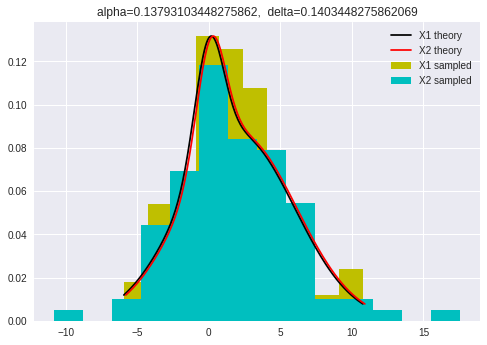


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2437.0, pvalue=0.7622156087305044)


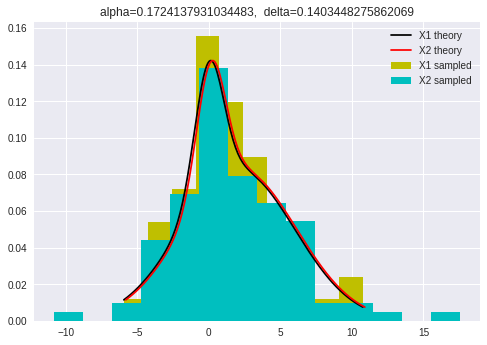


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2426.0, pvalue=0.7335597164128502)


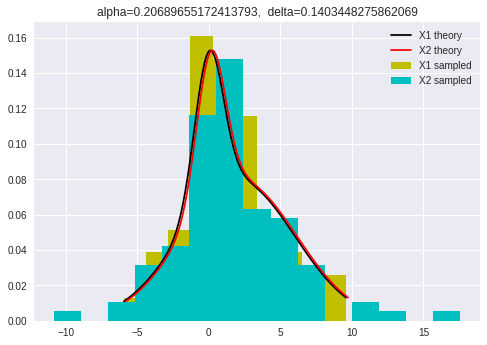


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


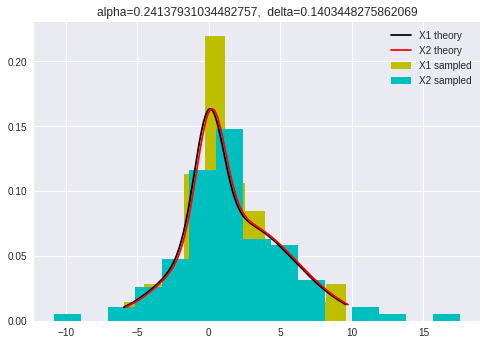


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2441.0, pvalue=0.7727196720119712)


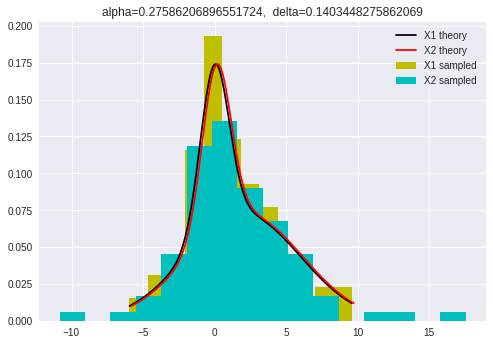


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2494.0, pvalue=0.9151157833041156)


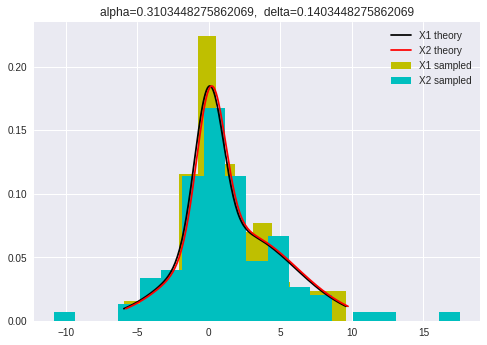


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2460.0, pvalue=0.8231532975996094)


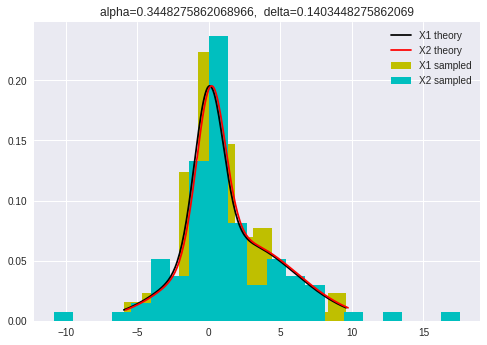


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


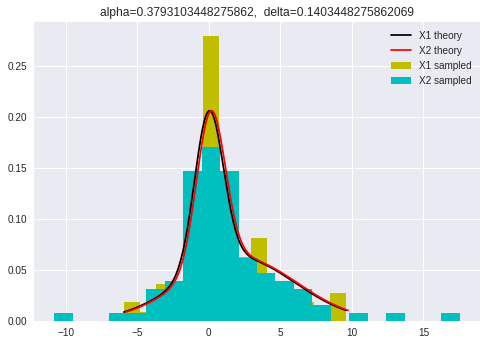


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2413.0, pvalue=0.7001689715399704)


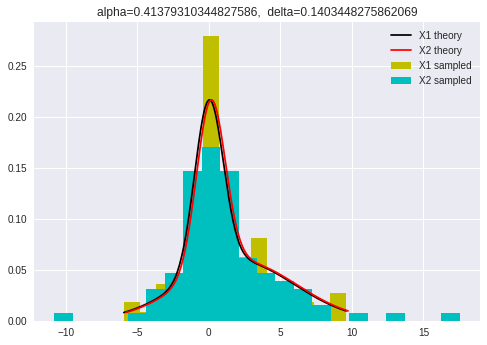


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2443.0, pvalue=0.7779874954111793)


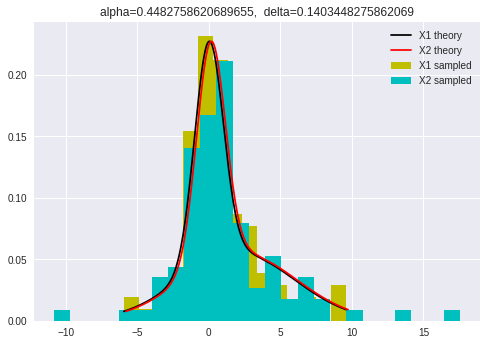


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2439.0, pvalue=0.7674623006604582)


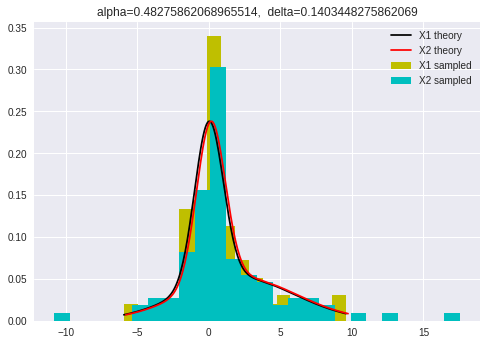


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


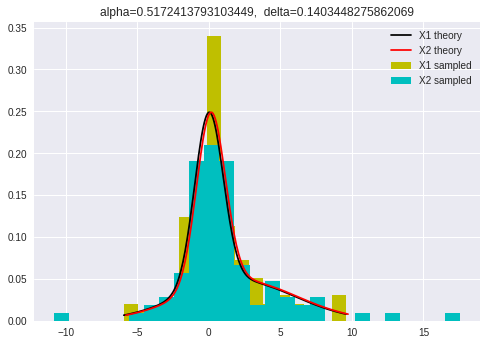


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2393.0, pvalue=0.6499304018341789)


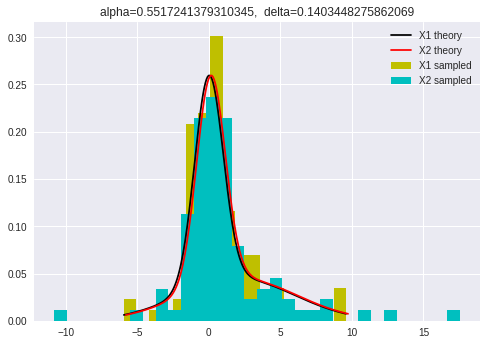


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2412.0, pvalue=0.6976233342391592)


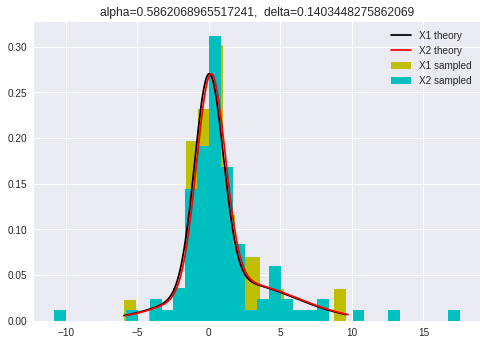


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2402.0, pvalue=0.6723580402630482)


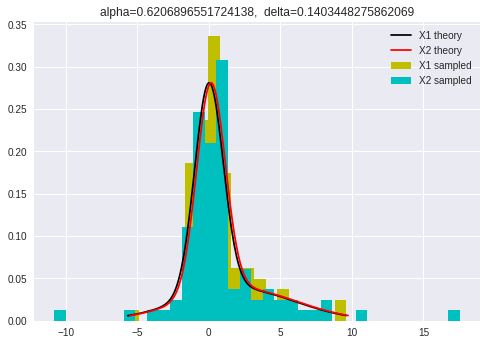


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2372.0, pvalue=0.5988439481270142)


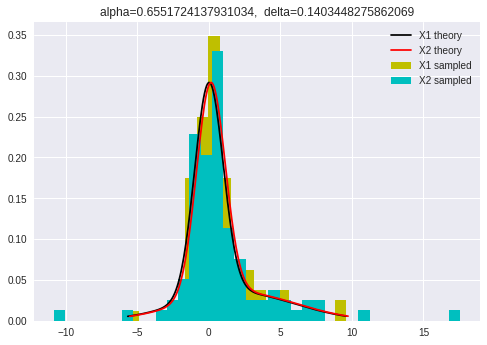


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2342.0, pvalue=0.5292093269572754)


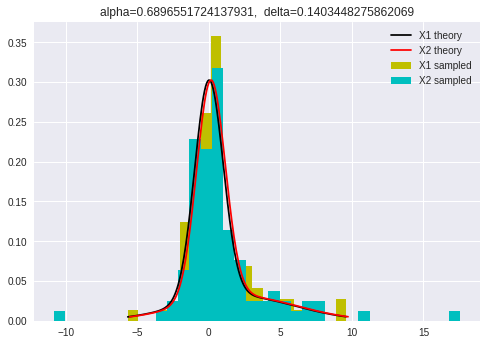


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2323.0, pvalue=0.4873426103065558)


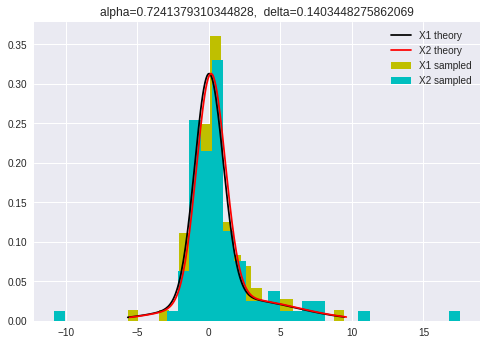


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2323.0, pvalue=0.4873426103065558)


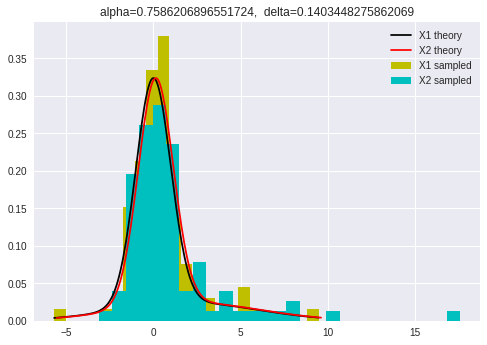


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2345.0, pvalue=0.5359832452872442)


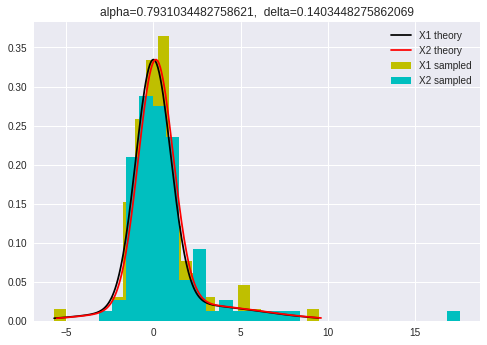


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2390.0, pvalue=0.6425231921087418)


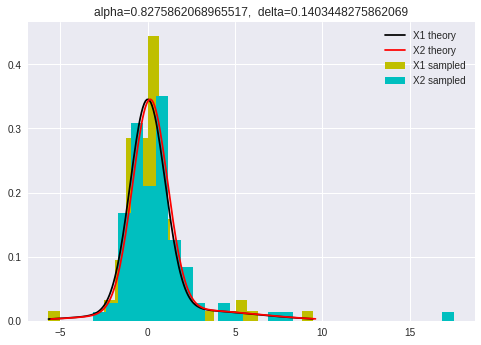


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2347.0, pvalue=0.5405233196725827)


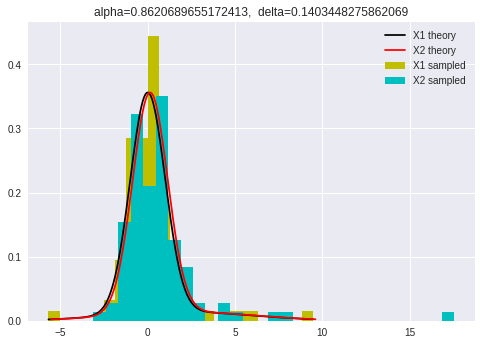


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2326.0, pvalue=0.49383206015649095)


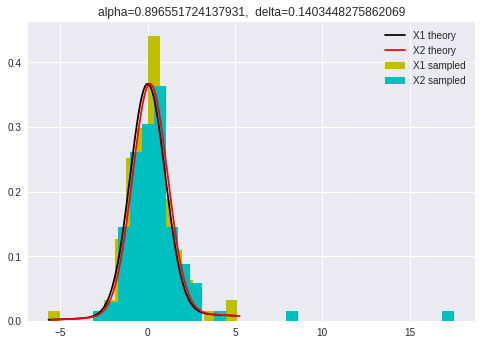


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2301.0, pvalue=0.44119029984120706)


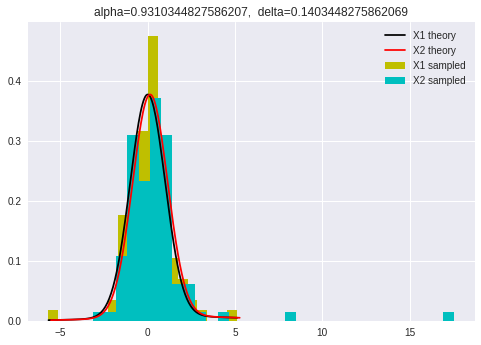


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2275.0, pvalue=0.3900199359079518)


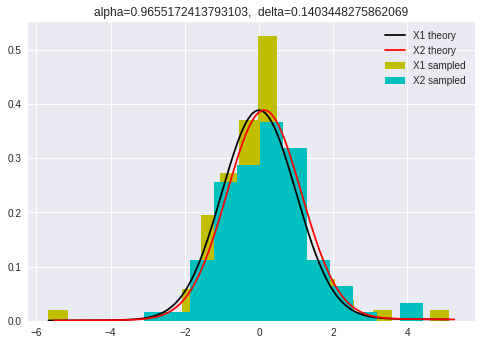


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2237.0, pvalue=0.32205802039588505)


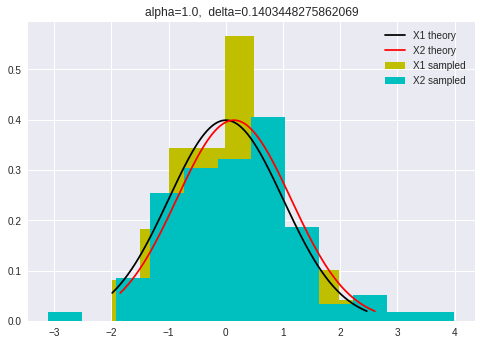

 93%|█████████▎| 28/30 [03:52<00:16,  8.31s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2461.0, pvalue=0.8258300417006286)


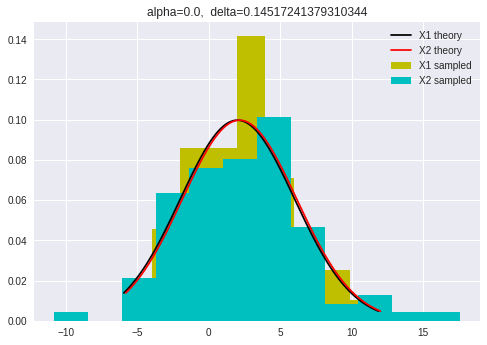


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2427.0, pvalue=0.7361501939167332)


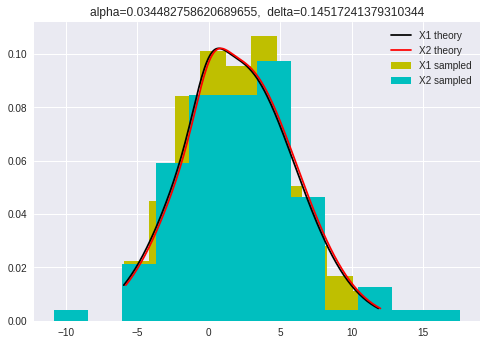


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2403.0, pvalue=0.6748685607674054)


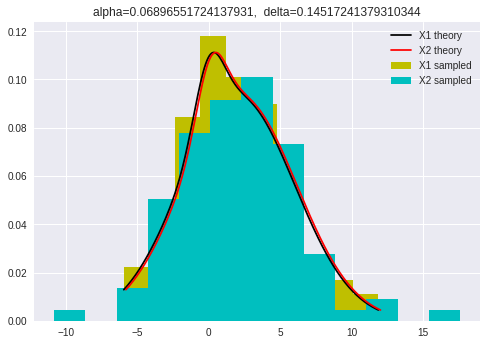


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2394.0, pvalue=0.652407226795377)


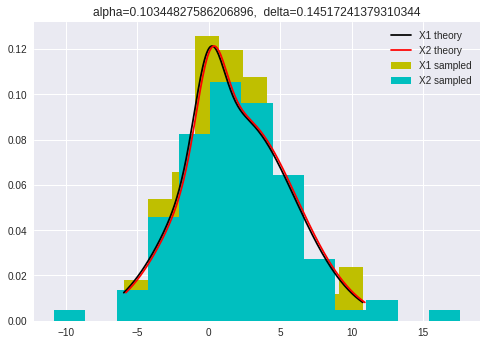


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2396.0, pvalue=0.6573723697180689)


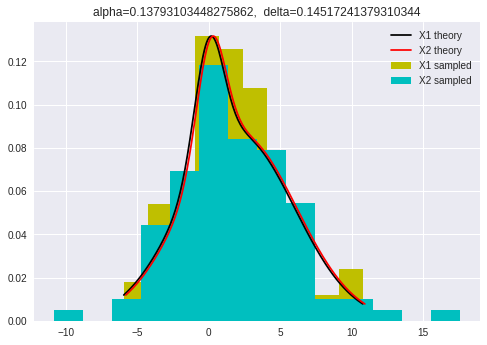


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2434.0, pvalue=0.7543660885045383)


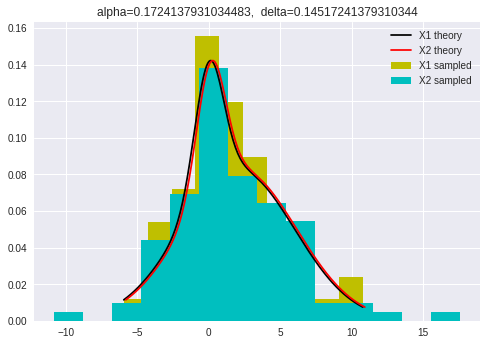


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2423.0, pvalue=0.7258065723197727)


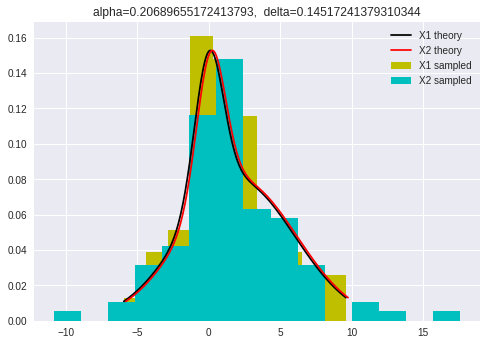


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2396.0, pvalue=0.6573723697180689)


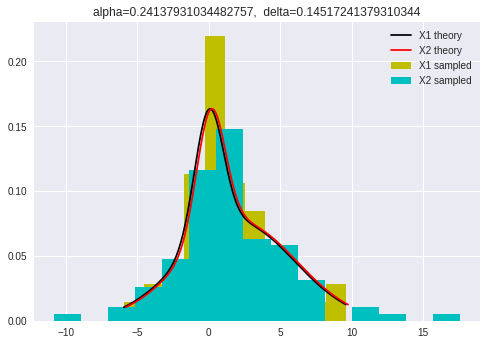


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2437.0, pvalue=0.7622156087305044)


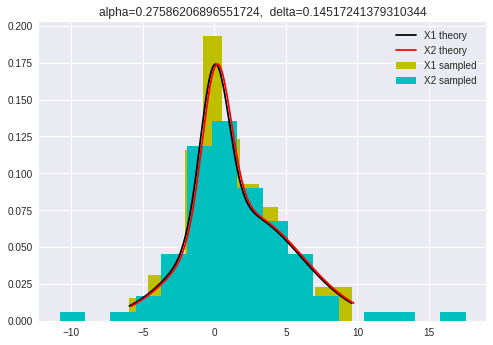


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2490.0, pvalue=0.9042127340742919)


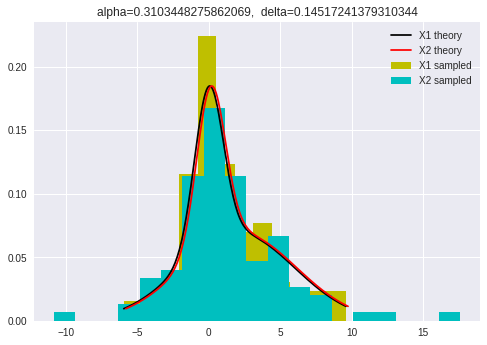


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2455.0, pvalue=0.8098010180054853)


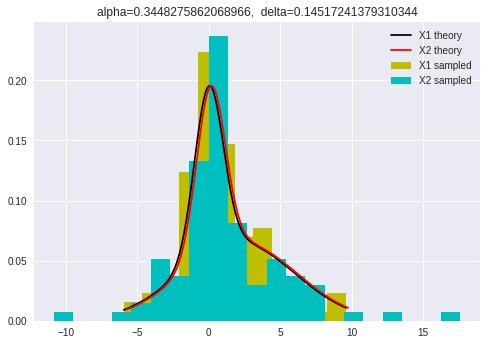


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2429.0, pvalue=0.7413401306177619)


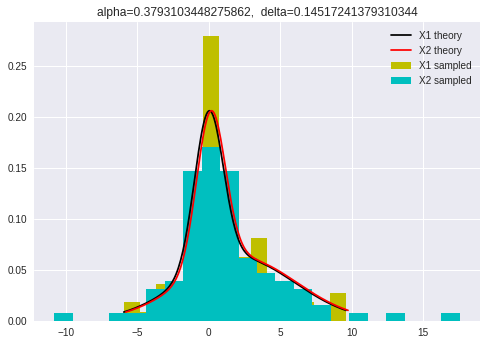


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2407.0, pvalue=0.6849466319950608)


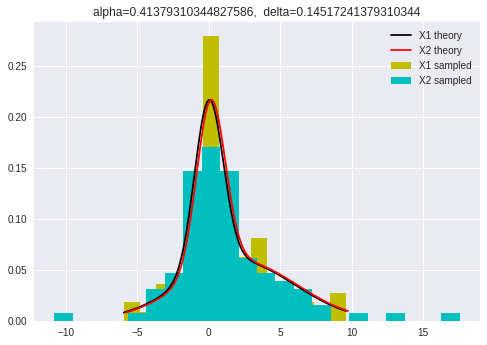


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


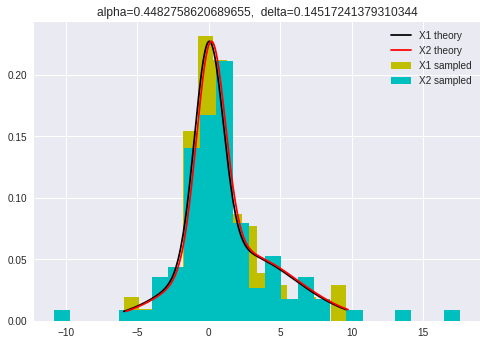


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2431.0, pvalue=0.7465418609724369)


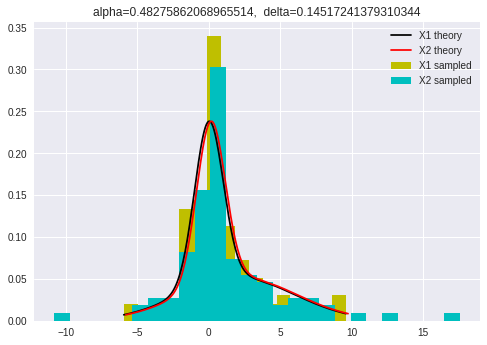


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2445.0, pvalue=0.7832655420427076)


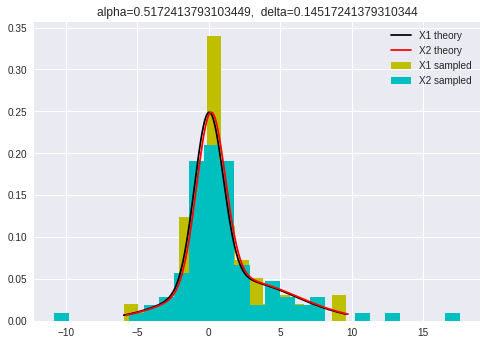


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2382.0, pvalue=0.6229452589763704)


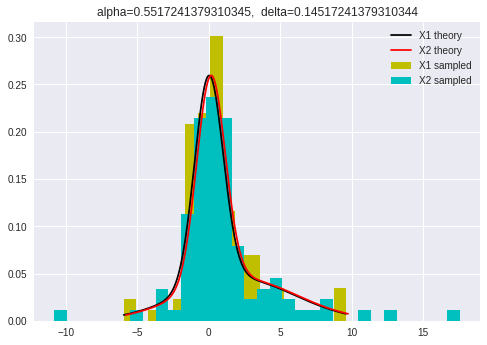


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2401.0, pvalue=0.6698511676891292)


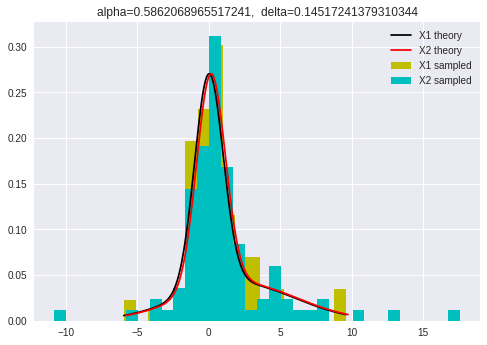


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2388.0, pvalue=0.6376046699936373)


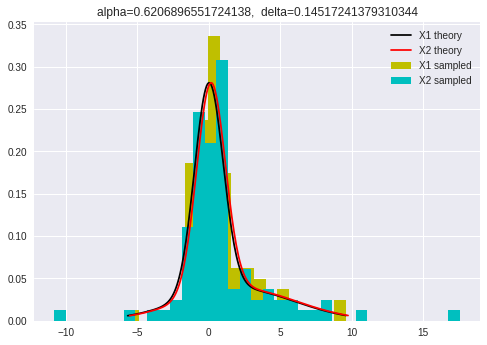


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2357.0, pvalue=0.5635081585027861)


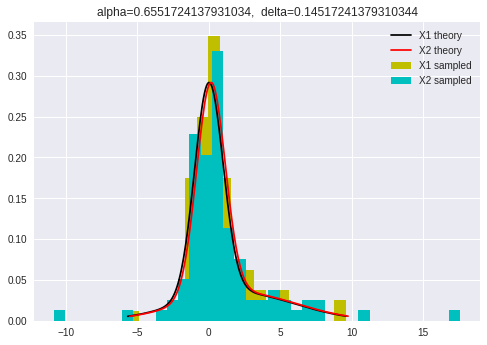


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2327.0, pvalue=0.49600544229157995)


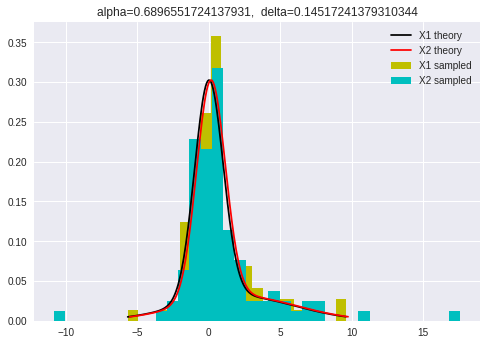


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2308.0, pvalue=0.4555970482246179)


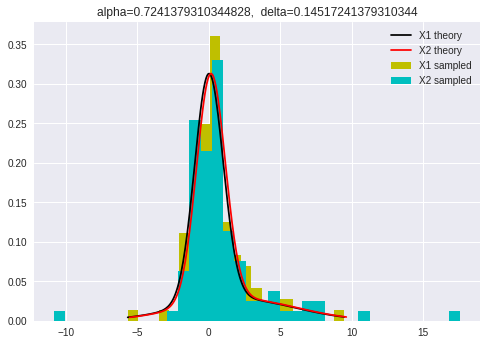


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2308.0, pvalue=0.4555970482246179)


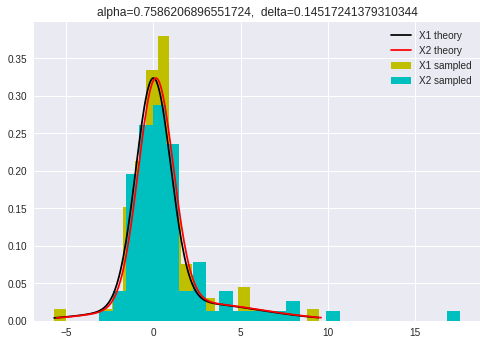


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2328.0, pvalue=0.4981839177712257)


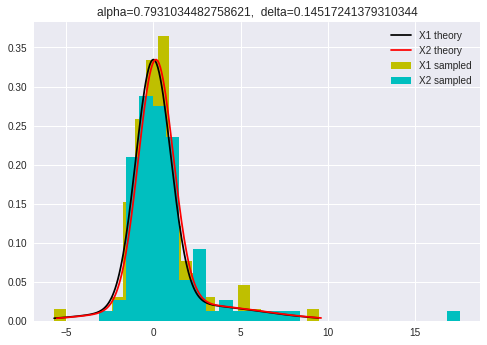


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2374.0, pvalue=0.603630307822939)


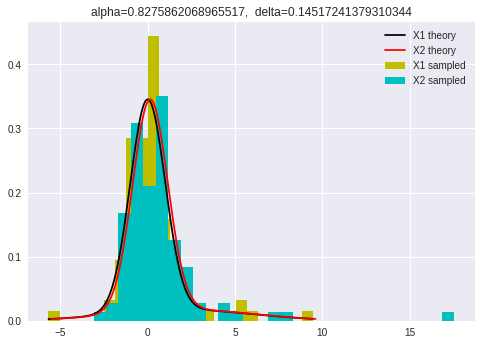


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2332.0, pvalue=0.506948473287772)


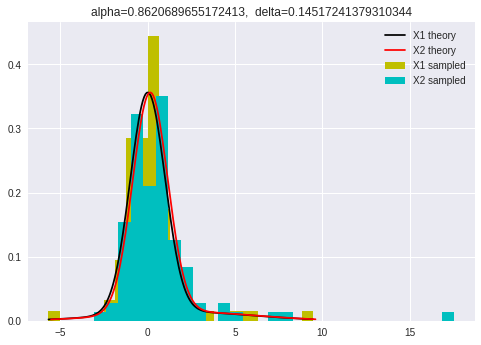


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2311.0, pvalue=0.4618514981768562)


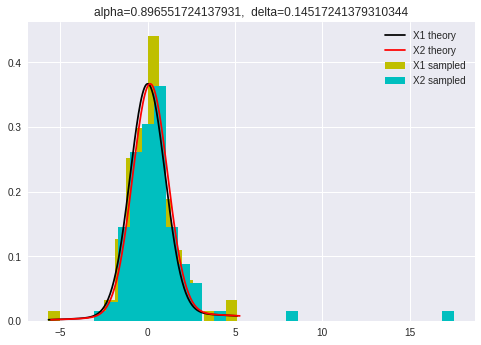


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2286.0, pvalue=0.41121370964410997)


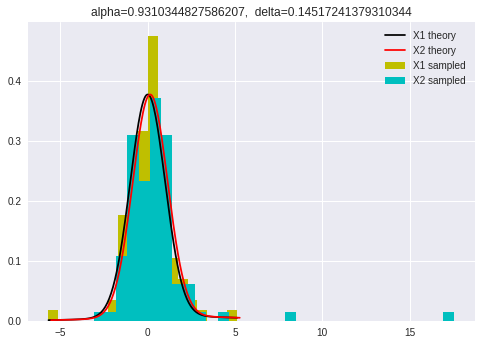


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2260.0, pvalue=0.36221313969657387)


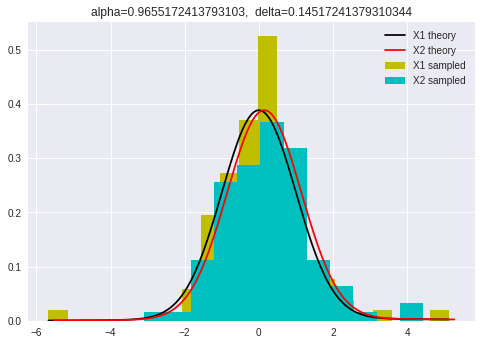


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2220.0, pvalue=0.2943212430119939)


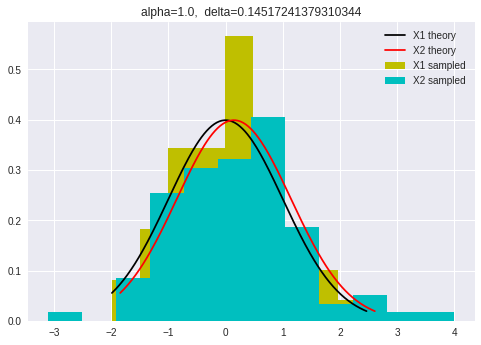

 97%|█████████▋| 29/30 [04:00<00:08,  8.30s/it]


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2457.0, pvalue=0.8151355219610021)


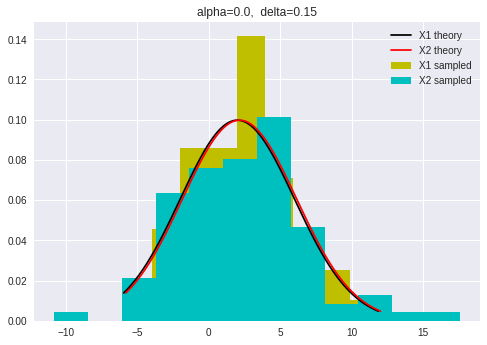


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2423.0, pvalue=0.7258065723197727)


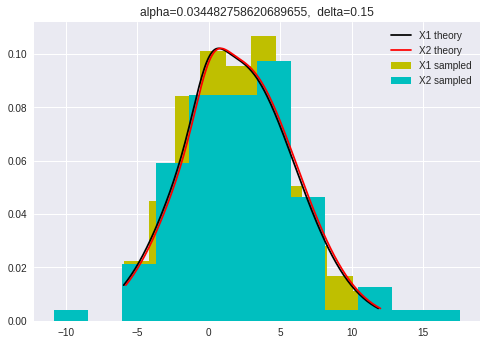


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2400.0, pvalue=0.6673479673381713)


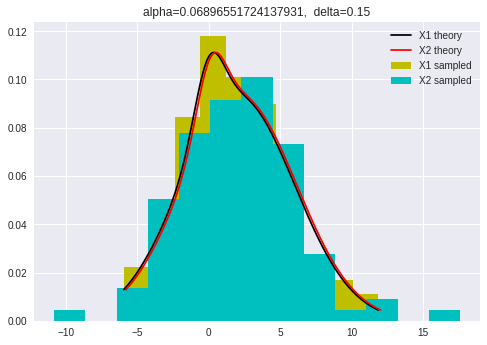


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2392.0, pvalue=0.6474574389756316)


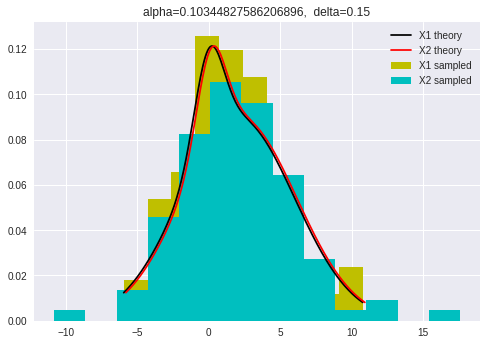


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2394.0, pvalue=0.652407226795377)


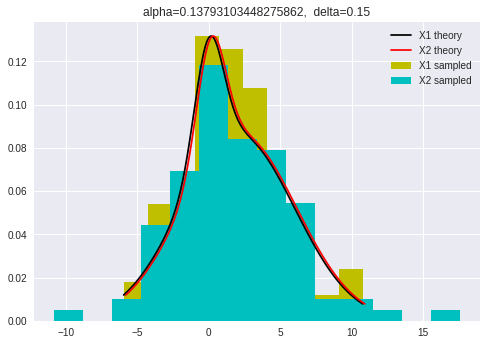


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2433.0, pvalue=0.75175516524754)


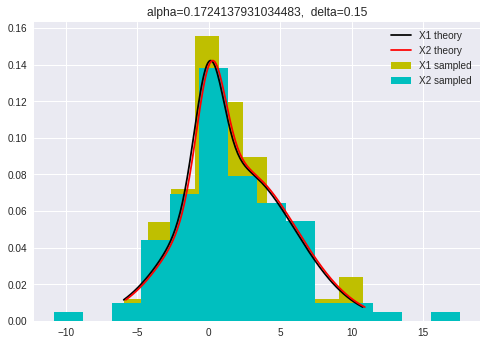


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2421.0, pvalue=0.7206533187202941)


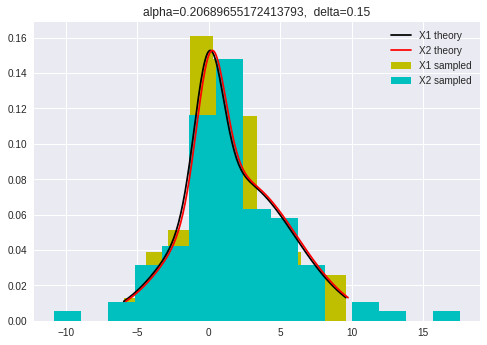


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2394.0, pvalue=0.652407226795377)


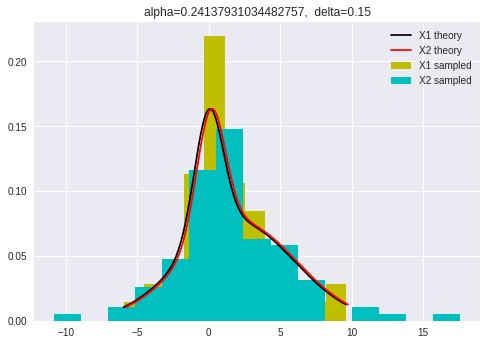


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2435.0, pvalue=0.756979822125134)


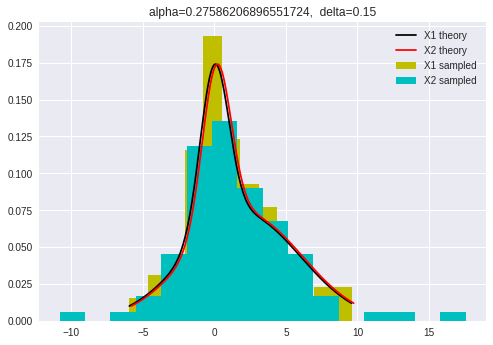


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2487.0, pvalue=0.8960471686012128)


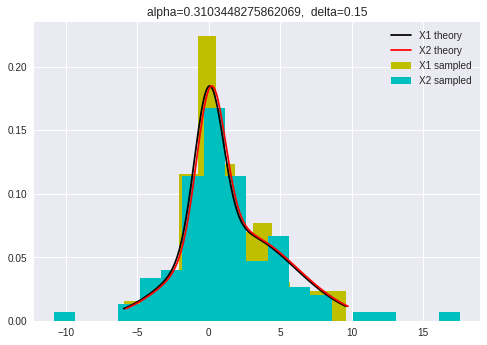


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2452.0, pvalue=0.8018158769149264)


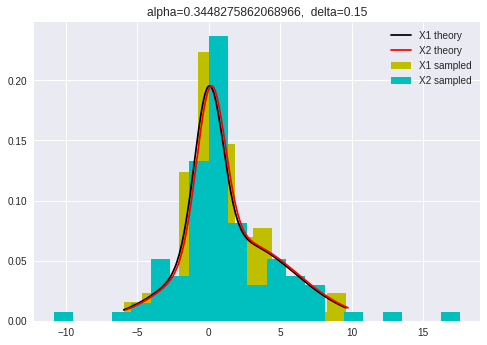


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2426.0, pvalue=0.7335597164128502)


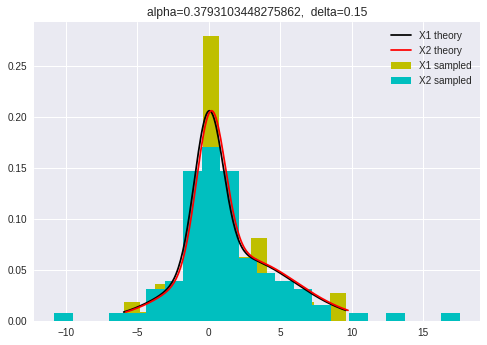


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2404.0, pvalue=0.6773827047880141)


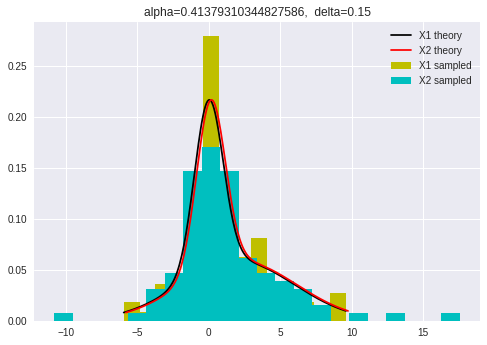


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2432.0, pvalue=0.7491470801654898)


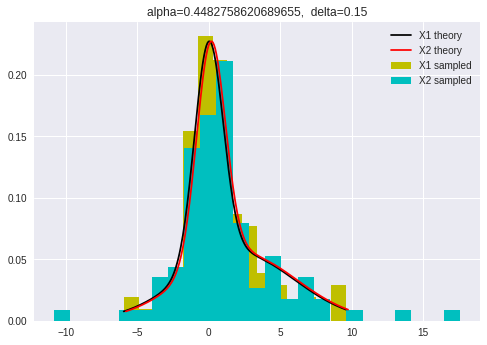


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2428.0, pvalue=0.7387436743898753)


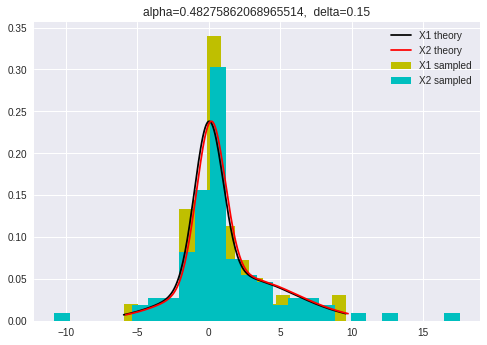


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2442.0, pvalue=0.7753522914731348)


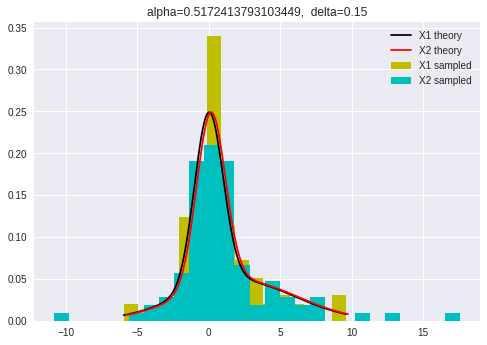


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2379.0, pvalue=0.615670737630266)


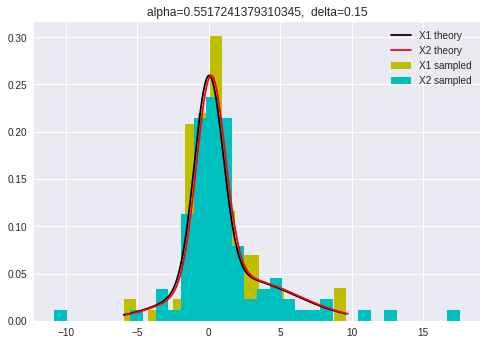


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2399.0, pvalue=0.6648484633803489)


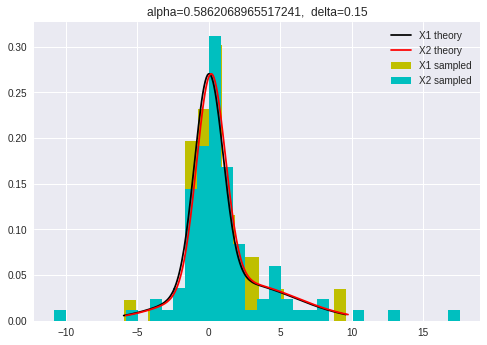


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2385.0, pvalue=0.6302567676905975)


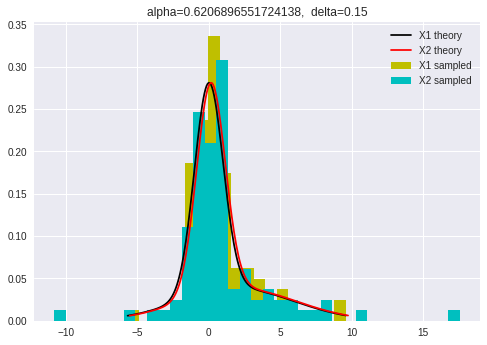


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2353.0, pvalue=0.5542578843858728)


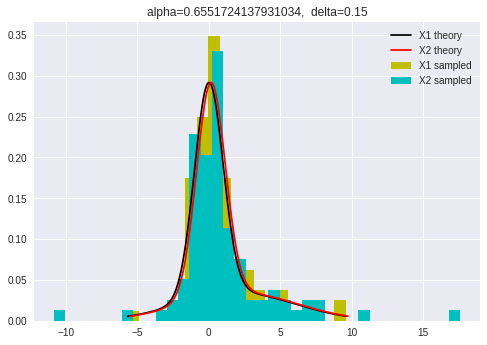


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2322.0, pvalue=0.48518973727290204)


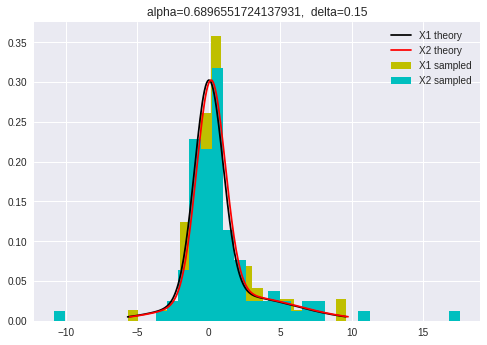


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2302.0, pvalue=0.44323228641200085)


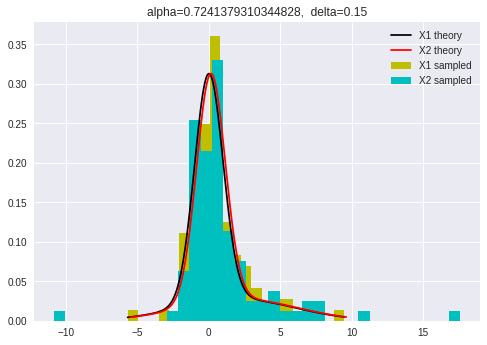


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2302.0, pvalue=0.44323228641200085)


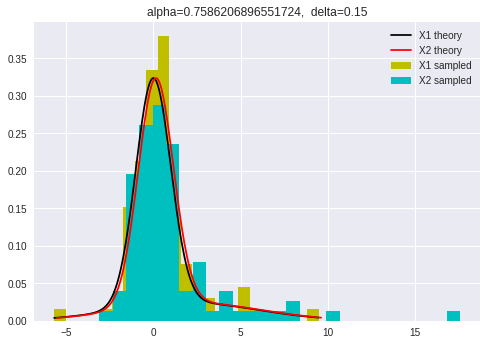


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2321.0, pvalue=0.48304202468022994)


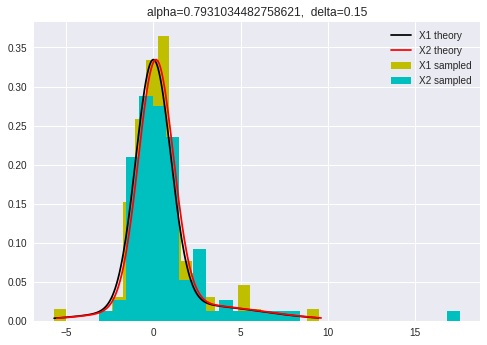


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2366.0, pvalue=0.5845892174029008)


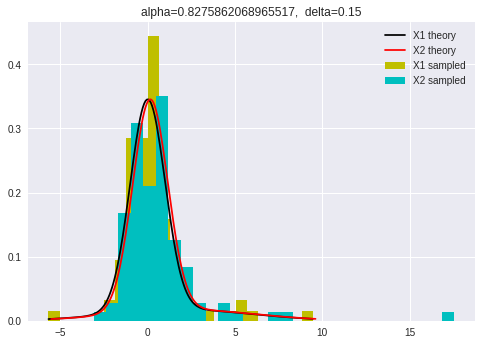


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2324.0, pvalue=0.4895006306680896)


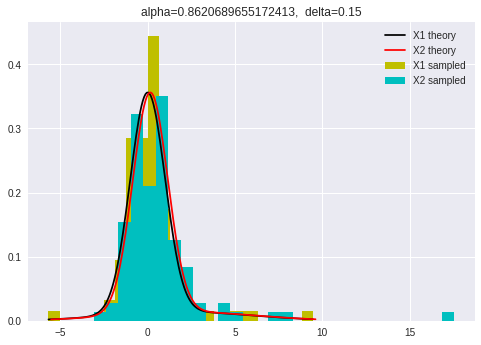


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2301.0, pvalue=0.44119029984120706)


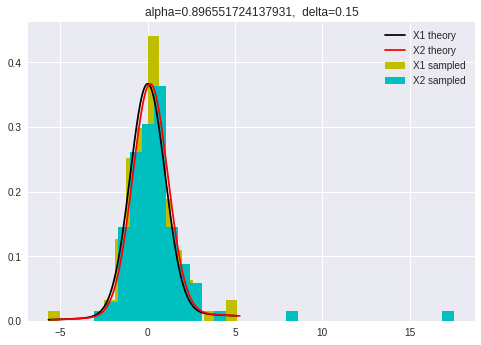


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2275.0, pvalue=0.3900199359079518)


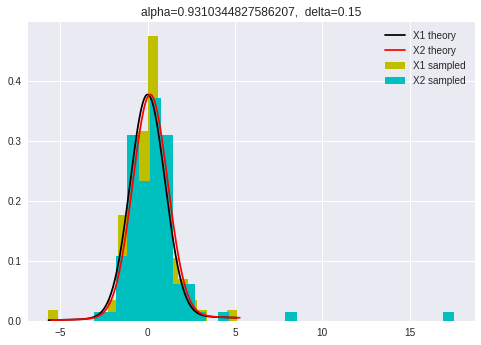


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2249.0, pvalue=0.3426319759495927)


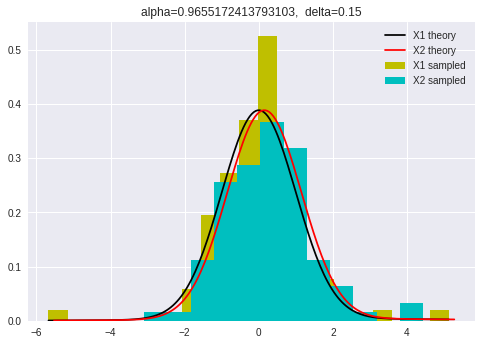


 Посчитаем Уилкоксона: WilcoxonResult(statistic=2207.0, pvalue=0.27422378711525397)


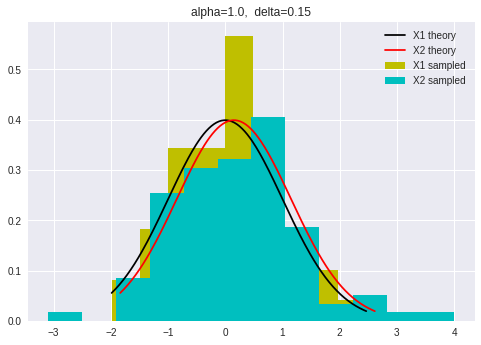

100%|██████████| 30/30 [04:08<00:00,  8.28s/it]


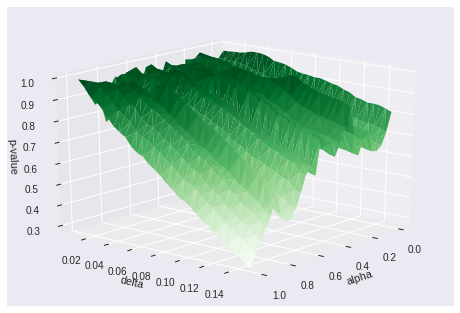

In [88]:
# этот слайд лучше не перезапускать 
 
from mpl_toolkits import mplot3d
res3d = []
alpha_values2 = np.linspace(0, 1, 20)
delta_values2 = np.linspace(0.001, 0.2, 20)
for delta in tqdm(delta_values2):
    for alpha in alpha_values2: 
        res3d.append([alpha, delta, plotting(alpha, delta,pic=False)])
#res2 = main(alpha_values2, delta_values2)

X = [item[0] for item in res3d] #alpha
Y = [item[1] for item in res3d] #delta
Z = [item[2] for item in res3d] #wilcoxon

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_trisurf(X, Y, Z, cmap='Greens')
ax.set_xlabel('alpha')
ax.set_ylabel('delta')
ax.set_zlabel('p-value')
ax.view_init(20, 40)

# 2.3 
Известно, что электричка "Вашингтон-Петушки" аварийно останавливается раз в несколько дней. Аналитики РЖД проанализировали, сколько дней электричка едет без поломок, и составили выборку: x = (3, 22, 13, 6, 18, 5, 6, 10, 7, 15).

РЖД хочет проверить гипотезу, что дисперсия распределения равна 9 против правосторонней альтернативы.

Требуется:

Ввести предположение, каким распределением описывается данная выборка.
Записать задачу формально.
Предложить критерий для оценки дисперсии распределения.
Проверить гипотезу о значении дисперсии распределения для уровня значимости alpha = 0.05 аналитически.
Вывести и получить доверительный интервал для значения дисперсии при alpha = 0.05.


SyntaxError: ignored

Даны результаты работы двух машинных переводчиков на небольших выборках переводов для разных языковых пар. https://github.com/Intelligent-Systems-Phystech/psad-2020/tree/master/lab/lab1/data/mt 

Стандартная оценка качества перевода производится с использованием специальной метрики BLEU. https://en.wikipedia.org/wiki/BLEU (Реализовано https://www.nltk.org/_modules/nltk/translate/bleu_score.html).

Требуется опеделить:

превосходит ли один переводчик в среднем по парам второй переводчик по переводу
связано ли качество перевода для разных языковых пар для двх переводчиков?
При подсчете BLEU учитывать только слова, регистр не учитывать.

Формат данных

Названиие файлов имеет формат lang1_lang2_<translator_id>.txt:

lang_1, lang_2 --- языки (перевод с lang_1 на lang_2).

gold - эталонный вариант, с которым сравнивается перевод от систем машинного перевода.

# 4.1 
Рассмотрим данные из https://github.com/Intelligent-Systems-Phystech/psad-2020/blob/master/lab/lab1/data/corona.csv по числу заболевших и выздоровевших от короновируса в разных странах. Требуется проверить гипотезу о тому, что число выздоровевших людей в стране не зависит от числа заболевших в стране.

Требуется:

1. записать задачу формально;
2. предложить статистику для решения данной задачи;
3. записать приближенно нулевое распределение данной статистики;
4. записать явно правило принятия решения на основе статистики и нулевого распределения для обеспечения уровня значимости alpha = 0.05;
5. проверить гипотезу по записанному критерию, для данных из условия. Противоречат ли они гипотезу?
6. на уровне значимости alpha = 0.05 найти зависимость мощности критерия в зависимости от истинного значения статистики.

Решение - нам нужен коэффициент ранговой корреляции $\tau$ - Кендалла. Аргументы:

*   Она менее чувствительна к большим различиям между рангами наблюдей по сравнению с Спирменом (а у нас различия в данных могут быть в несколько порядков) 
*   Более устойчива к выбросам по сравнению с Пирсоном
* Данные 1 и 2 столбца сами по себе отличаются в разы (или на порядки)
* Лучше Спирмена оценивает выборки небольших объёмов 
* И у нас тут нужна **монотонная** корреляция (а Пирсон линейный). Стоит сказать, что все данные заболеваний и выздоровлений короны носят [экспоненциальный характер](https://koronavirus-ncov.ru/infografika-koronavirusa-covid-19)

Кароче, [Кендалл](https://www.instagram.com/kendalljenner/) - наш выбор. Им и проверяем корреляцию заболевших и выздоровевших.  

$\tau = \frac{P-Q}{0.5*N*(N-1)} = 1 - \frac{4Q}{N(N-1)} =  \frac{4P}{N(N-1)} - 1$ 



1.   Статистика $T(X_1^N, X_2^n) = \tau_{X_1,X_2}$
2.   "для n>10 справедлива аппроксимация нормальным распределением" (с) Слайды Олега Бахтеева (и Михаила Хальмана). Т.е. чем-то вроде $\mathbf{N}(0,\sigma^2)$ где $\sigma = \sqrt{\frac{2(2N+5)}{9N(N-1)}} $ 
3. Критическая точка  двусторонней критической области $T_k = z_k*\sigma$. Где $\mathbb{Ф}(z_k) = 0.5 (1-\alpha)$. При $T_k>|\tau| $ гипотезу отвергаем (т.е. корреляционная связь значимая). 
4.  $Ф(z_k) = 0.5 (1-0.05) = 0.475.$ По таблице $ z_k = 1.96$





In [15]:

#corona = pd.DataFrame()
corona = pd.read_csv("data/corona.csv")
N = len(corona)
sigma2 = (2*N+5)/(4.5*N*(N-1))
corona.head()

,Страна,заболевшие,выздоровевшие
0,германия,2078,25
1,дания,617,1
2,малайзия,149,26
3,австрия,302,4
4,ирак,71,15


In [16]:
Tk = np.sqrt(sigma2)* 1.96
print("Наша критическая точка Tk =",Tk  )


Наша критическая точка Tk = 0.2736091166572282


In [17]:
ill = np.array(corona['заболевшие'].values.tolist())
rec = np.array(corona['выздоровевшие'].values.tolist())
print(ill,rec)


[ 2078   617   149   302    71 80932 12462  1663   178   128   459   195
   702  7869  2284    80    73    70    67   652   639   131   117    85
 10075  2277] [   25     1    26     4    15 62901  1045    12    96    21    19    35
     1   333    12     5     4    34    27     4   118     4     8    17
  2959   183]


In [18]:
from scipy.stats import norm
P = 0
for i in range(N-1):
    for j in range(i+1, N):
        if (ill[i] < ill[j]) == (rec[i] < rec[j]):  # по формуле с лекции
            P+=1
tau = 4*P/(N*(N-1)) - 1
pval = 2*(1 - norm(0, np.sqrt(sigma2)).cdf(np.abs(tau)))
print("P ={}  tau={}  pval={} ".format(P,tau,pval))

P =207  tau=0.27384615384615385  pval=0.04979765287012272 


In [19]:
from scipy.stats import kendalltau
kendalltau(ill, rec, method="asymptotic")

KendalltauResult(correlation=0.28351110894619114, pvalue=0.044325607642096566)

In [20]:
if Tk > tau:
    print("Отвергаем! Поскольку Tk={}>tau={}, мы отвергаем гипотезу о независимости и миримся с существованием значимой корреляции".format(Tk,tau))
else:
    print("Не отвергаем! Поскольку Tk={}<tau={}, данные гипотезе не противоречат и сходу отвергнуть мы не можем".format(Tk,tau))


Не отвергаем! Поскольку Tk=0.2736091166572282<tau=0.27384615384615385, данные гипотезе не противоречат и сходу отвергнуть мы не можем


5) Мощность $w = 1- \beta $ это вероятность принять альтернативу, если она верна (т.е. не совершить ошибку I рода $\beta$)

1.   List item
2.   List item



